In [1]:
#Import packages
#---------------------------------------
import sys
import os
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import matplotlib
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
import glob
import admin_functions as adfn
import trace_analyse as tfn
from tqdm import tqdm

# binarise

In [22]:
fdata = "/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE"
dff_l  = np.sort(glob.glob(f"{fdata}/*regdeltaff*"))
bind_l  = np.sort(glob.glob(f"{fdata}/*regbin*"))


30

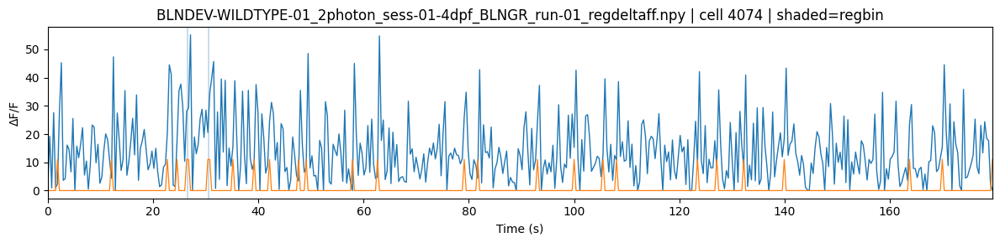

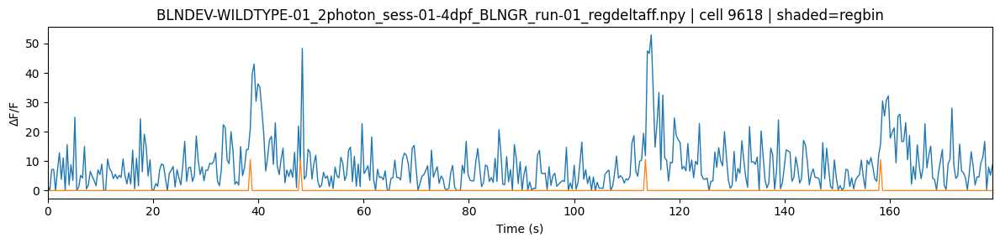

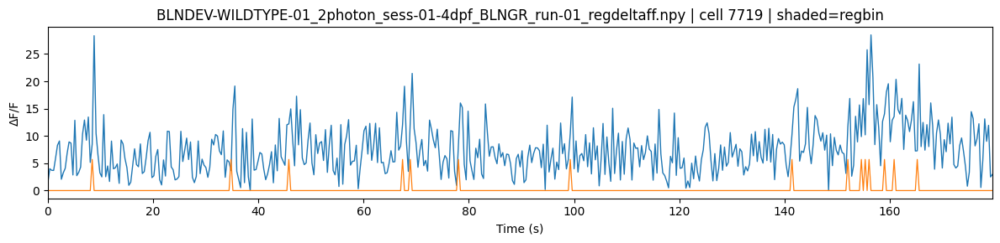

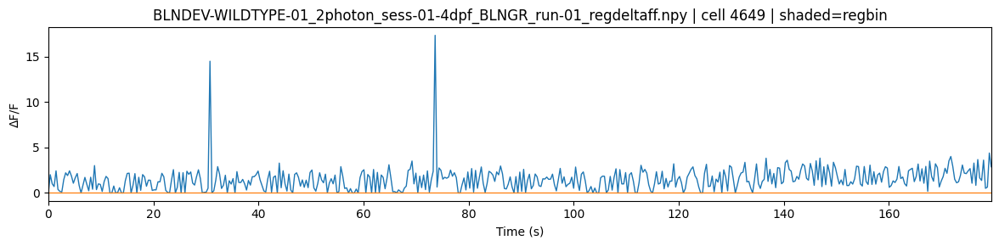

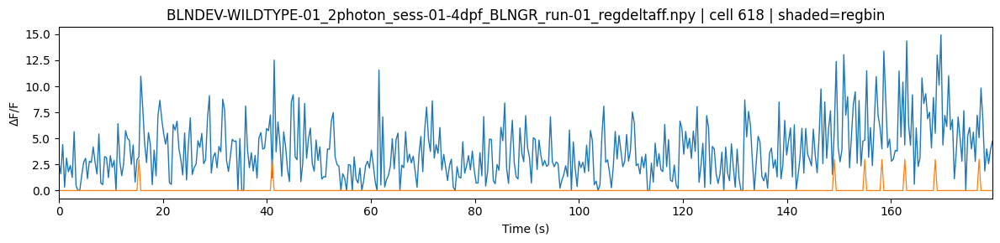

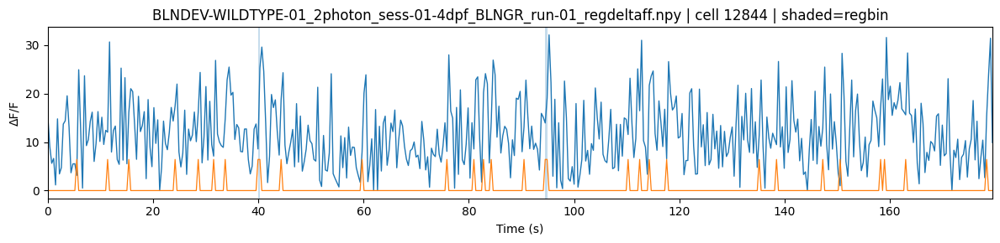

In [24]:
import os, glob
import numpy as np
import matplotlib.pyplot as plt

def sanity_check_bin_vs_dff(
    dff_path: str,
    bin_path: str,
    fs: float = 2.73,
    cells=None,
    n_cells: int = 6,
    t0_s: float = 0.0,
    t1_s: float  = 180.0,
    shade_alpha: float = 0.25,
    show_bin_trace: bool = True,
    bin_trace_scale: float = 0.2,
    seed: int = 0,
):
    """
    Sanity check: overlay pre-binarised periods onto raw dF/F traces.

    Inputs are .npy with shape (cells, time), and bin is 0/1 (or any nonzero=on).

    Plots one figure per cell:
      - raw dF/F trace
      - shaded regions where bin==1
      - optional thin binary trace overlaid (scaled to trace range)

    Parameters
    ----------
    dff_path, bin_path : str
        Paths to matching regdeltaff.npy and regbin.npy files.
    fs : float
        Sampling rate in Hz.
    cells : list[int] | None
        Specific cell indices to plot. If None, randomly sample n_cells.
    n_cells : int
        Number of random cells if cells is None.
    t0_s, t1_s : float | None
        Time window in seconds. If t1_s is None, plot to end.
    shade_alpha : float
        Transparency for shaded ON epochs.
    show_bin_trace : bool
        If True, overlay a scaled binary trace on top of raw.
    bin_trace_scale : float
        Relative height (fraction of dF/F range) for binary overlay.
    seed : int
        RNG seed for random cell selection.

    Returns
    -------
    info : dict
        Metadata including selected cells and shapes.
    """
    dff = np.load(dff_path)
    b   = np.load(bin_path)

    if dff.ndim != 2 or b.ndim != 2:
        raise ValueError(f"Expected 2D arrays. Got dff {dff.shape}, bin {b.shape}")
    if dff.shape != b.shape:
        raise ValueError(f"Shape mismatch: dff {dff.shape} vs bin {b.shape}")

    n_cells_total, T = dff.shape
    if t1_s is None:
        t1_s = (T - 1) / fs

    i0 = max(0, int(round(t0_s * fs)))
    i1 = min(T, int(round(t1_s * fs)))
    if i1 <= i0 + 2:
        raise ValueError("Time window too small; adjust t0_s/t1_s.")

    # coerce bin to 0/1
    b01 = (b != 0).astype(np.uint8)

    # choose cells
    if cells is None:
        rng = np.random.default_rng(seed)
        k = min(int(n_cells), n_cells_total)
        cells = rng.choice(n_cells_total, size=k, replace=False).tolist()
    else:
        cells = [int(c) for c in cells]
        for c in cells:
            if c < 0 or c >= n_cells_total:
                raise IndexError(f"Cell index {c} out of range [0, {n_cells_total-1}]")

    # helper: find contiguous ON epochs
    def _events_from_binary(x):
        x = np.asarray(x).astype(bool)
        if x.size == 0:
            return []
        starts = np.where(~x[:-1] & x[1:])[0] + 1
        ends   = np.where(x[:-1] & ~x[1:])[0]
        if x[0]:
            starts = np.r_[0, starts]
        if x[-1]:
            ends = np.r_[ends, x.size - 1]
        return list(zip(starts.tolist(), ends.tolist()))

    # plot
    base = os.path.basename(dff_path)
    t = np.arange(i0, i1) / fs

    for c in cells:
        y = dff[c, i0:i1]
        x = b01[c, i0:i1]

        fig, ax = plt.subplots(figsize=(12, 3))
        ax.plot(t, y, lw=1.0)

        # shaded epochs
        for s, e in _events_from_binary(x):
            ax.axvspan(t[s], t[e], alpha=shade_alpha)

        # optional binary overlay as a thin line
        if show_bin_trace:
            y0 = np.nanmin(y)
            y1 = np.nanmax(y)
            rngy = y1 - y0 if np.isfinite(y0) and np.isfinite(y1) and y1 > y0 else 1.0
            amp = bin_trace_scale * rngy
            ax.plot(t, y0 + amp * x, lw=0.9)

        ax.set_xlabel("Time (s)")
        ax.set_ylabel("ΔF/F")
        ax.set_title(f"{base} | cell {c} | shaded=regbin")
        ax.margins(x=0)
        plt.tight_layout()
        plt.show()

    return {
        "dff_path": dff_path,
        "bin_path": bin_path,
        "shape": dff.shape,
        "fs": fs,
        "t0_s": t0_s,
        "t1_s": t1_s,
        "cells": cells,
        "window_idx": (i0, i1),
    }


def sanity_check_batch_bin_vs_dff(
    dff_l,
    bind_l,
    fs: float = 2.73,
    n_files: int = 1,
    file_inds=None,
    **plot_kwargs
):
    """
    Batch wrapper: pick files (by index) and run sanity_check_bin_vs_dff on each.

    dff_l and bind_l must be same length and aligned.
    """
    dff_l = list(dff_l)
    bind_l = list(bind_l)
    if len(dff_l) != len(bind_l):
        raise ValueError(f"Length mismatch: len(dff_l)={len(dff_l)} vs len(bind_l)={len(bind_l)}")

    if file_inds is None:
        file_inds = list(range(min(int(n_files), len(dff_l))))
    else:
        file_inds = [int(i) for i in file_inds]

    infos = []
    for i in file_inds:
        infos.append(
            sanity_check_bin_vs_dff(
                dff_path=dff_l[i],
                bin_path=bind_l[i],
                fs=fs,
                **plot_kwargs
            )
        )
    return infos


# -------------------------
# example usage
# -------------------------
fdata = "/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE"
dff_l  = np.sort(glob.glob(f"{fdata}/*regdeltaff*"))
bind_l = np.sort(glob.glob(f"{fdata}/*regbin*"))

# check first file, random 6 cells, first 3 minutes
_ = sanity_check_bin_vs_dff(dff_l[0], bind_l[0], fs=2.73, n_cells=6, t0_s=0, t1_s=180)

# check a couple files
# _ = sanity_check_batch_bin_vs_dff(dff_l, bind_l, fs=2.73, file_inds=[0, 5], n_cells=4, t0_s=60, t1_s=240)


# redo avalanches

In [9]:
! pwd

/home/dburrows/CODE/multiscale_dev_dynamics


In [2]:
fdata = "/home/dburrows/DATA/BLNDEV-WILDTYPE/"
dff_l  = np.sort(glob.glob(f"{fdata}/*regdeltaff*"))
bind_l  = np.sort(glob.glob(f"{fdata}/*regbin*"))
coord_l  = np.sort(glob.glob(f"{fdata}/*labcoord_new*"))
len(dff_l), len(bind_l), len(coord_l)

#A_dir = knn_directed_with_random_reassign(curr, k=15, p=0.01, seed=0)

(30, 30, 30)

In [3]:
#structural connectivity
smat = pd.read_csv(f'{fdata}/structural_connectivity_kunst.csv', index_col=0)
smat

,Anterior_reticular_formation_left,Anterior_reticular_formation_right,Caudal_hypothalamus_left,Caudal_hypothalamus_right,Cerebellum_left,Cerebellum_right,Glossopharyngeal_ganglion_left,Glossopharyngeal_ganglion_right,Habenula_left,Habenula_right,...,Torus_longitudinalis_left,Torus_longitudinalis_right,Torus_semicircularis_left,Torus_semicircularis_right,Trigeminal_ganglion_left,Trigeminal_ganglion_right,Vagal_region_left,Vagal_region_right,Vagus_motor_neurons_left,Vagus_motor_neurons_right
Anterior_reticular_formation_left,52.002520,12.972389,0.000000,0.000000,2.268771,1.111741,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,7.283174,6.594994,0.13643,0.000000,0.638610,2.967593,0.000000,1.058757
Anterior_reticular_formation_right,12.972389,52.002520,0.000000,0.000000,1.111741,2.268771,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,6.594994,7.283174,0.00000,0.136430,2.967593,0.638610,1.058757,0.000000
Caudal_hypothalamus_left,0.000000,0.000000,9.016676,0.000000,0.000000,0.000000,0.000000,0.000000,1.214808,0.000000,...,0.000000,0.000000,1.182909,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
Caudal_hypothalamus_right,0.000000,0.000000,0.000000,9.016676,0.000000,0.000000,0.000000,0.000000,0.000000,1.214808,...,0.000000,0.000000,0.000000,1.182909,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
Cerebellum_left,2.268771,1.111741,0.000000,0.000000,14.004456,1.975008,0.000000,0.000000,0.000000,0.000000,...,0.009709,0.014097,0.280717,0.434597,0.01040,0.000000,0.194808,0.064095,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Trigeminal_ganglion_right,0.000000,0.136430,0.000000,0.000000,0.000000,0.010400,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.505770,0.00000,38.901091,0.000000,0.000000,0.000000,0.000000
Vagal_region_left,0.638610,2.967593,0.000000,0.000000,0.194808,0.064095,6.153344,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,3.886589,0.00000,0.000000,18.578428,0.000000,1.210575,0.000000
Vagal_region_right,2.967593,0.638610,0.000000,0.000000,0.064095,0.194808,0.000000,6.153344,0.000000,0.000000,...,0.000000,0.000000,3.886589,0.000000,0.00000,0.000000,0.000000,18.578428,0.000000,1.210575
Vagus_motor_neurons_left,0.000000,1.058757,0.000000,0.000000,0.000000,0.000000,0.344908,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.210575,0.000000,23.164796,2.193911


In [4]:
import numpy as np
import pandas as pd
import re

def collapse_lr_mean(smat: pd.DataFrame,
                     left_tag="_left",
                     right_tag="_right") -> pd.DataFrame:
    """
    Collapse a hemisphere-split region×region matrix into base-region×base-region
    by averaging over the 2x2 (L/R) blocks. Handles missing L or R for any region.
    """
    # Ensure rows/cols align and are same ordering
    smat = smat.copy()
    assert (smat.index.equals(smat.columns)), "Expected square matrix with matching row/col labels."

    # Map each label -> base region name
    def base_name(x: str) -> str:
        if x.endswith(left_tag):
            return x[:-len(left_tag)]
        if x.endswith(right_tag):
            return x[:-len(right_tag)]
        return x  # if already unsuffixed

    row_base = pd.Index([base_name(x) for x in smat.index], name="region")
    col_base = pd.Index([base_name(x) for x in smat.columns], name="region")

    # Build collapsed matrix by block-averaging with groupby
    tmp = smat.copy()
    tmp.index = row_base
    tmp.columns = col_base

    # groupby over duplicate row/col names and take mean over all entries in each block
    collapsed = tmp.groupby(level=0).mean().T.groupby(level=0).mean().T

    return collapsed

smat_lr = collapse_lr_mean(smat)
# --- after smat_lr = collapse_lr_mean(smat) ---

coarse = {
    # hypothalamus (3 -> 1)
    "Rostral_hypothalamus": "Hypothalamus",
    "Intermediate_hypothalamus": "Hypothalamus",
    "Caudal_hypothalamus": "Hypothalamus",

    # reticular formation (3 -> 1)
    "Anterior_reticular_formation": "Reticular_formation",
    "Intermediate_reticular_formation": "Reticular_formation",
    "Posterior_reticular_formation": "Reticular_formation",

    # medulla stripes (5 -> 1)
    "MO_stripe_1": "Medulla",
    "MO_stripe_2": "Medulla",
    "MO_stripe_3": "Medulla",
    "MO_stripe_4": "Medulla",
    "MO_stripe_5": "Medulla",
}

# relabel (anything not in dict keeps its own name), then block-mean rows+cols
smat_coarse = (
    smat_lr.rename(index=lambda x: coarse.get(x, x), columns=lambda x: coarse.get(x, x))
          .groupby(level=0).mean()
          .T.groupby(level=0).mean().T)

df = smat_coarse.copy()
df = df.loc[df.columns, df.columns].copy()
np.fill_diagonal(df.values, 0)
smat_coarse = df

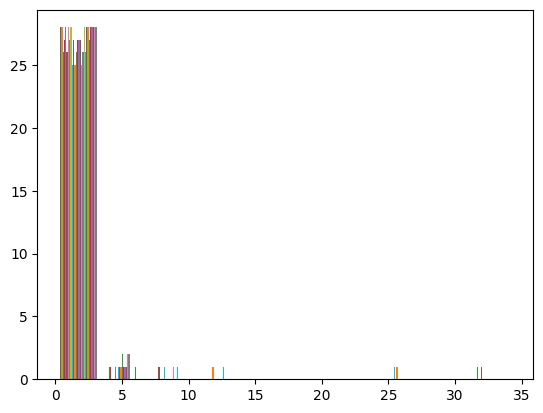

In [76]:
plt.hist(smat_coarse.values)
plt.show()

In [530]:
smat_coarse.columns

Index(['Cerebellum', 'Glossopharyngeal_ganglion', 'Habenula', 'Hypothalamus',
       'Inferior_olive', 'Interpeduncular_nucleus',
       'Medial_octavolateral_nucleus', 'Medulla', 'Octaval_ganglion',
       'Olfactory_bulb', 'Olfactory_epithelium', 'Pallium', 'Pituitary',
       'Posterior_tuberculum', 'Preoptic_region', 'Pretectum', 'Raphe_nucleus',
       'Reticular_formation', 'Retina', 'Subpallium', 'Tectum', 'Tegmentum',
       'Thalamus', 'Torus_longitudinalis', 'Torus_semicircularis',
       'Trigeminal_ganglion', 'Vagal_region', 'Vagus_motor_neurons'],
      dtype='object', name='region')

In [5]:
#map regions
newreg_l = np.array(['Cerebellum', 'Habenula', 'Hindbrain (rhombomeres)',
       'Hypothalamus', 'Locus coeruleus', 'Mauthner', 'Medulla',
       'Midbrain (other)', 'NucMLF', 'Olfactory bulb',
       'Optic tectum - SPV', 'Optic tectum - neuropil', 'Other',
       'Pallium', 'Preoptic area', 'Pretectum', 'Raphe', 'Subpallium',
       'Tectal band/Griseum', 'Thalamus', 'Torus longitudinalis',
       'Torus semicircularis', 'Vestibular/spinal', 'Other',
        'Other/Drop'])

#our structural matrix coarse regions
atlas_regions = np.array([
    'Cerebellum', 'Glossopharyngeal_ganglion', 'Habenula', 'Hypothalamus',
    'Inferior_olive', 'Interpeduncular_nucleus', 'Medial_octavolateral_nucleus',
    'Medulla', 'Octaval_ganglion', 'Olfactory_bulb', 'Olfactory_epithelium',
    'Pallium', 'Pituitary', 'Posterior_tuberculum', 'Preoptic_region',
    'Pretectum', 'Raphe_nucleus', 'Reticular_formation', 'Retina',
    'Subpallium', 'Tectum', 'Tegmentum', 'Thalamus',
    'Torus_longitudinalis', 'Torus_semicircularis', 'Trigeminal_ganglion',
    'Vagal_region', 'Vagus_motor_neurons'
], dtype=object)

atlas_set = set(atlas_regions.tolist())

# proposed mapping
reg_map = {
    'Cerebellum': 'Cerebellum',
    'Habenula': 'Habenula',
    'Hindbrain (rhombomeres)': 'Reticular_formation',   # broad hindbrain catch-all
    'Hypothalamus': 'Hypothalamus',
    'Locus coeruleus': 'Reticular_formation',          # closest available atlas bucket
    'Mauthner': 'Medulla',                             # Mauthner cell bodies in hindbrain/medulla region
    'Medulla': 'Medulla', 
    'Midbrain (other)': 'Tegmentum',  #
    'NucMLF': 'Nan',  #
    'Olfactory bulb': 'Olfactory_bulb',
    'Optic tectum - SPV': 'Tectum',
    'Optic tectum - neuropil': 'Tectum',
    'Other': 'Nan',
    'Pallium': 'Pallium',
    'Preoptic area': 'Preoptic_region',
    'Pretectum': 'Pretectum',
    'Raphe': 'Raphe_nucleus',
    'Subpallium': 'Subpallium',
    'Tectal band/Griseum': 'Tectum',
    'Thalamus': 'Thalamus',
    'Torus longitudinalis': 'Torus_longitudinalis',
    'Torus semicircularis': 'Torus_semicircularis',
    'Vestibular/spinal': 'Nan', #  # vestibular-ish; spinal has no direct match,
    'Other': 'Nan',
    'Other/Drop': 'Nan'
}

# ensure anything not in atlas becomes NA
reg_map = {k: (v if (isinstance(v, str) and v in atlas_set) else 'Nan') for k, v in reg_map.items()}

# optional sanity checks
missing_keys = [r for r in newreg_l if r not in reg_map]
bad_values = {k: v for k, v in reg_map.items() if isinstance(v, str) and v not in atlas_set}
print("missing_keys:", missing_keys)
print("bad_values:", bad_values)

import numpy as np

def map_regions(region_names: np.ndarray, reg_map: dict, unknown=np.nan):
    """
    region_names: array-like of strings (any shape)
    reg_map: dict {old_name: new_name_or_nan}
    unknown: value to use when key not found (default np.nan)
    """
    region_names = np.asarray(region_names, dtype=object)
    vmap = np.vectorize(lambda x: reg_map.get(x, unknown), otypes=[object])
    return vmap(region_names)

missing_keys: []
bad_values: {'NucMLF': 'Nan', 'Other': 'Nan', 'Vestibular/spinal': 'Nan', 'Other/Drop': 'Nan'}


In [51]:
#add new name to all
for c in coord_l:
    curr = np.load(c)
    extra = map_regions(curr[:,-1], reg_map)
    new = np.column_stack((curr, extra))
    np.save(c, new)

In [4]:
# build new probabilistic nnb

# start with local probability -> some exponential decay.
# sample each neuron -> based on connections, setup exponential; sum together
curr = np.load(coord_l[0], allow_pickle=True)
xyz = curr[:,:3].astype(float) * [.8, .8, 15] #define distance of each pixel in x,y,z


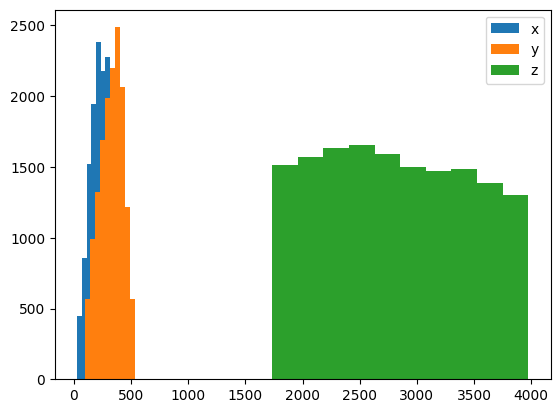

In [5]:
plt.hist(xyz[:,0].astype(float), label='x')
plt.hist(xyz[:,1].astype(float), label='y')
plt.hist(xyz[:,2].astype(float), label='z')
plt.legend()
plt.show()

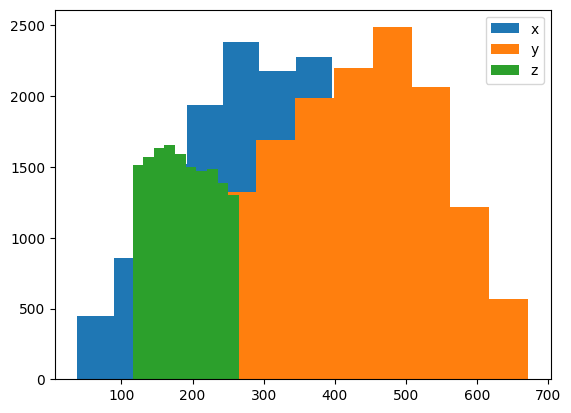

In [6]:
plt.hist(curr[:,0].astype(float), label='x')
plt.hist(curr[:,1].astype(float), label='y')
plt.hist(curr[:,2].astype(float), label='z')
plt.legend()
plt.show()

In [39]:
coord_l[0]

np.str_('/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-4dpf_BLNGR_run-01_labcoord_newreg.npy')

In [38]:
# build new probabilistic nnb

# start with local probability -> some exponential decay.
# sample each neuron -> based on connections, setup exponential; sum together
curr = np.load(coord_l[0], allow_pickle=True)
xyz = curr[:,:3].astype(float) * [.8, .8, 15] #define distance of each pixel in x,y,z

In [40]:
#weight each neuron pair for sConn
atlas_ind = smat_coarse.columns #order of indeces
labels = curr[:,-1]
labels = np.asarray(labels, dtype=object)  # shape (N,)
df= pd.DataFrame(data=np.append(np.arange(0,len(atlas_ind)),np.nan), index=np.append(atlas_ind, 'Nan'))
curr_index = df.loc[labels] #indeces of each of my labels to map back to atlas

M = smat_coarse.to_numpy()          # (R, R)
R = M.shape[0]
# pad with an extra row/col of zeros (or np.nan if you prefer)
Mpad = np.zeros((R+1, R+1), dtype=M.dtype)
Mpad[:R, :R] = M

idx = curr_index[0].to_numpy()         # (N,) floats with nan
valid = np.isfinite(idx)

idx_i = np.where(valid, idx.astype(np.int64), R)   # missing -> R (the padded slot)
smat_w = Mpad[idx_i[:, None], idx_i[None, :]] # (N, N)

In [41]:
# add in local probability
local_p = np.zeros((xyz.shape[0], xyz.shape[0]))
coords = np.asarray(xyz[:,:3].astype(float), dtype=np.float64)   # (N,3)
pre_coord = coords[:,None]
post_coord = coords[None,:]
D = np.linalg.norm(pre_coord - post_coord, axis=2)  # (N,N)
pairs_sorted = sorted(zip(labels, np.arange(len(labels))), key=lambda t: t[0])

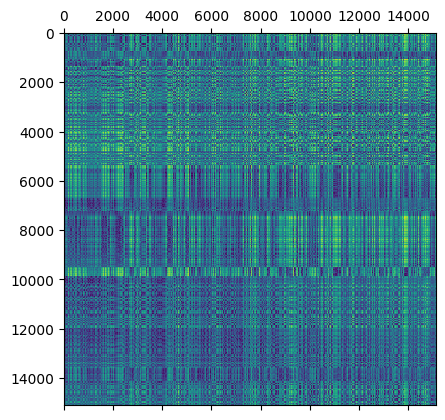

In [72]:
plt.matshow(D[np.array([i[1] for i in pairs_sorted])])

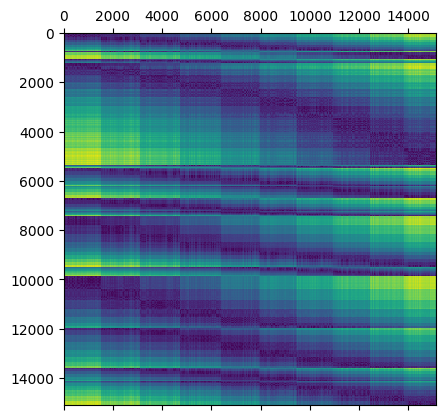

In [77]:
plt.matshow(D[np.array([i[1] for i in pairs_sorted])])

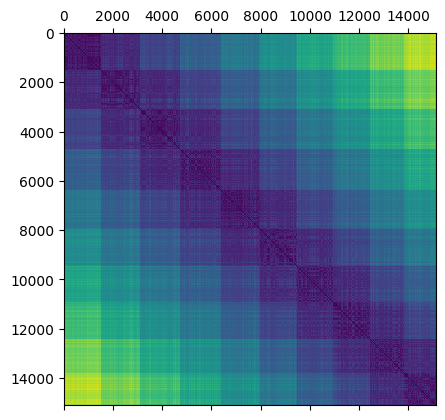

In [25]:
plt.matshow(D)

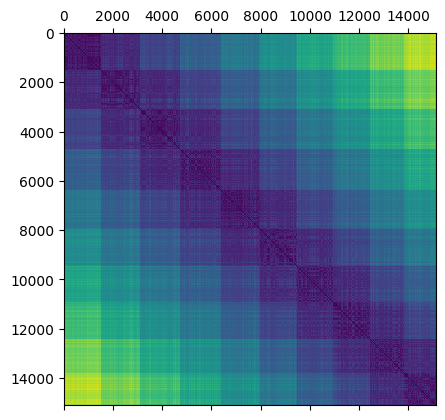

In [78]:
plt.matshow(D)

In [96]:
def prob_exp_dropoff(D_um, lam_um=50.0, p0=0.5, zero_diag=True, clip=True):
    """
    D_um: (N,N) distances in microns
    lam_um: exponential length scale in microns
    p0: probability at distance 0
    """
    D = np.asarray(D_um, dtype=float)
    P = p0 * np.exp(-D / lam_um)
    # if zero_diag:
    #     np.fill_diagonal(P, 0.0)
    if clip:
        P = np.clip(P, 0.0, 1.0)
    return P

# usage
#P = prob_exp_dropoff(D, lam_um=80.0, p0=0.5)

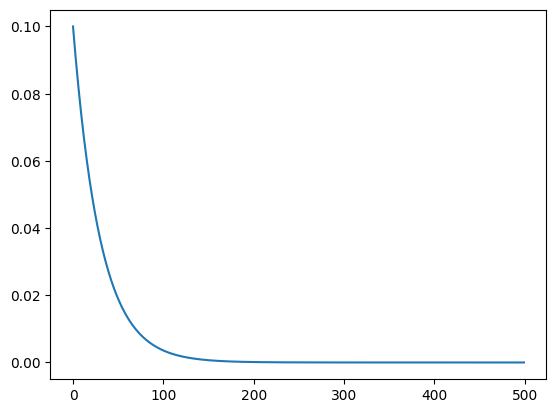

In [217]:
d = np.arange(0,500)
p = prob_exp_dropoff(d, lam_um=30.0, p0=0.1)
plt.plot(d,p)
plt.show()

In [7]:
import numpy as np

def prob_dist(D_um, S, lam_um=80.0, p0=0.05, beta=3.0,
                              s_scale="max", zero_diag=True):
    """
    p = p0 * exp(-D/lam) * (1 + beta * S_norm)
    - distance sets locality
    - S only scales probabilities (esp. long-range), doesn't create connections alone
    """
    D = np.asarray(D_um, float)
    S = np.asarray(S, float)
    S = np.clip(S, 0, None)

    if s_scale == "max":
        denom = np.nanmax(S) + 1e-12
    else:  # e.g. s_scale=99 for percentile
        denom = np.nanpercentile(S, float(s_scale)) + 1e-12
    S_norm = np.clip(S / denom, 0, 1)

    P = p0 * np.exp(-D / lam_um) * (1.0 + (beta * S_norm))
    P = np.clip(P, 0.0, 1.0)

    if zero_diag:
        np.fill_diagonal(P, 0.0)
    return P

In [54]:
P = prob_exp_dropoff(D, lam_um=50.0, p0=0.7)
plt.matshow(P)

NameError: name 'prob_exp_dropoff' is not defined

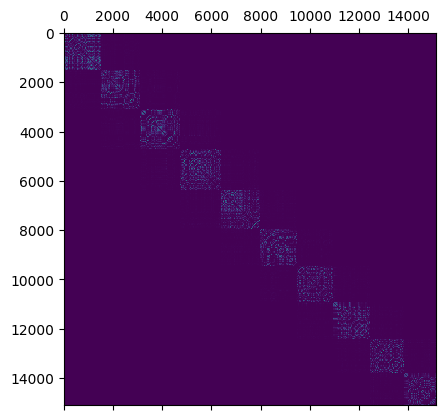

In [56]:
#weight the two together
#function to weight by distance
#function to weight by sconn
p_mat = prob_dist(D, smat_w, lam_um=50.0, p0=0.1, beta=1,
                              s_scale="max", zero_diag=True)
plt.matshow(p_mat)

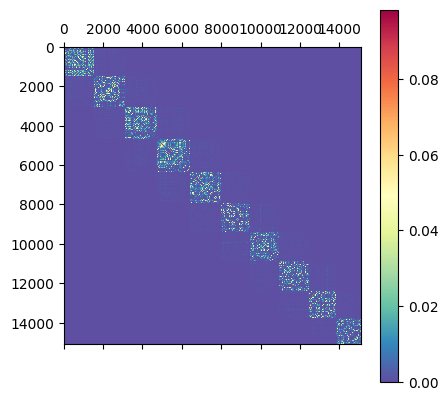

In [57]:
#weight the two together
#function to weight by distance
#function to weight by sconn
p_mat = prob_dist(D, smat_w, lam_um=50.0, p0=0.1, beta=0,
                              s_scale="max", zero_diag=True)
from matplotlib.colors import LogNorm
plt.matshow(p_mat, cmap="Spectral_r")#,norm=LogNorm())
plt.colorbar()

In [546]:
curr[:,-1]

array(['Tectum', 'Reticular_formation', 'Cerebellum', ...,
       'Torus_semicircularis', 'Reticular_formation', 'Nan'],
      shape=(15105,), dtype=object)

In [6]:
def nnb(curr=None, smat_coarse=None, lam_um = 180, p0=0.6, beta=40):
    # build new probabilistic nnb
    
    # start with local probability -> some exponential decay.
    # sample each neuron -> based on connections, setup exponential; sum together
    xyz = curr[:,:3].astype(float) * [.8, .8, 15] #define distance of each pixel in x,y,z
    #weight each neuron pair for sConn
    atlas_ind = smat_coarse.columns #order of indeces
    labels = curr[:,-1]
    labels = np.asarray(labels, dtype=object)  # shape (N,)
    df= pd.DataFrame(data=np.append(np.arange(0,len(atlas_ind)),np.nan), index=np.append(atlas_ind, 'Nan'))
    curr_index = df.loc[labels] #indeces of each of my labels to map back to atlas
    
    M = smat_coarse.to_numpy()          # (R, R)
    R = M.shape[0]
    # pad with an extra row/col of zeros (or np.nan if you prefer)
    Mpad = np.zeros((R+1, R+1), dtype=M.dtype)
    Mpad[:R, :R] = M
    
    idx = curr_index[0].to_numpy()         # (N,) floats with nan
    valid = np.isfinite(idx)
    
    idx_i = np.where(valid, idx.astype(np.int64), R)   # missing -> R (the padded slot)
    smat_w = Mpad[idx_i[:, None], idx_i[None, :]] # (N, N)
    # add in local probability
    local_p = np.zeros((xyz.shape[0], xyz.shape[0]))
    coords = np.asarray(xyz[:,:3].astype(float), dtype=np.float64)   # (N,3)
    pre_coord = coords[:,None]
    post_coord = coords[None,:]
    D = np.linalg.norm(pre_coord - post_coord, axis=2)  # (N,N)

    p_mat = prob_dist(D, smat_w, lam_um=lam_um, p0=p0, beta=beta,
                              s_scale="max", zero_diag=True)

    return(p_mat)

In [221]:
#process and save nnbs
for x,c in tqdm(enumerate(coord_l), total=len(coord_l)):
    curr = np.load(c, allow_pickle=True)
    pmat = nnb(curr=curr, smat_coarse=smat_coarse, lam_um=30, p0=0.1, beta=0.5)
    root,ext = os.path.splitext(c)
    np.save(root[:-15] + 'nnb.npy', pmat)

100%|██████████| 30/30 [02:47<00:00,  5.59s/it]


In [37]:
bind_l  = np.sort(glob.glob(f"{fdata}/*regbin*"))
coord_l  = np.sort(glob.glob(f"{fdata}/*labcoord_new*"))
nnb_l = np.sort(glob.glob(f"{fdata}/*nnb*"))
len(bind_l), len(coord_l), len(nnb_l)

(30, 30, 30)

In [8]:
import numpy as np
from tqdm import tqdm

#=======================================================================
def avalanche(nnb, bind, min_size=3, seed_min_neigh=2, backfill_stop=30, show_pbar=True):
#=======================================================================
    binarray = (bind > 0).astype(np.uint8)
    nnbarray = (nnb > 0)
    N, T = binarray.shape
    pkg = np.zeros((N, T), dtype=np.int32)
    marker = 0

    t_iter = range(T - 1)
    if show_pbar:
        t_iter = tqdm(t_iter, total=T-1, desc="Avalanches", leave=True)

    for t in t_iter:
        cid = np.where(binarray[:, t] > 0)[0]
        if cid.size == 0:
            continue

        for c in cid:
            if pkg[c, t] == 0:
                neigh = np.where(nnbarray[c, :])[0]
                if np.intersect1d(neigh, cid).size > seed_min_neigh:
                    marker += 1
                    pkg[c, t] = marker

            neighbour = np.where(nnbarray[c, :])[0]
            neighbouron = np.intersect1d(cid, neighbour)
            if neighbouron.size == 0:
                continue

            where0 = np.where(pkg[neighbouron, t] == 0)[0]

            if where0.size < neighbouron.size:
                oldav = np.unique(pkg[neighbouron, t])
                realav = oldav[oldav > 0]
                if realav.size == 0:
                    continue

                firstav = int(realav.min())
                uniteav = np.where(np.isin(pkg[:, t], realav))[0]
                pkg[uniteav, t] = firstav
                pkg[c, t] = firstav

                convertav = realav[realav != firstav]
                back = min(t, backfill_stop)
                for av_id in convertav:
                    av_id = int(av_id)
                    for dt in range(1, back + 1):
                        fill = np.where(pkg[:, t - dt] == av_id)[0]
                        if fill.size:
                            pkg[fill, t - dt] = firstav
            else:
                if pkg[c, t] > 0:
                    pkg[neighbouron[where0], t] = pkg[c, t]

        # propagate to t+1
        n_av = np.unique(pkg[:, t])
        n_av = n_av[n_av > 0]
        if n_av.size == 0:
            continue

        cid2 = np.where(binarray[:, t + 1] > 0)[0]
        if cid2.size == 0:
            continue
        active2 = np.zeros(N, dtype=bool)
        active2[cid2] = True

        for n in n_av:
            cgroup = np.where(pkg[:, t] == n)[0]
            if cgroup.size == 0:
                continue
            nbr = np.where(nnbarray[cgroup, :])[1]
            if nbr.size == 0:
                continue
            nbr = np.unique(nbr)
            cand = nbr[active2[nbr]]
            cand = cand[pkg[cand, t + 1] == 0]
            if cand.size:
                pkg[cand, t + 1] = int(n)

    ids, counts = np.unique(pkg, return_counts=True)
    mask = ids > 0
    ids = ids[mask].astype(np.int32)
    avsize = counts[mask].astype(np.int64)

    if ids.size == 0:
        return np.zeros((2, 0), dtype=np.int64), pkg

    framesvec = np.array([(pkg == i).any(axis=0).sum() for i in ids], dtype=np.int32)
    keep = avsize >= min_size
    av = np.vstack((avsize[keep], framesvec[keep]))
    return av, pkg

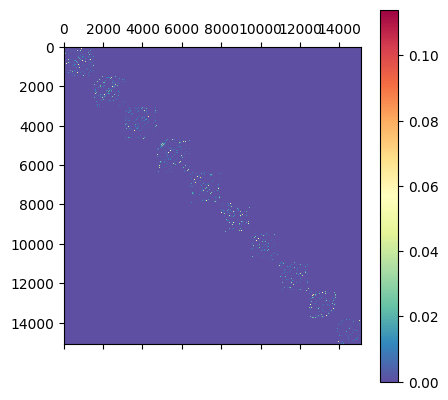

In [92]:
#weight the two together
#function to weight by distance
#function to weight by sconn
p_mat = prob_dist(D, smat_w, lam_um=20.0, p0=0.1, beta=0.5,
                              s_scale="max", zero_diag=True)
from matplotlib.colors import LogNorm
plt.matshow(p_mat, cmap="Spectral_r")#,norm=LogNorm())
plt.colorbar()

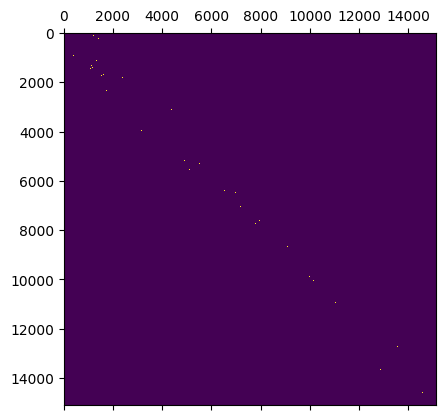

In [93]:
#Build avalanches framework
#===========================
#determine connectivity matrix
curr_nnb = p_mat
rng = np.random.default_rng(42)
cmat = (rng.random(curr_nnb.shape, dtype=np.float32) < curr_nnb)
plt.matshow(cmat)

In [94]:
curr_bind = np.load(bind_l[0])
av, pkg = avalanche(cmat, curr_bind)

Avalanches: 100%|█| 4913/4913 [01:34<00:00, 52.


In [ ]:
sizes, durations, pkg, events = avalanches_components(cmat, curr_bind, min_size=2)

In [95]:
av[0]

array([ 6,  6,  5, ..., 23,  4,  6], shape=(1441,))

In [96]:
np.max(av[0])

np.int64(483)

In [97]:
np.max(av[1])

np.int64(25)

In [98]:
sizes = av[0]
durations = av[1]

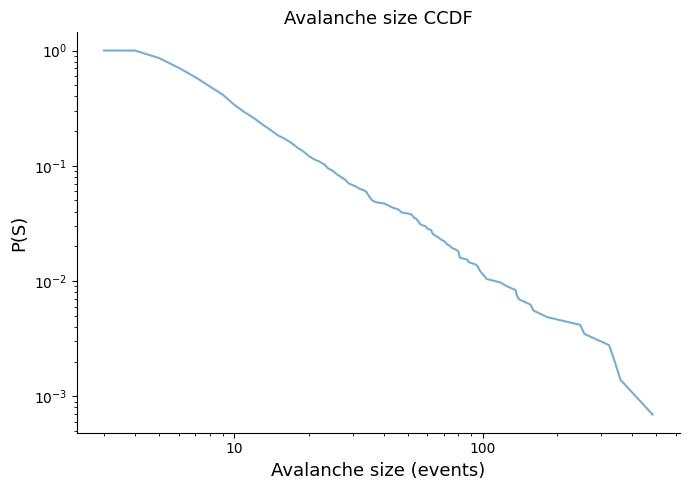

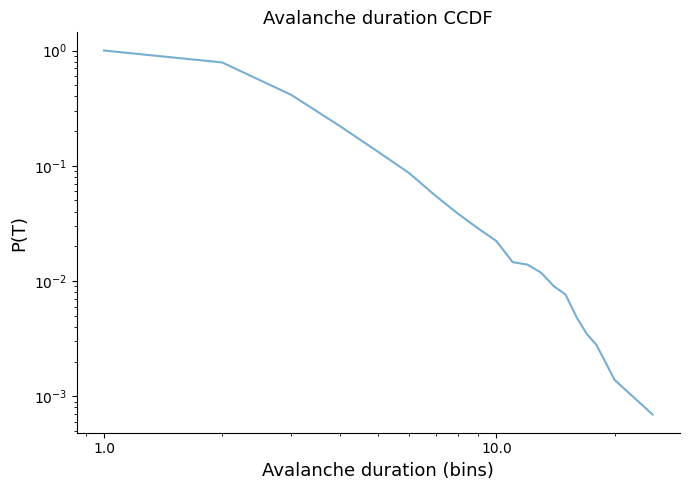

In [99]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import powerlaw

def _finite_pos(x):
    x = np.asarray(x)
    x = x[np.isfinite(x)]
    return x[x > 0]

def plot_powerlaw_ccdf(x, xlabel, ylabel, title=None, markersize=1, alpha=0.6):
    x = _finite_pos(x)
    fig, ax = plt.subplots(figsize=(7, 5))
    if x.size:
        powerlaw.plot_ccdf(x, ax=ax, markersize=markersize, alpha=alpha)
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    ax.set_xlabel(xlabel, size=13); ax.set_ylabel(ylabel, size=13)
    if title: ax.set_title(title, size=13)
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)
    plt.tight_layout(); plt.show()

# sizes and durations are 1D vectors
plot_powerlaw_ccdf(sizes,     "Avalanche size (events)",    "P(S)", title="Avalanche size CCDF")
plot_powerlaw_ccdf(durations, "Avalanche duration (bins)",  "P(T)", title="Avalanche duration CCDF")

In [42]:
%autoreload
#estimate avalanches
fdata = "/home/dburrows/DATA/BLNDEV-WILDTYPE/"
dff_l  = np.sort(glob.glob(f"{fdata}/*regdeltaff*"))
bind_l  = np.sort(glob.glob(f"{fdata}/*regbin*"))
coord_l  = np.sort(glob.glob(f"{fdata}/*labcoord_new*"))
nnb_l  = np.sort(glob.glob(f"{fdata}/*nnb*"))

len(dff_l), len(bind_l), len(coord_l), len(nnb_l)

UsageError: Line magic function `%autoreload` not found.


In [9]:
import os
import numpy as np
from tqdm import tqdm
from joblib import Parallel, delayed

reg_list = ["all"]
rng = np.random.default_rng(42)

# ---- worker ----
def process_one_fish(i, dff_l, bind_l, coord_l, reg_list,
                     smat_coarse, lam_um=20, p0=0.1, beta=0.2, seed=0):
    # Load
    trace = np.load(dff_l[i])                 # (cells, T) or whatever you intend
    dff   = np.load(dff_l[i])
    bind  = np.load(bind_l[i])
    coord = np.load(coord_l[i], allow_pickle=True)

    name = adfn.save_name(dff_l[i])

    fish_res = {}
    for reg in reg_list:
        sub_trace, sub_dff, sub_bind, sub_coord = tfn.select_region(
            trace, dff, bind, coord, reg
        )

        # If nnb uses randomness internally, pass a deterministic seed per fish/region
        # (optional; remove if nnb is deterministic)
        # rng = np.random.default_rng(seed)

        sub_nnb = nnb(curr=sub_coord, smat_coarse=smat_coarse,
                      lam_um=lam_um, p0=p0, beta=beta)

        cmat = (rng.random(sub_nnb.shape, dtype=np.float32) < sub_nnb)
        av, pkg = avalanche(cmat, sub_bind)
        fish_res[reg] = {"av": av, "pkg": pkg}

    return name, fish_res


# ---- run in parallel + assemble + save once ----
n_jobs = 10

out = Parallel(n_jobs=n_jobs, backend="loky", verbose=10)(
    delayed(process_one_fish)(
        i, dff_l, bind_l, coord_l, reg_list,
        smat_coarse, 30, 0.1, 0.5, 42 + i
    )
    for i in range(len(dff_l))
)

results = dict(out)
np.save("all_avalanches.npy", results, allow_pickle=True)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
Avalanches: 100%|██████

In [10]:
import os
import numpy as np
from tqdm import tqdm
from joblib import Parallel, delayed

reg_list = ['Diencephalon', 'Hindbrain', 'Midbrain', 'Telencephalon']
rng = np.random.default_rng(42)

# ---- worker ----
def process_one_fish(i, dff_l, bind_l, coord_l, reg_list,
                     smat_coarse, lam_um=20, p0=0.1, beta=0.2, seed=0):
    # Load
    trace = np.load(dff_l[i])                 # (cells, T) or whatever you intend
    dff   = np.load(dff_l[i])
    bind  = np.load(bind_l[i])
    coord = np.load(coord_l[i], allow_pickle=True)

    name = adfn.save_name(dff_l[i])

    fish_res = {}
    for reg in reg_list:
        locs = np.where(coord[:,4] == reg)

        sub_coord = coord[locs]
        sub_trace, sub_dff, sub_bind = trace[locs], dff[locs], bind[locs]

        sub_nnb = nnb(curr=sub_coord, smat_coarse=smat_coarse,
                      lam_um=lam_um, p0=p0, beta=beta)

        cmat = (rng.random(sub_nnb.shape, dtype=np.float32) < sub_nnb)
        av, pkg = avalanche(cmat, sub_bind)
        fish_res[reg] = {"av": av, "pkg": pkg}

    return name, fish_res


# ---- run in parallel + assemble + save once ----
n_jobs = 10

out = Parallel(n_jobs=n_jobs, backend="loky", verbose=10)(
    delayed(process_one_fish)(
        i, dff_l, bind_l, coord_l, reg_list,
        smat_coarse, 30, 0.1, 0.5, 42 + i
    )
    for i in range(len(dff_l))
)

results = dict(out)
np.save(f"{fdata}/coarse_avalanches.npy", results, allow_pickle=True)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
Avalanches:   1%|▏         | 73/4913 [00:00<00:06, 720.41it/s]/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encountered in cast
Avalanches: 100%|██████████| 4913/4913 [00:05<00:00, 864.22it/s]
/tmp/ipykernel_219554/2949684129.py:23: RuntimeWarning: invalid value encoun

In [11]:
import os
import numpy as np
from tqdm import tqdm
from joblib import Parallel, delayed

reg_list = np.array(['Cerebellum', 'Habenula', 'Hindbrain (rhombomeres)', 'Hypothalamus', 'Locus coeruleus', 'Medulla',
       'Midbrain (other)', 'Olfactory bulb',
       'Optic tectum - SPV',
       'Pallium', 'Preoptic area', 'Pretectum', 'Raphe', 'Subpallium',
        'Thalamus'])
rng = np.random.default_rng(42)

# ---- worker ----
def process_one_fish(i, dff_l, bind_l, coord_l, reg_list,
                     smat_coarse, lam_um=20, p0=0.1, beta=0.2, seed=0):
    # Load
    trace = np.load(dff_l[i])                 # (cells, T) or whatever you intend
    dff   = np.load(dff_l[i])
    bind  = np.load(bind_l[i])
    coord = np.load(coord_l[i], allow_pickle=True)

    name = adfn.save_name(dff_l[i])

    fish_res = {}
    for reg in reg_list:
        locs = np.where(coord[:,5] == reg)

        sub_coord = coord[locs]
        if sub_coord.shape[0] < 20:
            continue
        sub_trace, sub_dff, sub_bind = trace[locs], dff[locs], bind[locs]

        sub_nnb = nnb(curr=sub_coord, smat_coarse=smat_coarse,
                      lam_um=lam_um, p0=p0, beta=beta)

        cmat = (rng.random(sub_nnb.shape, dtype=np.float32) < sub_nnb)
        av, pkg = avalanche(cmat, sub_bind)
        if len(av) == 0:
            fish_res[reg] = {"av": [], "pkg": []}
        else:
            fish_res[reg] = {"av": av, "pkg": pkg}

    return name, fish_res


# ---- run in parallel + assemble + save once ----
n_jobs = 10

out = Parallel(n_jobs=n_jobs, backend="loky", verbose=10)(
    delayed(process_one_fish)(
        i, dff_l, bind_l, coord_l, reg_list,
        smat_coarse, 30, 0.1, 0.5, 42 + i
    )
    for i in range(len(dff_l))
)

results = dict(out)
np.save(f"{fdata}/gran_avalanches.npy", results, allow_pickle=True)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
Avalanches: 100%|██████████| 4913/4913 [00:01<00:00, 4109.35it/s]
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:  2.2min finished


In [649]:
(coord[:,5] == 'Habenula').sum()

np.int64(323)

In [555]:
def group_age(results, reg="all"):
    """
    returns: age_to_fish[age] = list of (name, av, T)
      - av: (2, M) where av[0]=sizes, av[1]=durations
      - T: number of frames (from pkg.shape[1])
    """
    age_to_fish = defaultdict(list)
    for name, fish_res in results.items():
        age = parse_age_dpf(name)
        if age is None:
            continue
        if reg not in fish_res:
            continue
        av = fish_res[reg].get("av", None)
        pkg = fish_res[reg].get("pkg", None)
        if av is None or np.asarray(av).size == 0 or pkg is None:
            continue
        T = int(pkg.shape[1])
        age_to_fish[age].append((name, np.asarray(av), T))
    return age_to_fish

def set_bins(av = None, bins = 100):
    maxi=np.max(np.concat(av))
    mini=np.min(np.concat(av))
    return(np.geomspace(mini, maxi, bins))

def ccdf(av,b):
    av = np.sort(av)
    n = av.size
    ccdf=(n - np.searchsorted(av, b, side="left")) / n
    return(ccdf)


def ccdf_mean(av_vec):
    mean = np.mean(av_vec,axis=0)
    sem = np.std(av_vec, axis=0) / np.sqrt(av_vec.shape[0])
    return(mean,sem)

In [822]:
def pl_stats(x, xmin=6, xmax=1e4, discrete=True,
                               compare_to="lognormal", min_av = 10):
    x = np.asarray(x).ravel()
    x = x[np.isfinite(x) & (x > 0)]
    if discrete:
        x = x.astype(int)

    # hard bounds in the *data*
    x = x[x >= xmin]
    if xmax is not None:
        x = x[x <= xmax]

    if x.size < min_av:
        return np.nan, np.nan, np.nan, np.nan

    # fit (xmax here is the hard upper cutoff for fitting)
    fit = powerlaw.Fit(x, discrete=discrete, xmin=xmin, xmax=xmax, verbose=False)
    alpha = float(fit.power_law.alpha)
    ks_D = float(fit.power_law.KS())

    # log-likelihood ratio test (R) + p-value vs another distribution
    # (positive R -> first arg "power_law" favored; negative -> compare_to favored)
    R, p = fit.distribution_compare("power_law", compare_to)
    return alpha, ks_D, float(R), float(p)

def dcc(av_size, av_dur,
                   xmin_size=6, xmax_size=1e4,
                   xmin_dur=1,  xmax_dur=20,
                   discrete=True,
                   dur_scale=2.73,
                   min_av=10):
    S = np.asarray(av_size).ravel().astype(float)
    T = np.asarray(av_dur).ravel().astype(float)
    m = np.isfinite(S) & np.isfinite(T) & (S > 0) & (T > 0)
    S, T = S[m], T[m]

    # match your duration scaling
    T = T / dur_scale

    # --- exponents using the same hard bounds style as pl_stats() ---
    size_exp, _, _, _ = pl_stats(S, xmin=xmin_size, xmax=xmax_size,
                                discrete=discrete, min_av=min_av)
    dur_exp,  _, _, _ = pl_stats(T, xmin=xmin_dur,  xmax=xmax_dur,
                                discrete=discrete, min_av=min_av)

    if not (np.isfinite(size_exp) and np.isfinite(dur_exp)) or (size_exp == 1.0):
        return np.nan, np.nan

    # --- scaling fit on the SAME bounded data window ---
    keep = (S >= xmin_size) & (S <= xmax_size) & (T >= xmin_dur) & (T <= xmax_dur)
    S, T = S[keep], T[keep]
    if S.size < min_av:
        return np.nan, np.nan

    # mean size per unique duration
    Tu = np.unique(T)
    size_vec = np.array([np.mean(S[T == t]) for t in Tu], float)
    xaxis = Tu.astype(float)
    yaxis = size_vec.astype(float)

    # # match your "drop last point" behavior
    # if xaxis.size < (min_av/2):
    #     return np.nan, np.nan
    xfit = xaxis[:-1]
    yfit = yaxis[:-1]

    ok = (xfit > 0) & (yfit > 0) & np.isfinite(xfit) & np.isfinite(yfit)
    xfit, yfit = xfit[ok], yfit[ok]
    # if xfit.size < (min_av/2):
    #     return np.nan, np.nan

    fit_beta, _ = np.polyfit(np.log10(xfit), np.log10(yfit), 1)

    pred_beta = (dur_exp - 1.0) / (size_exp - 1.0)
    dcc = float(np.abs(fit_beta - pred_beta))
    return dcc, float(fit_beta)

def br(curr, max_steps=200):
    sumd = curr.sum(axis=0)

    steps = (1, max_steps)                   # lag range in *bins*
    rk = mre.coefficients(
        sumd,                             # 1D is treated as a single trial :contentReference[oaicite:3]{index=3}
        method="trialseparated",       # or "ts" :contentReference[oaicite:4]{index=4}
        steps=steps,
        dt=1,
        dtunit="bins",
        desc="fish_i_pop"
    )
    
    fit = mre.fit(
        rk,
        fitfunc=mre.f_exponential_offset  # exp + offset :contentReference[oaicite:5]{index=5}
    )
    return(fit.tau, fit.mre)

import numpy as np
from scipy.optimize import curve_fit

def corr_length(coords, X, n_bins=30, max_pairs=200_000, seed=0):
    coords = np.asarray(coords, float)   # (N,3)
    X = np.asarray(X, float)            # (N,T)
    N, T = X.shape
    assert coords.shape[0] == N and coords.shape[1] == 3

    # z-score each unit
    X = X - X.mean(axis=1, keepdims=True)
    X = X / (X.std(axis=1, keepdims=True) + 1e-12)

    # sample pairs
    iu = np.triu_indices(N, 1)
    P = iu[0].size
    rng = np.random.default_rng(seed)
    take = min(max_pairs, P)
    idx = rng.choice(P, size=take, replace=False)
    i, j = iu[0][idx], iu[1][idx]

    # distances from coords
    d = np.linalg.norm(coords[i] - coords[j], axis=1)

    # absolute correlation per pair
    c = np.abs(np.mean(X[i] * X[j], axis=1))

    # bin mean |corr| vs distance
    edges = np.linspace(d.min(), d.max(), n_bins + 1)
    b = np.digitize(d, edges) - 1
    centers = 0.5 * (edges[:-1] + edges[1:])

    mean_c = np.array([c[b == k].mean() if np.any(b == k) else np.nan for k in range(n_bins)])
    m = np.isfinite(mean_c)

    # fit A * exp(-d/xi)
    def f(x, A, xi):
        return A * np.exp(-x / xi)

    popt, _ = curve_fit(f, centers[m], mean_c[m],
                        p0=(mean_c[m][0], np.median(centers[m])))
    A, xi = popt
    return xi, A, centers, mean_c

In [821]:
xi

np.float64(3492.470934542955)

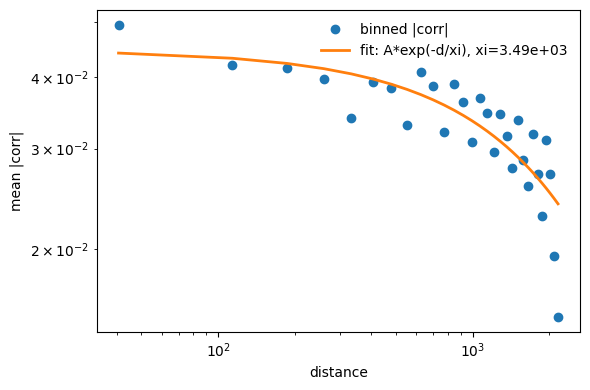

In [819]:
xi, A, centers, mean_c = corr_length(xyz, trace)

m = np.isfinite(mean_c)
xfit = centers[m]
yfit = mean_c[m]
yhat = A * np.exp(-xfit / xi)

plt.figure(figsize=(6,4))
plt.plot(centers, mean_c, marker="o", linestyle="none", label="binned |corr|")
plt.plot(xfit, yhat, linewidth=2, label=f"fit: A*exp(-d/xi), xi={xi:.3g}")
plt.xscale("log"); plt.yscale("log")
plt.xlabel("distance")
plt.ylabel("mean |corr|")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()

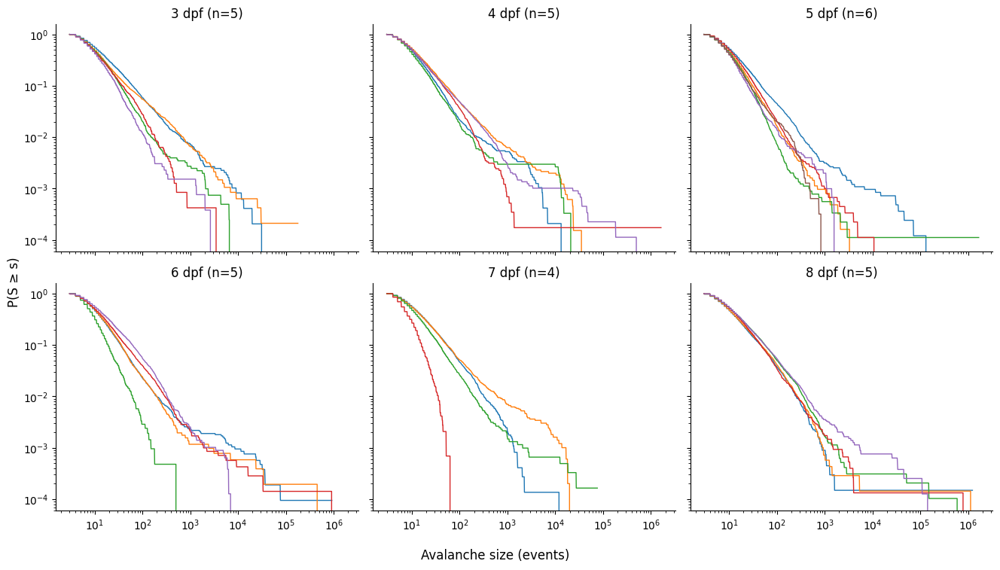

In [224]:
import numpy as np
import matplotlib.pyplot as plt

# av_dic: {age: [(name, av), (name, av), ...]}
# where av is (2, n) and av[0] is size, av[1] is duration
av_dic = group_age(results, reg="all")

ages = sorted(av_dic.keys())

# layout
ncols = 3
nrows = int(np.ceil(len(ages) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.5*ncols, 3.8*nrows), sharex=True, sharey=True)
axes = np.array(axes).ravel()

for ax, age in zip(axes, ages):
    # size vectors for all animals at this age
    avs_toplot = [rec[1][0] for rec in av_dic[age]]   # rec = (name, av)

    # bins per-age (so curves align within that subplot)
    b = set_bins(av=avs_toplot, bins=1000)

    for i in avs_toplot:
        ax.plot(b, ccdf(i), alpha=1, linewidth=1)

    ax.set_title(f"{age} dpf (n={len(avs_toplot)})")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# turn off any unused axes
for j in range(len(ages), len(axes)):
    axes[j].axis("off")

fig.supxlabel("Avalanche size (events)")
fig.supylabel("P(S ≥ s)")
plt.tight_layout()
plt.show()

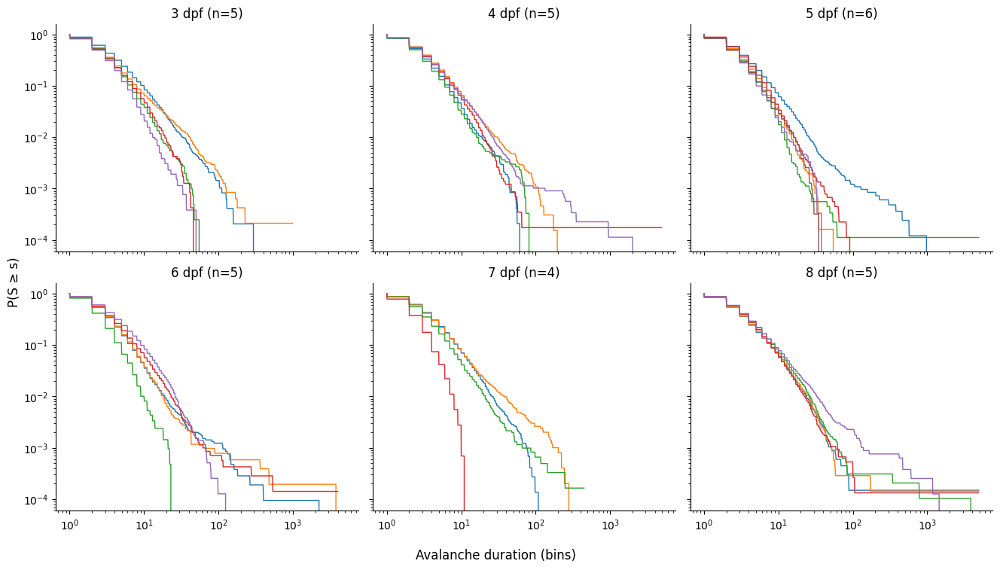

In [270]:
import numpy as np
import matplotlib.pyplot as plt

# av_dic: {age: [(name, av), (name, av), ...]}
# where av is (2, n) and av[0] is size, av[1] is duration
av_dic = group_age(results, reg="all")

ages = sorted(av_dic.keys())

# layout
ncols = 3
nrows = int(np.ceil(len(ages) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.5*ncols, 3.8*nrows), sharex=True, sharey=True)
axes = np.array(axes).ravel()

for ax, age in zip(axes, ages):
    # size vectors for all animals at this age
    avs_toplot = [rec[1][1] for rec in av_dic[age]]   # rec = (name, av)

    # bins per-age (so curves align within that subplot)
    b = set_bins(av=avs_toplot, bins=1000)

    for i in avs_toplot:
        ax.plot(b, ccdf(i,b), alpha=1, linewidth=1)

    ax.set_title(f"{age} dpf (n={len(avs_toplot)})")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# turn off any unused axes
for j in range(len(ages), len(axes)):
    axes[j].axis("off")

fig.supxlabel("Avalanche duration (bins)")
fig.supylabel("P(S ≥ s)")
plt.tight_layout()
plt.show()

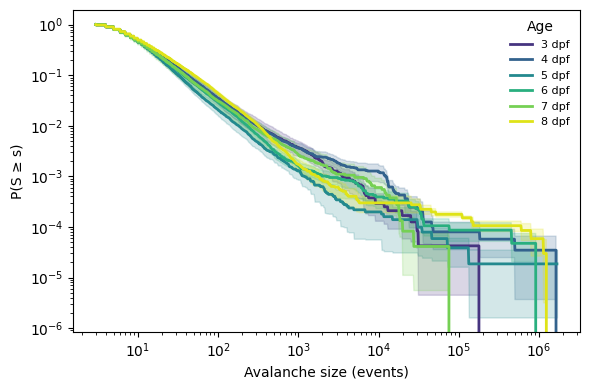

In [361]:
import numpy as np
import matplotlib.pyplot as plt

av_dic = group_age(results, reg="all")
ages = [a for a in sorted(av_dic.keys()) if len(av_dic[a]) > 0]  # drop empty ages

avs_toplot = [av[0] for age, recs in av_dic.items() for (_, av, _) in recs]
b = set_bins(av=avs_toplot, bins=1000)

cmap = plt.get_cmap("viridis")  # nice sequential gradient
colors = cmap(np.linspace(0.15, 0.95, len(ages)))  # avoid extremes if you like

plt.figure(figsize=(6,4))

for age, col in zip(ages, colors):
    Y = np.vstack([ccdf(av[0], b) for (_, av, _) in av_dic[age]])
    mean, sem = ccdf_mean(Y)

    plt.plot(b, mean, linewidth=2, color=col, label=f"{age} dpf")
    plt.fill_between(b, mean - sem, mean + sem, alpha=0.2, color=col)

plt.xscale("log"); plt.yscale("log")
plt.xlabel("Avalanche size (events)")
plt.ylabel("P(S ≥ s)")
plt.legend(frameon=False, fontsize=8, title="Age")
plt.tight_layout()
plt.show()


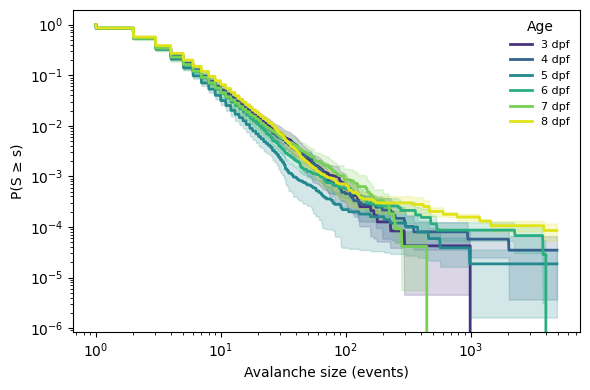

In [362]:
import numpy as np
import matplotlib.pyplot as plt

av_dic = group_age(results, reg="all")
ages = [a for a in sorted(av_dic.keys()) if len(av_dic[a]) > 0]  # drop empty ages

avs_toplot = [av[1] for age, recs in av_dic.items() for (_, av, _) in recs]
b = set_bins(av=avs_toplot, bins=1000)

cmap = plt.get_cmap("viridis")  # nice sequential gradient
colors = cmap(np.linspace(0.15, 0.95, len(ages)))  # avoid extremes if you like

plt.figure(figsize=(6,4))

for age, col in zip(ages, colors):
    Y = np.vstack([ccdf(av[1], b) for (_, av, _) in av_dic[age]])
    mean, sem = ccdf_mean(Y)

    plt.plot(b, mean, linewidth=2, color=col, label=f"{age} dpf")
    plt.fill_between(b, mean - sem, mean + sem, alpha=0.2, color=col)

plt.xscale("log"); plt.yscale("log")
plt.xlabel("Avalanche size (events)")
plt.ylabel("P(S ≥ s)")
plt.legend(frameon=False, fontsize=8, title="Age")
plt.tight_layout()
plt.show()


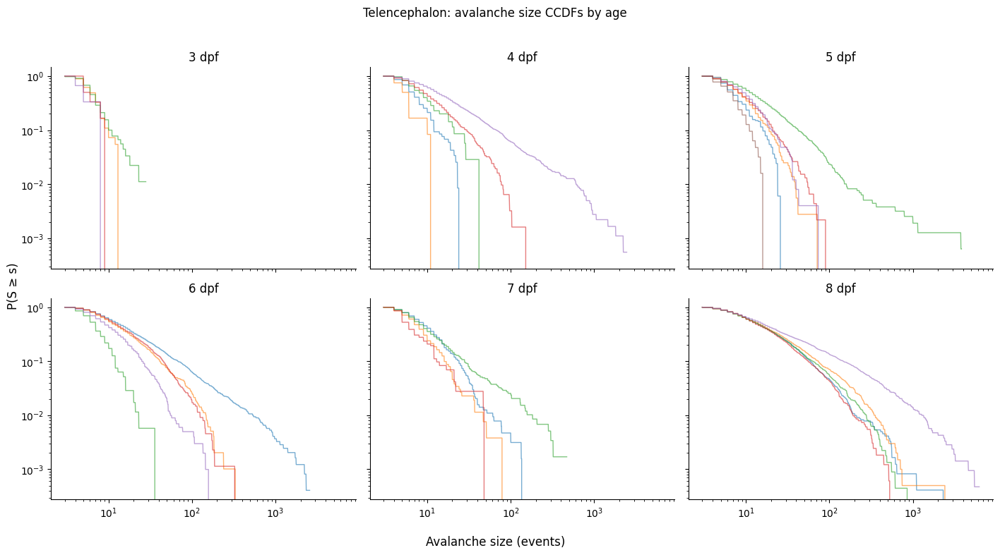

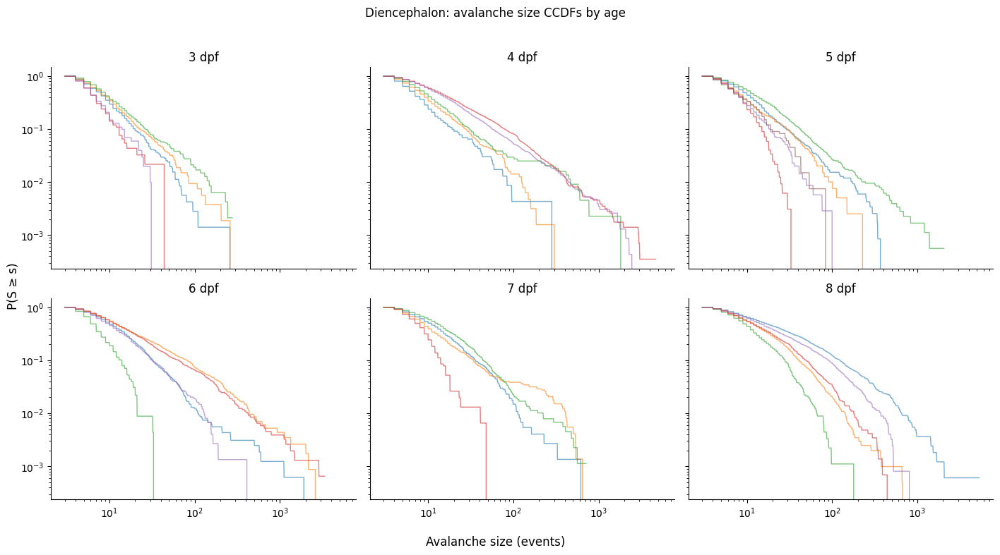

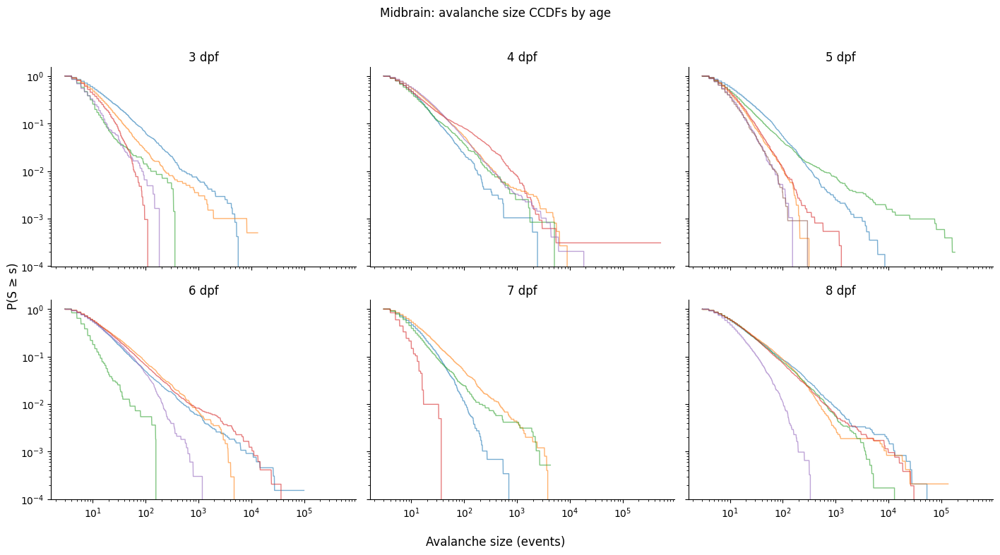

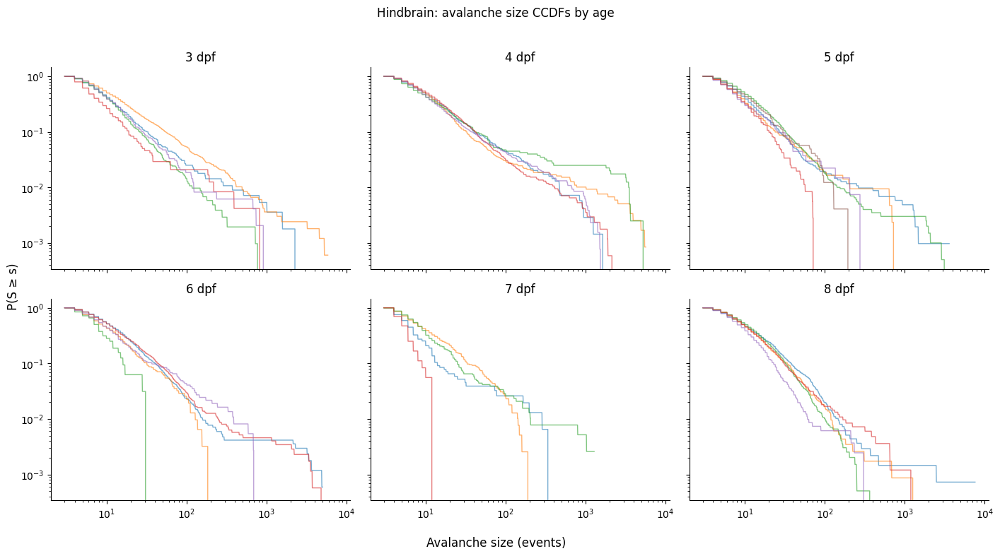

In [561]:
#plot by coarse region - size
#=====================
#plot each age

av_dic = np.load(f"{fdata}/coarse_avalanches.npy",allow_pickle=True).item()
regs = ['Telencephalon', 'Diencephalon', 'Midbrain', 'Hindbrain']
name_keys = np.asarray(list(av_dic.keys()))

for reg in regs:
    
    ncols = 3
    nrows = int(np.ceil(len(ages) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True, sharey=True)
    axes = np.array(axes).ravel()
    
    for ax, age in zip(axes, ages):
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        avs_toplot = [av_dic[age_name][reg]['av'][0] for age_name in name_keys[age_bools]]
        b = set_bins(avs_toplot, bins=1000)
    
        for age_name in name_keys[age_bools]:
            av = av_dic[age_name][reg]['av'][0]
            av = ccdf(av,b)
            ax.plot(b, av, alpha=0.6, linewidth=1)
    
        ax.set_title(f"{age} dpf")
        ax.set_xscale("log"); ax.set_yscale("log")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    
    # turn off unused axes
    for j in range(len(ages), len(axes)):
        axes[j].axis("off")
    
    fig.suptitle(f"{reg}: avalanche size CCDFs by age", y=1.02)
    fig.supxlabel("Avalanche size (events)")
    fig.supylabel("P(S ≥ s)")
    plt.tight_layout()
    plt.show()

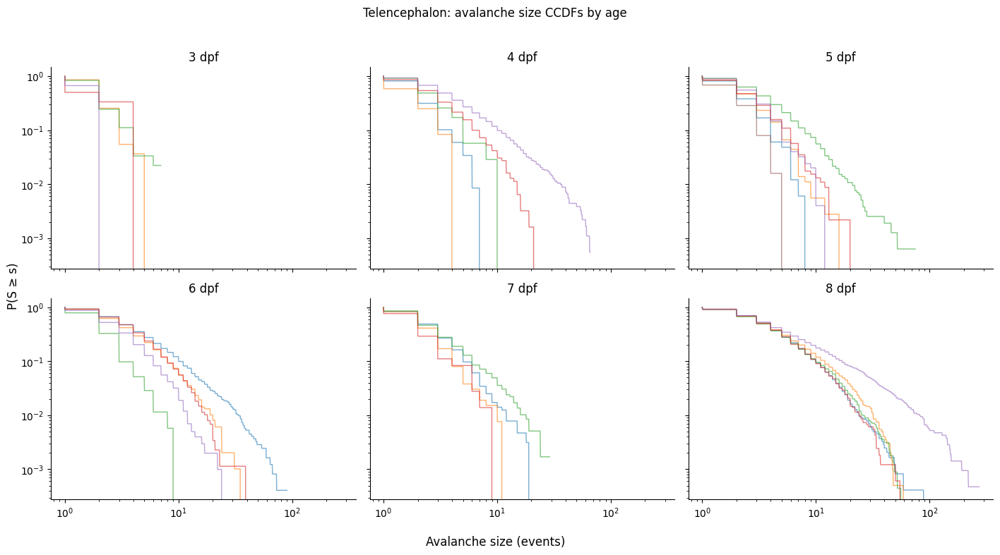

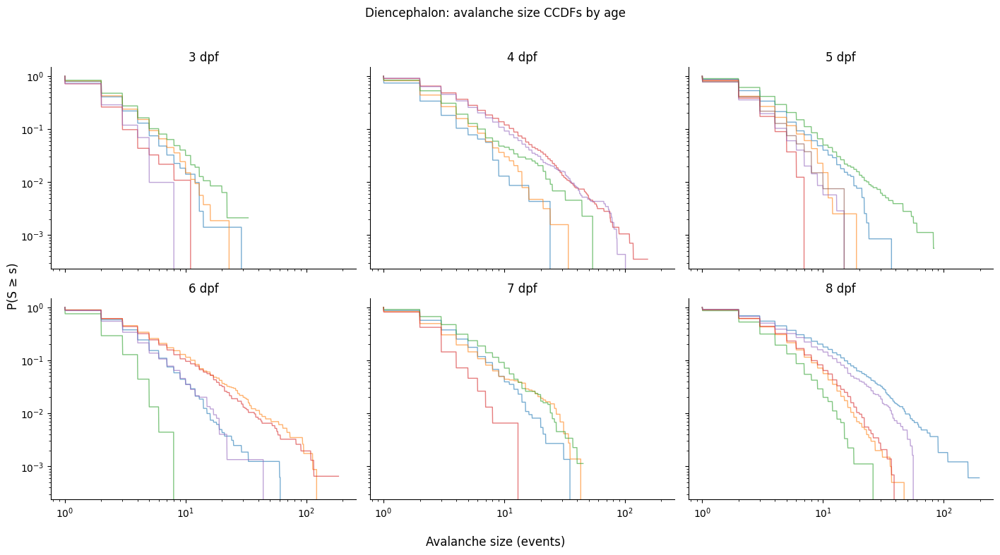

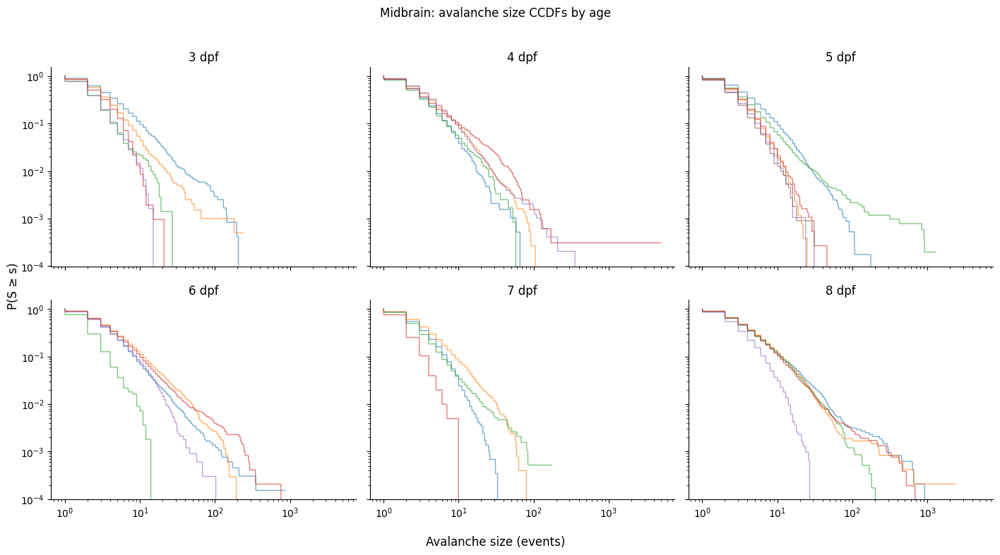

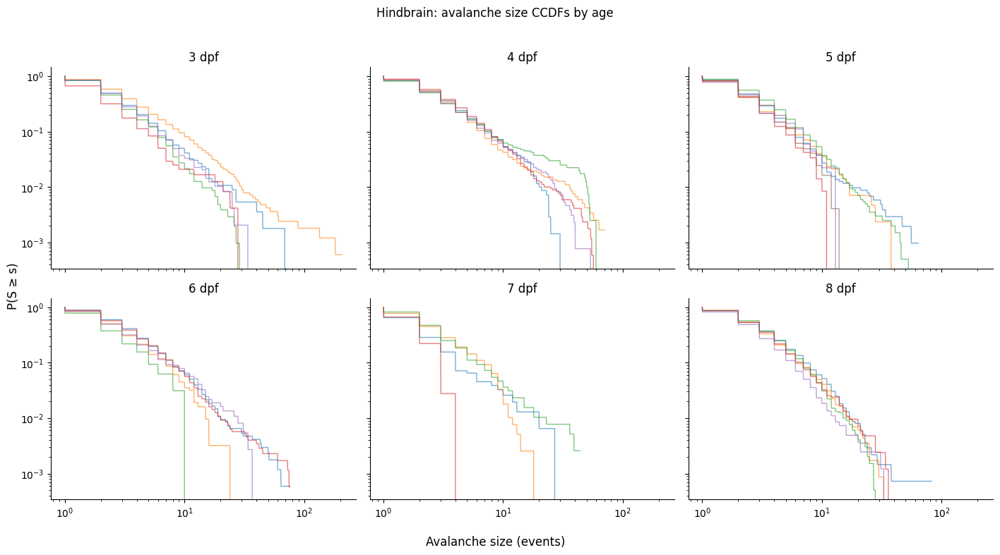

In [562]:
#plot by coarse region - duration
#=====================
#plot each age

#av_dic = np.load(f"{fdata}/coarse_avalanches.npy",allow_pickle=True).item()
regs = ['Telencephalon', 'Diencephalon', 'Midbrain', 'Hindbrain']
name_keys = np.asarray(list(av_dic.keys()))

for reg in regs:
    
    ncols = 3
    nrows = int(np.ceil(len(ages) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True, sharey=True)
    axes = np.array(axes).ravel()
    
    for ax, age in zip(axes, ages):
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        avs_toplot = [av_dic[age_name][reg]['av'][1] for age_name in name_keys[age_bools]]
        b = set_bins(avs_toplot, bins=1000)
    
        for age_name in name_keys[age_bools]:
            av = av_dic[age_name][reg]['av'][1]
            av = ccdf(av,b)
            ax.plot(b, av, alpha=0.6, linewidth=1)
    
        ax.set_title(f"{age} dpf")
        ax.set_xscale("log"); ax.set_yscale("log")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    
    # turn off unused axes
    for j in range(len(ages), len(axes)):
        axes[j].axis("off")
    
    fig.suptitle(f"{reg}: avalanche size CCDFs by age", y=1.02)
    fig.supxlabel("Avalanche size (events)")
    fig.supylabel("P(S ≥ s)")
    plt.tight_layout()
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

av_dic = group_age(results, reg="all")
ages = [a for a in sorted(av_dic.keys()) if len(av_dic[a]) > 0]  # drop empty ages

avs_toplot = [av[1] for age, recs in av_dic.items() for (_, av, _) in recs]
b = set_bins(av=avs_toplot, bins=1000)

cmap = plt.get_cmap("viridis")  # nice sequential gradient
colors = cmap(np.linspace(0.15, 0.95, len(ages)))  # avoid extremes if you like

plt.figure(figsize=(6,4))

for age, col in zip(ages, colors):
    Y = np.vstack([ccdf(av[1], b) for (_, av, _) in av_dic[age]])
    mean, sem = ccdf_mean(Y)

    plt.plot(b, mean, linewidth=2, color=col, label=f"{age} dpf")
    plt.fill_between(b, mean - sem, mean + sem, alpha=0.2, color=col)

plt.xscale("log"); plt.yscale("log")
plt.xlabel("Avalanche size (events)")
plt.ylabel("P(S ≥ s)")
plt.legend(frameon=False, fontsize=8, title="Age")
plt.tight_layout()
plt.show()


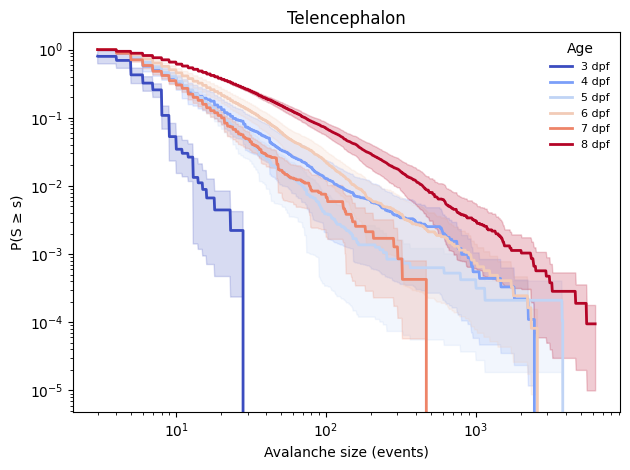

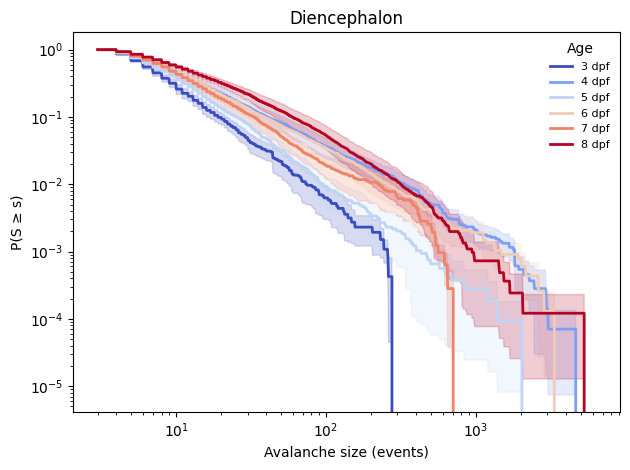

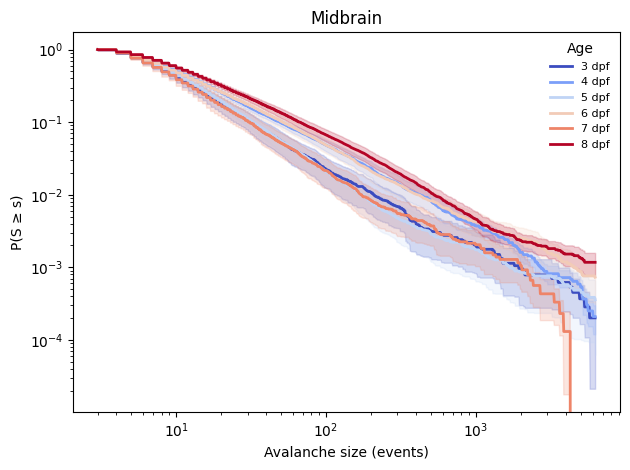

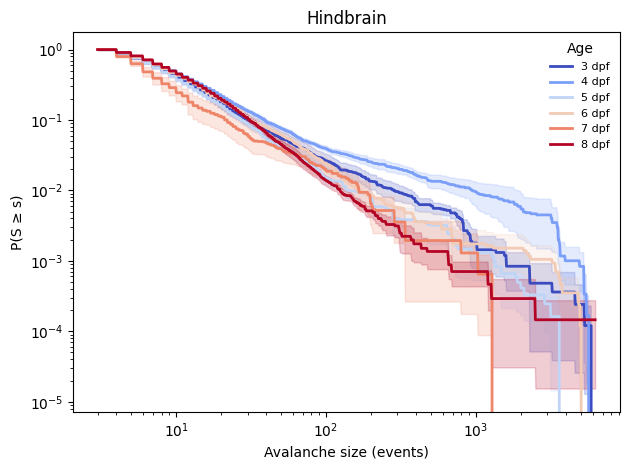

In [465]:
#plot by coarse region
#=====================
#plot mean age

#av_dic = np.load(f"{fdata}/coarse_avalanches.npy",allow_pickle=True).item()
regs = ['Telencephalon', 'Diencephalon', 'Midbrain', 'Hindbrain']
name_keys = np.asarray(list(av_dic.keys()))
b  = set_bins([av_dic[age_name][reg]['av'][0] for age_name in name_keys], bins=1000)
cmap = plt.get_cmap("coolwarm")  # sequential
norm = plt.Normalize(vmin=min(ages), vmax=max(ages))
age_to_col = {age: cmap(norm(age)) for age in ages}

for reg in regs:
    for age in ages:
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        ccdfs = np.vstack(([ccdf(av_dic[age_name][reg]['av'][0],b) for age_name in name_keys[age_bools]]))
        mean,sem = ccdf_mean(ccdfs)
        col = age_to_col[age]
        plt.plot(b, mean, linewidth=2, label=f"{age} dpf", color=col)
        plt.fill_between(b, mean - sem, mean + sem, alpha=0.2, color=col)
            
    
    plt.xscale("log"); plt.yscale("log")
    plt.xlabel("Avalanche size (events)")
    plt.ylabel("P(S ≥ s)")
    plt.title(reg)
    plt.legend(frameon=False, fontsize=8, title="Age")
    plt.tight_layout()
    plt.show()

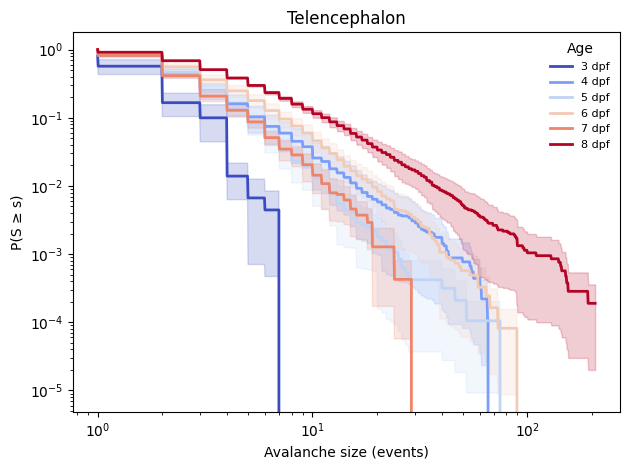

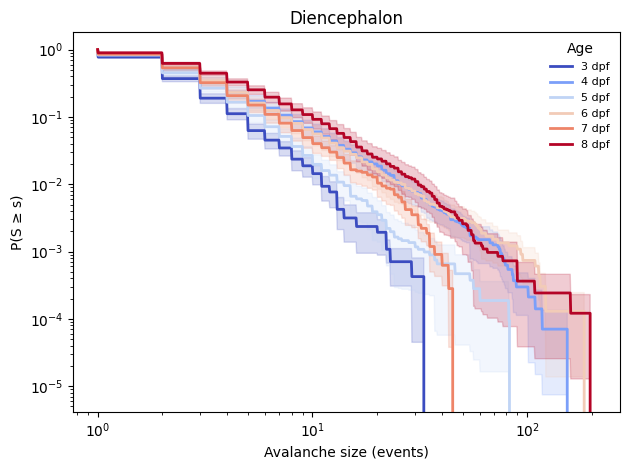

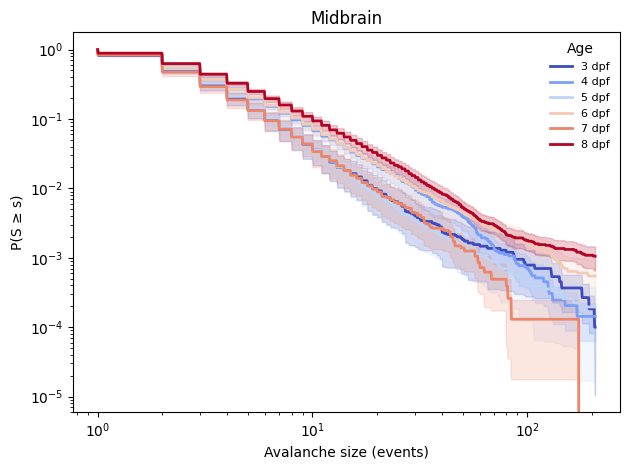

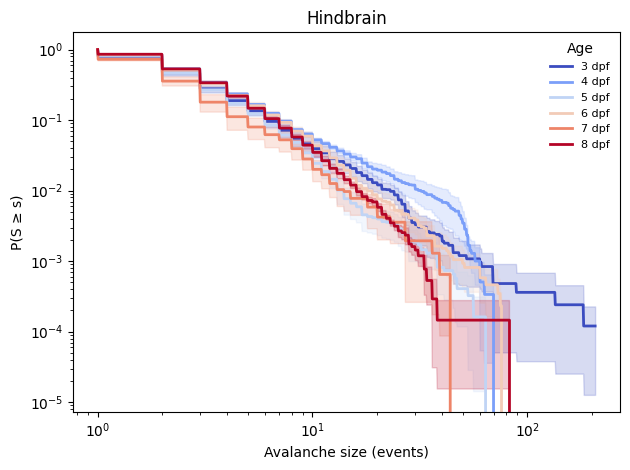

In [466]:
#plot by coarse region
#=====================
#plot mean age

#av_dic = np.load(f"{fdata}/coarse_avalanches.npy",allow_pickle=True).item()
regs = ['Telencephalon', 'Diencephalon', 'Midbrain', 'Hindbrain']
name_keys = np.asarray(list(av_dic.keys()))
b  = set_bins([av_dic[age_name][reg]['av'][1] for age_name in name_keys], bins=1000)
cmap = plt.get_cmap("coolwarm")  # sequential
norm = plt.Normalize(vmin=min(ages), vmax=max(ages))
age_to_col = {age: cmap(norm(age)) for age in ages}

for reg in regs:
    for age in ages:
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        ccdfs = np.vstack(([ccdf(av_dic[age_name][reg]['av'][1],b) for age_name in name_keys[age_bools]]))
        mean,sem = ccdf_mean(ccdfs)
        col = age_to_col[age]
        plt.plot(b, mean, linewidth=2, label=f"{age} dpf", color=col)
        plt.fill_between(b, mean - sem, mean + sem, alpha=0.2, color=col)
            
    
    plt.xscale("log"); plt.yscale("log")
    plt.xlabel("Avalanche size (events)")
    plt.ylabel("P(S ≥ s)")
    plt.title(reg)
    plt.legend(frameon=False, fontsize=8, title="Age")
    plt.tight_layout()
    plt.show()

In [709]:
#plot by gran region
av_dic = np.load(f'{fdata}/gran_avalanches.npy', allow_pickle=True).item()
regs = np.array(['Cerebellum', 'Habenula', 'Hindbrain (rhombomeres)', 'Hypothalamus', 'Locus coeruleus', 'Medulla',
       'Midbrain (other)', 'Olfactory bulb',
       'Optic tectum - SPV',
       'Pallium', 'Preoptic area', 'Pretectum', 'Raphe', 'Subpallium',
        'Thalamus'])
name_keys = np.asarray(list(av_dic.keys()))
name_keys

array(['/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-4dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-5dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-6dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-7dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-8dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-02_2photon_sess-01-3dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-02_2photon_sess-01-4dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-02_2photon_sess-01-5dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-02_2photon_sess-01-6dpf_BLNGR_run-01',
       '/home/dburrows/DATA/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-03_2photon_sess-01-4dpf_BLNGR_run-01',
       '/h

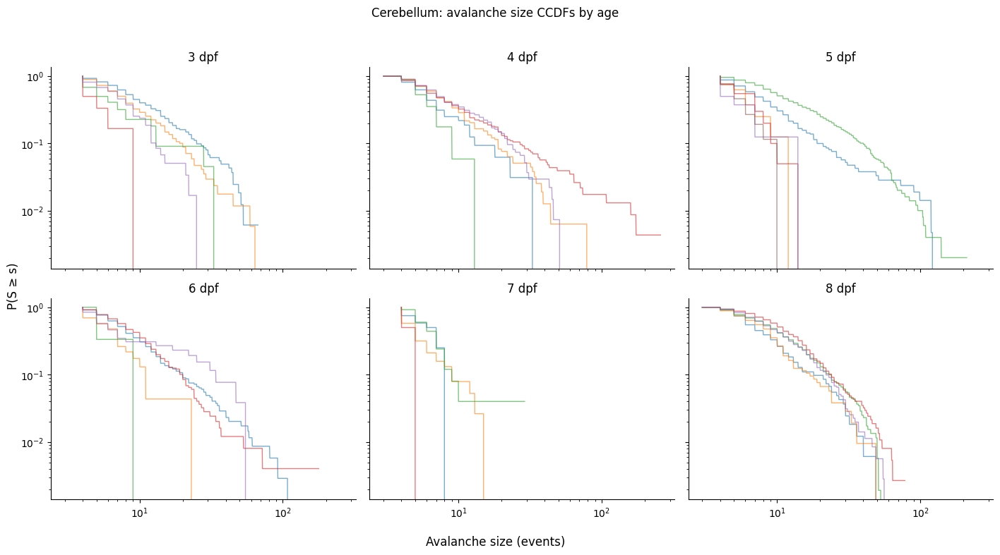

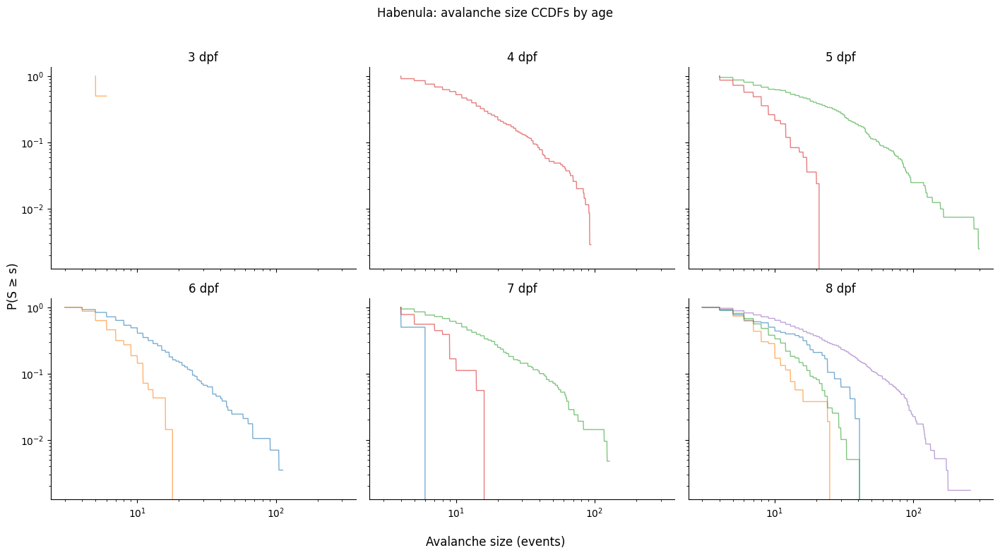

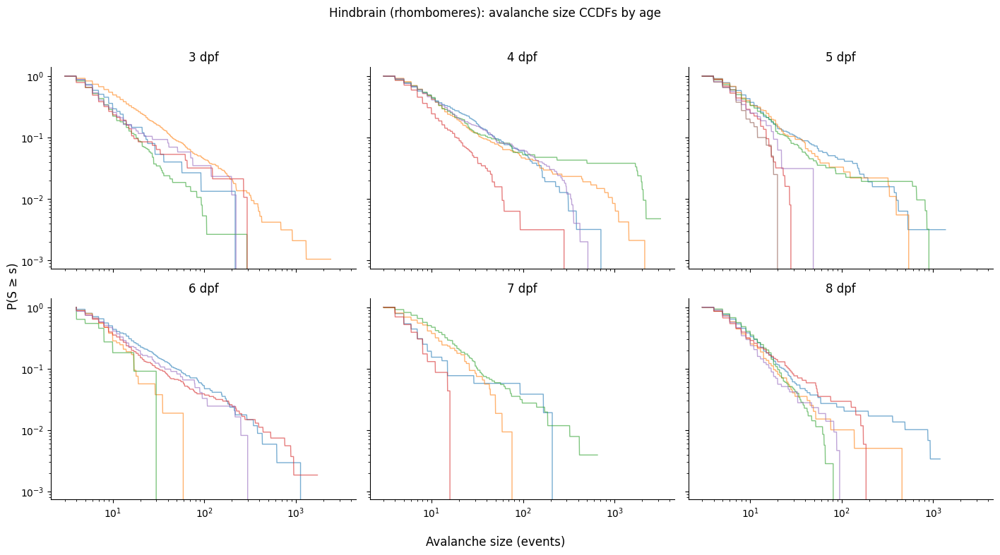

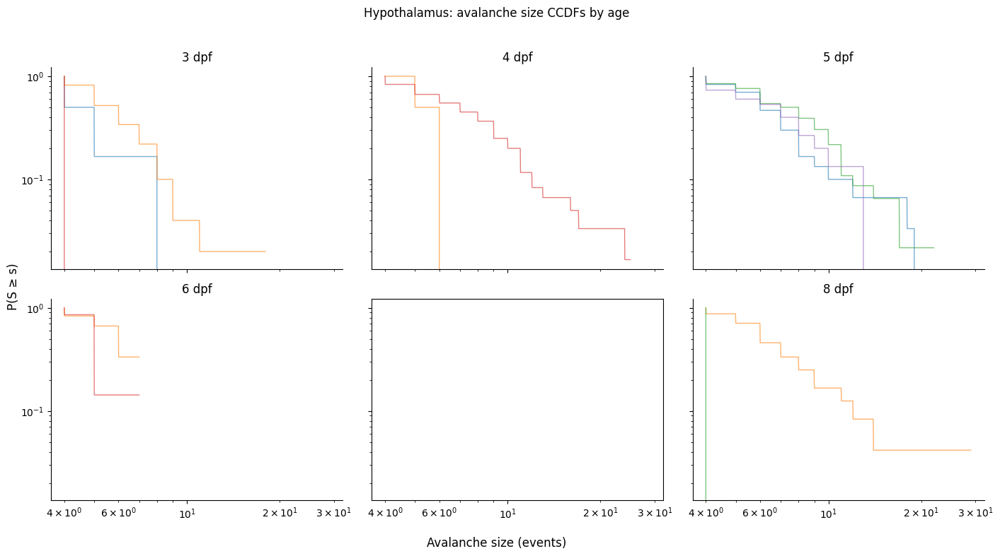

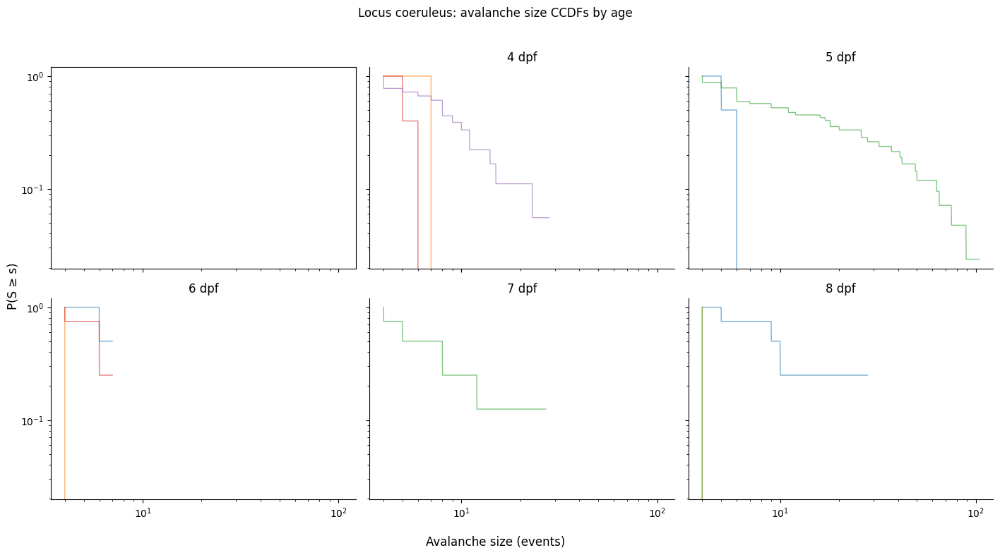

...

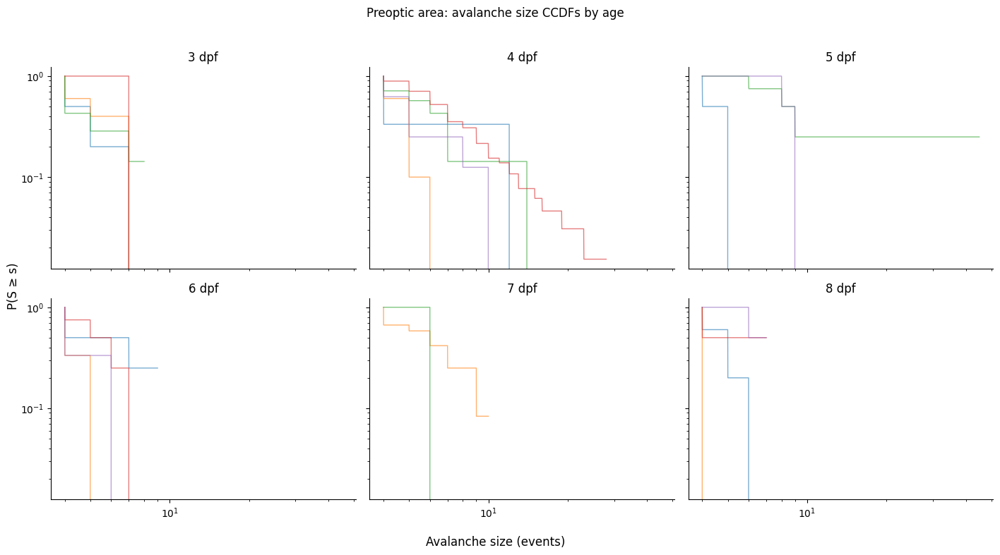

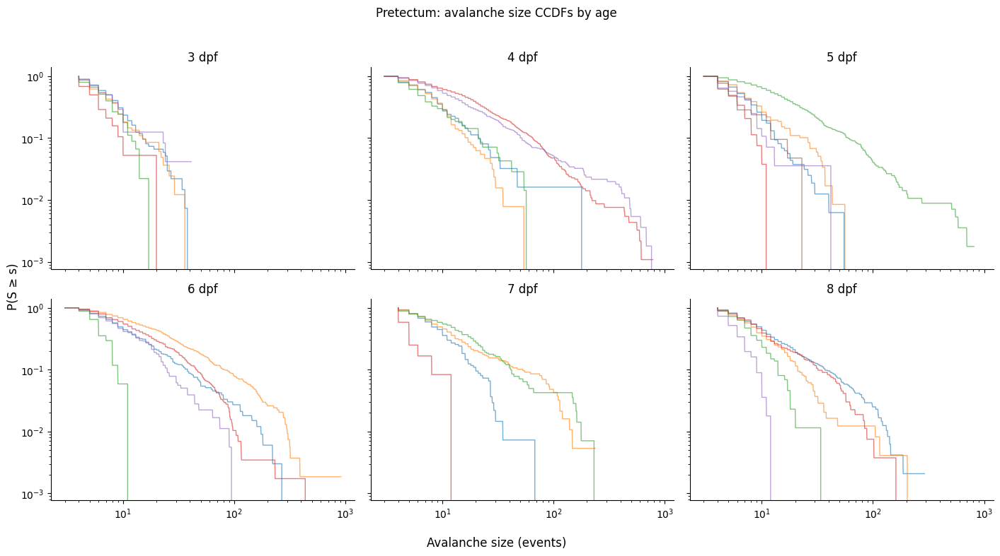

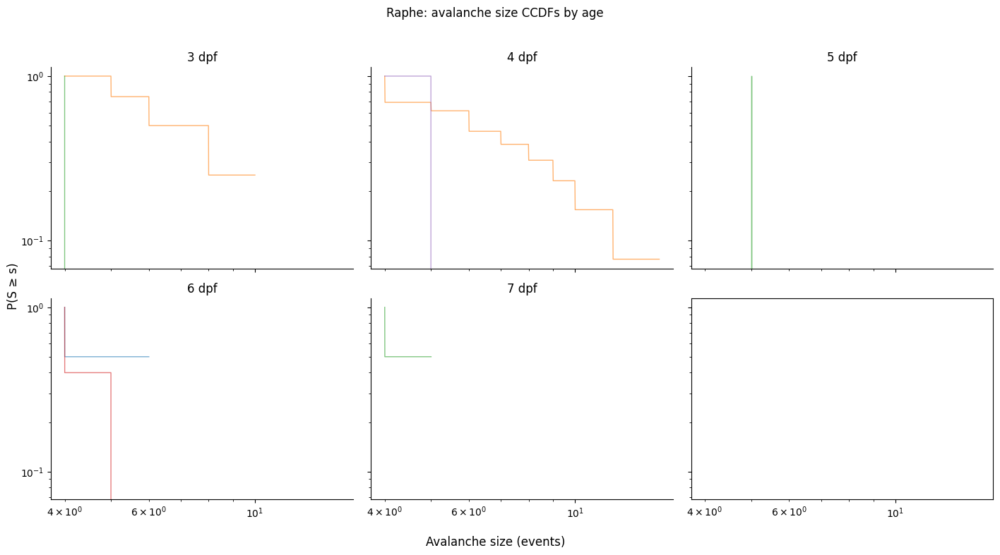

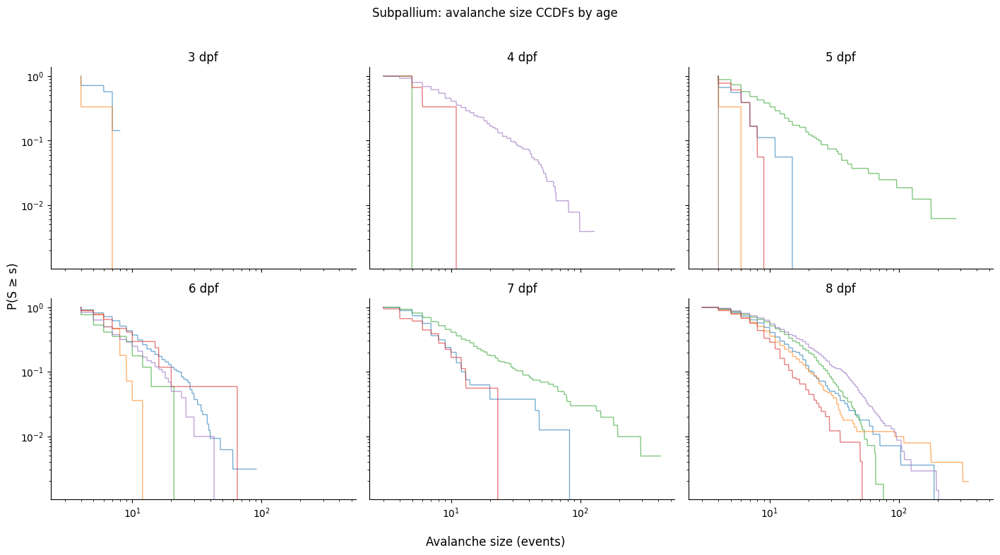

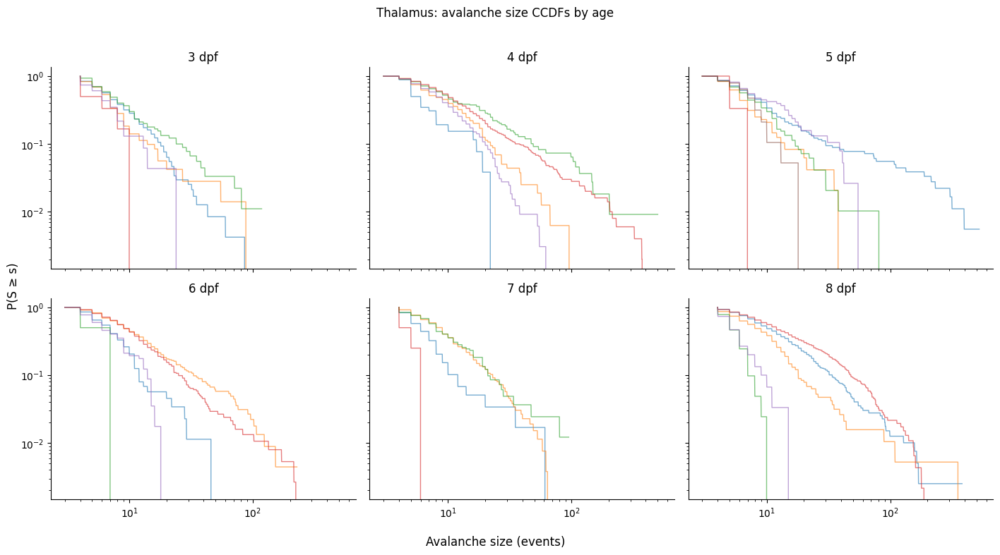

In [708]:
for reg in reg_list:
    ncols = 3
    nrows = int(np.ceil(len(ages) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True, sharey=True)
    axes = np.array(axes).ravel()
    
    for ax, age in zip(axes, ages):
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        avs_toplot = []
        for c in name_keys[age_bools]:
            if np.isin(reg,list(av_dic[c].keys())):
                avs_toplot.append(av_dic[c][reg]['av'][0]) 
        # print(str(age) + 'dpf')
        # print(len(avs_toplot))
        if np.concatenate(avs_toplot).size ==0:
            continue
        else:
            b = set_bins(avs_toplot, bins=1000)
    
        for age_name in name_keys[age_bools]:
            if np.isin(reg,list(av_dic[age_name].keys())):
                av = av_dic[age_name][reg]['av'][0]
                av = ccdf(av,b)
                ax.plot(b, av, alpha=0.6, linewidth=1)
    
        ax.set_title(f"{age} dpf")
        ax.set_xscale("log"); ax.set_yscale("log")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    
    # turn off unused axes
    for j in range(len(ages), len(axes)):
        axes[j].axis("off")
    
    fig.suptitle(f"{reg}: avalanche size CCDFs by age", y=1.02)
    fig.supxlabel("Avalanche size (events)")
    fig.supylabel("P(S ≥ s)")
    plt.tight_layout()
    plt.show()

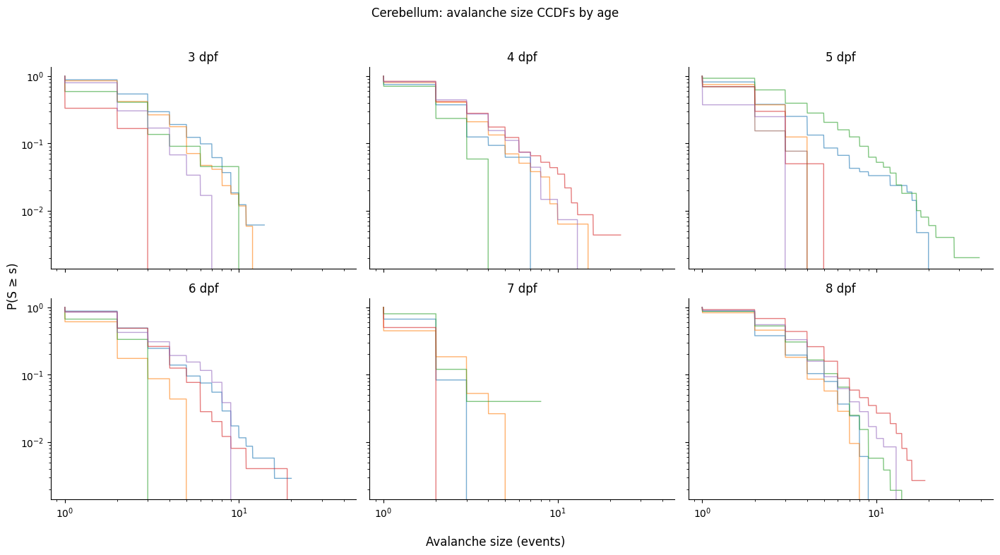

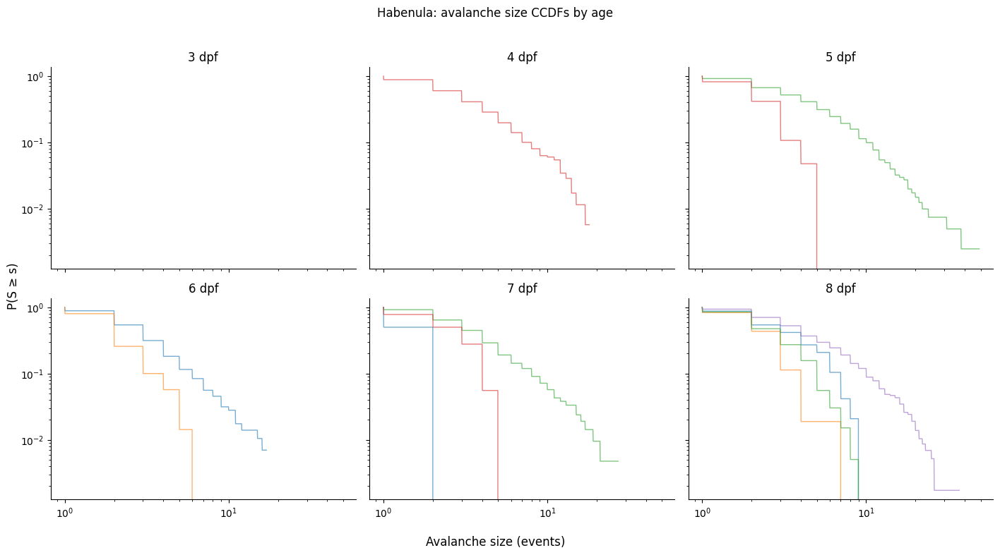

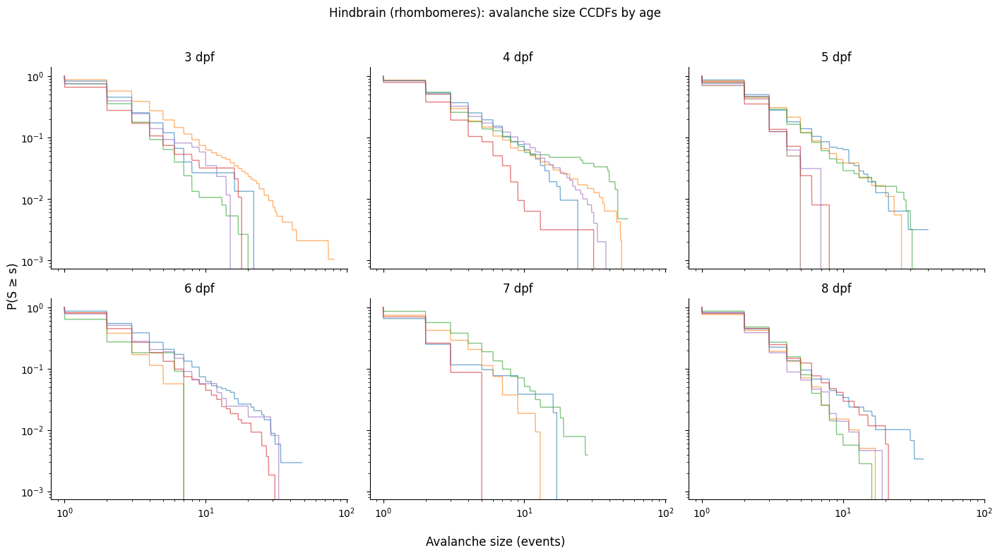

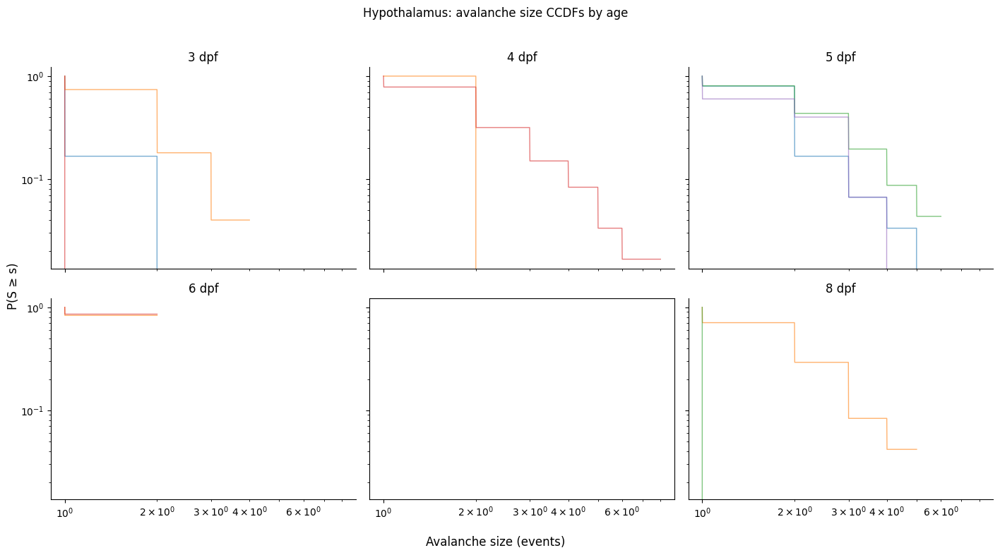

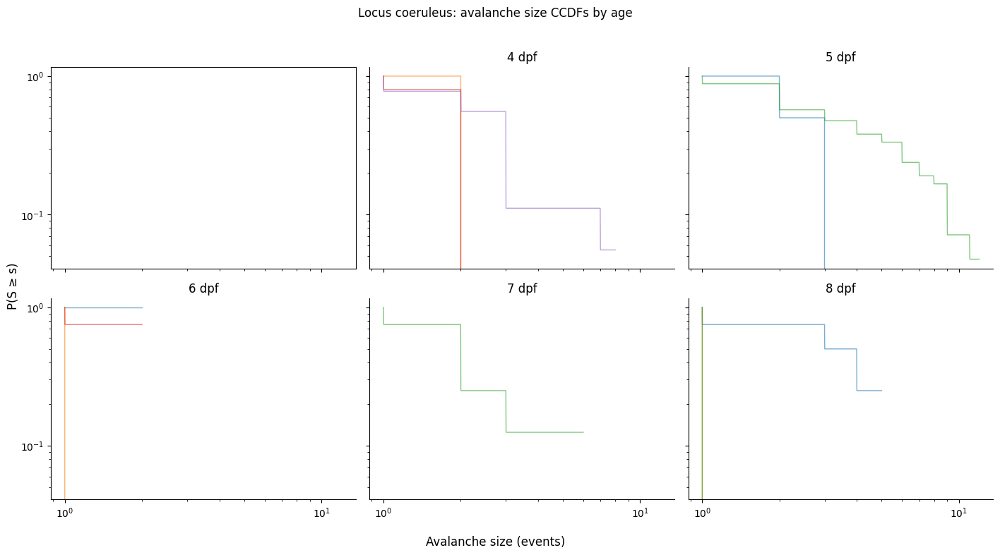

...

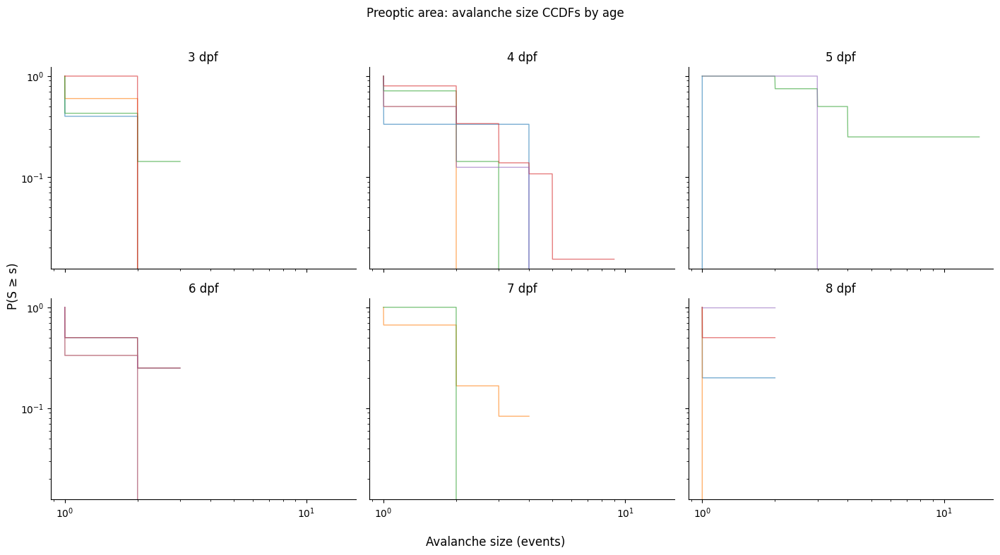

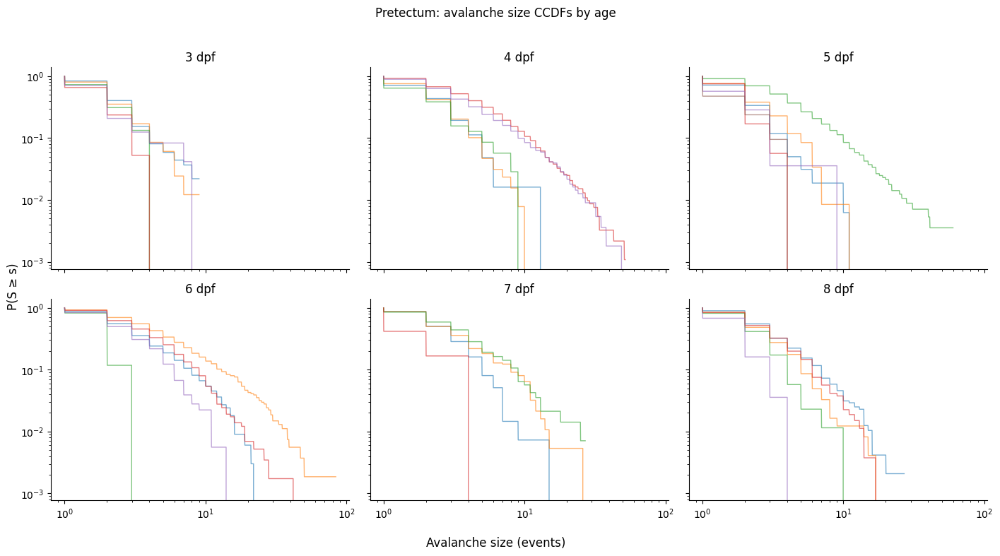

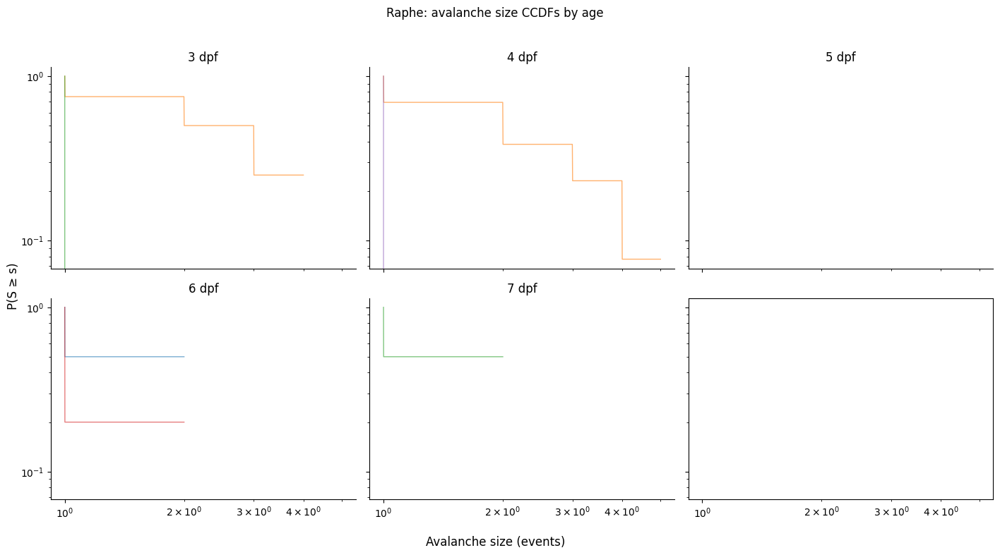

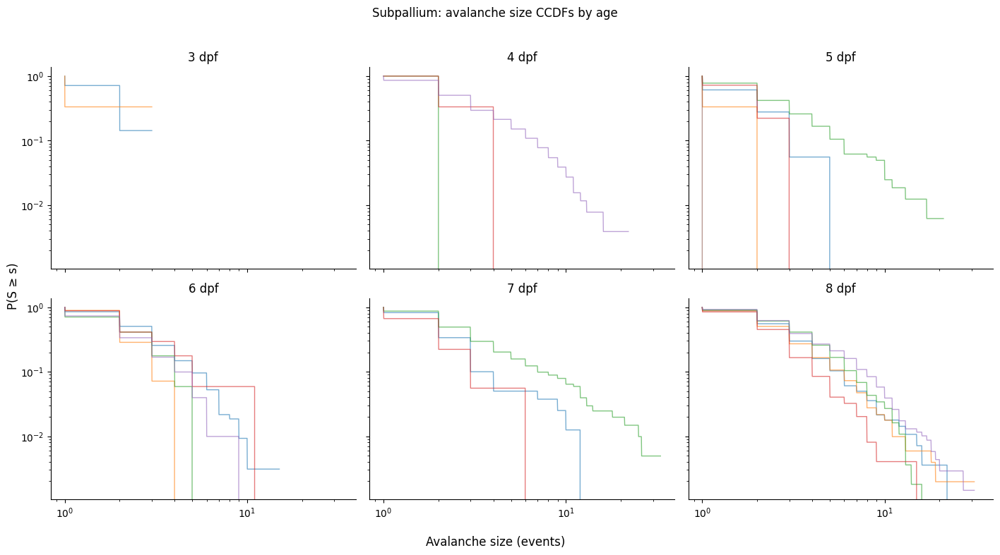

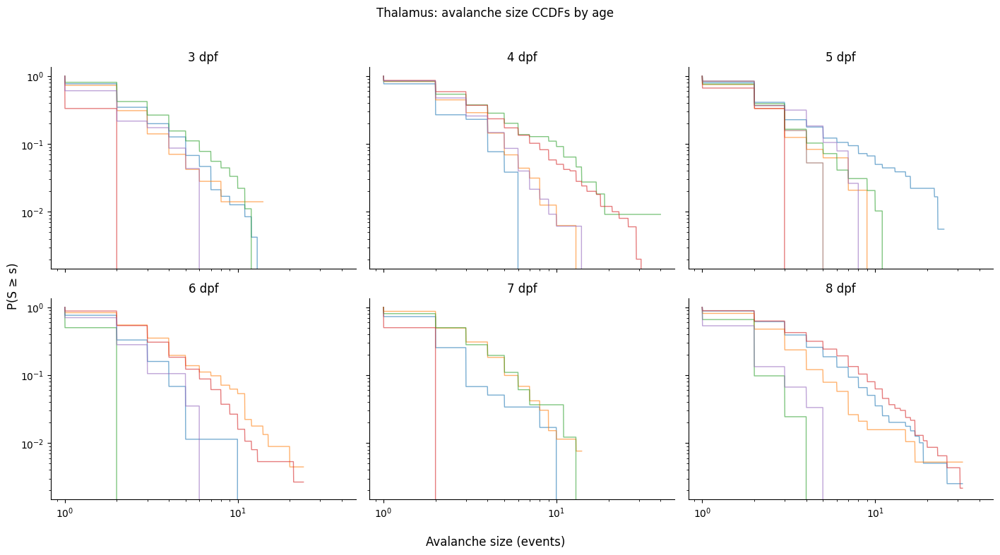

In [710]:
for reg in reg_list:
    ncols = 3
    nrows = int(np.ceil(len(ages) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True, sharey=True)
    axes = np.array(axes).ravel()
    
    for ax, age in zip(axes, ages):
        age_bools = pd.Series(name_keys).str.contains(str(age)+'dpf')
        avs_toplot = []
        for c in name_keys[age_bools]:
            if np.isin(reg,list(av_dic[c].keys())):
                avs_toplot.append(av_dic[c][reg]['av'][1]) 
        # print(str(age) + 'dpf')
        # print(len(avs_toplot))
        if np.concatenate(avs_toplot).size ==0:
            continue
        else:
            b = set_bins(avs_toplot, bins=1000)
    
        for age_name in name_keys[age_bools]:
            if np.isin(reg,list(av_dic[age_name].keys())):
                av = av_dic[age_name][reg]['av'][1]
                av = ccdf(av,b)
                ax.plot(b, av, alpha=0.6, linewidth=1)
    
        ax.set_title(f"{age} dpf")
        ax.set_xscale("log"); ax.set_yscale("log")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    
    # turn off unused axes
    for j in range(len(ages), len(axes)):
        axes[j].axis("off")
    
    fig.suptitle(f"{reg}: avalanche size CCDFs by age", y=1.02)
    fig.supxlabel("Avalanche size (events)")
    fig.supylabel("P(S ≥ s)")
    plt.tight_layout()
    plt.show()

Cerebellum


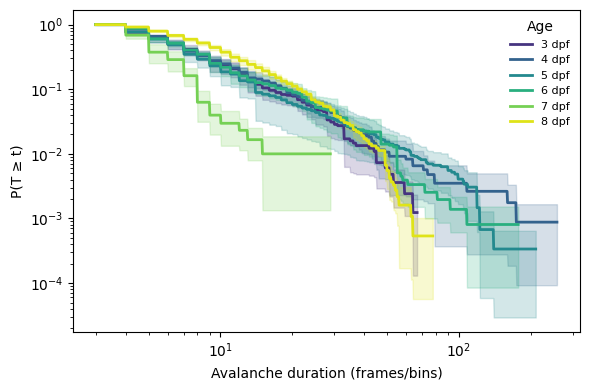

Hindbrain (rhombomeres)


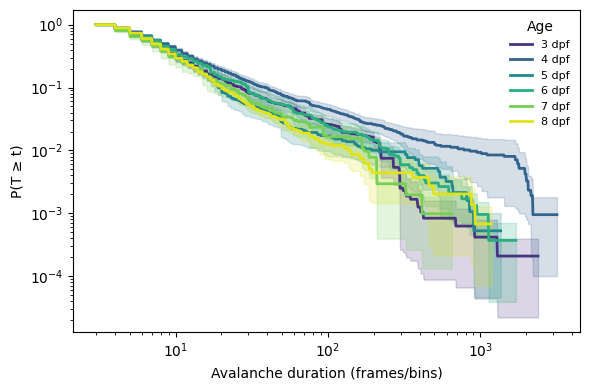

Midbrain (other)


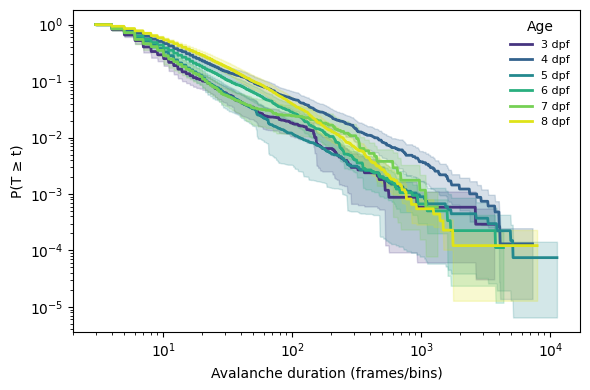

Olfactory bulb


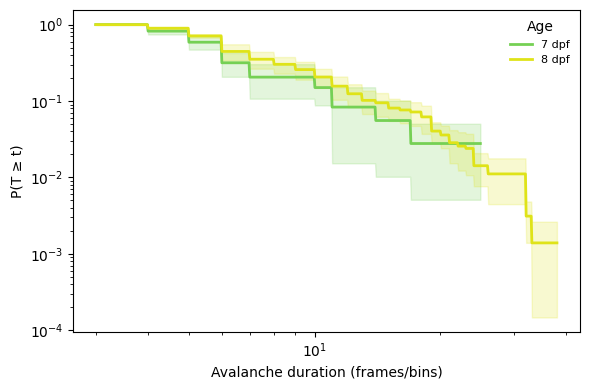

Optic tectum - SPV


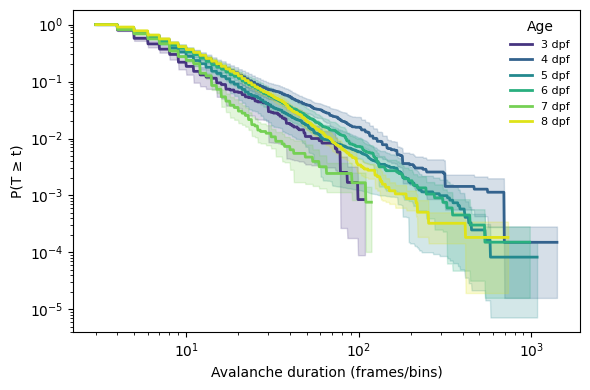

Pallium


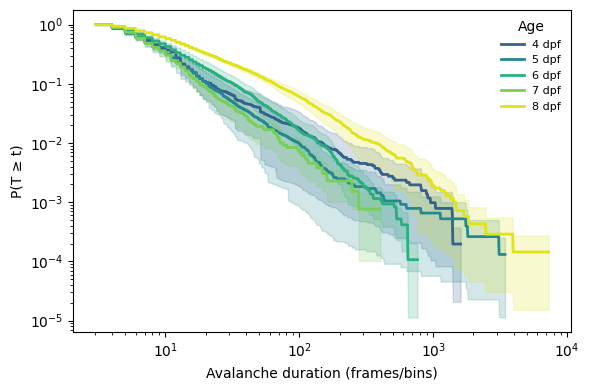

Preoptic area


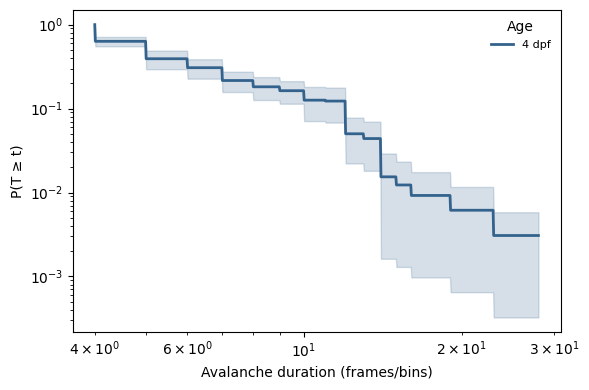

Pretectum


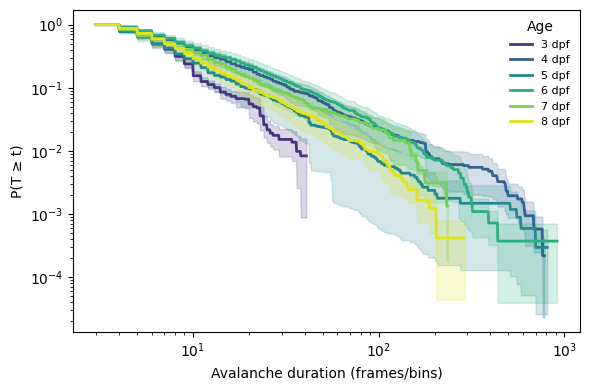

Subpallium


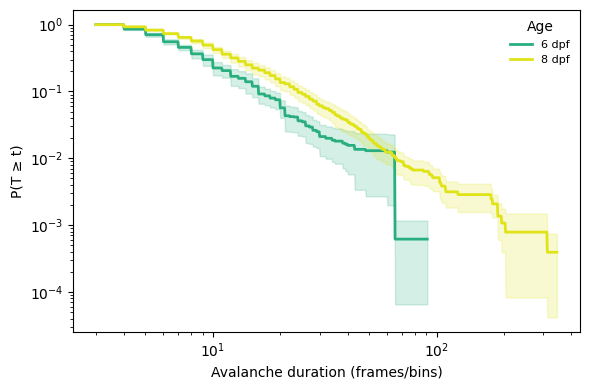

Thalamus


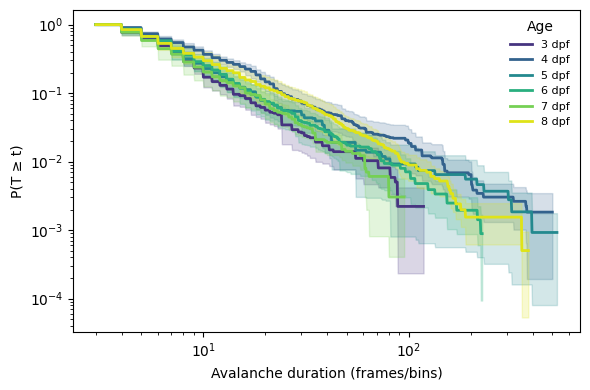

In [719]:
for reg in reg_list:

    avs_toplot = []
    for c in name_keys:
        if np.isin(reg, list(av_dic[c].keys())):
            avs_toplot.append(av_dic[c][reg]['av'][0])

    if np.concatenate(avs_toplot).size == 0:
        continue
    else:
        b = set_bins(avs_toplot, bins=1000)

    b = b[b > 0]  # ensure positive bins for log x

    cmap = plt.get_cmap("viridis")
    colors = cmap(np.linspace(0.15, 0.95, len(ages)))

    plt.figure(figsize=(6,4))
    any_plotted = False


    for age, col in zip(ages, colors):
        age_bools = pd.Series(name_keys).str.contains(str(age) + 'dpf')

        avs_age = []
        for c in name_keys[age_bools]:
            if np.isin(reg, list(av_dic[c].keys())):
                avs_age.append(av_dic[c][reg]['av'][0])

        if len(avs_age) == 0:
            continue

        Y = np.vstack([ccdf(av, b) for av in avs_age])
        mean, sem = ccdf_mean(Y)

        m = (b > 0) & np.isfinite(mean) & np.isfinite(sem) & (mean > 0)
        if np.sum(m) == 0:
            continue

        plt.plot(b[m], mean[m], linewidth=2, color=col, label=f"{age} dpf")
        plt.fill_between(b[m], (mean - sem)[m], (mean + sem)[m], alpha=0.2, color=col)
        any_plotted = True

    if not any_plotted:
        plt.close()
        continue
    print(reg)
    plt.xscale("log"); plt.yscale("log")
    plt.xlabel("Avalanche duration (frames/bins)")
    plt.ylabel("P(T ≥ t)")
    plt.legend(frameon=False, fontsize=8, title="Age")
    plt.tight_layout()
    plt.show()

Cerebellum


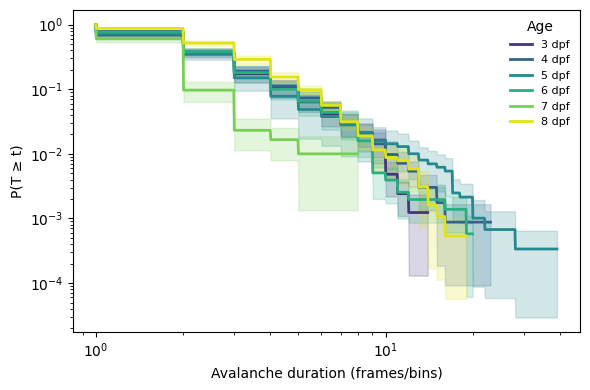

Hindbrain (rhombomeres)


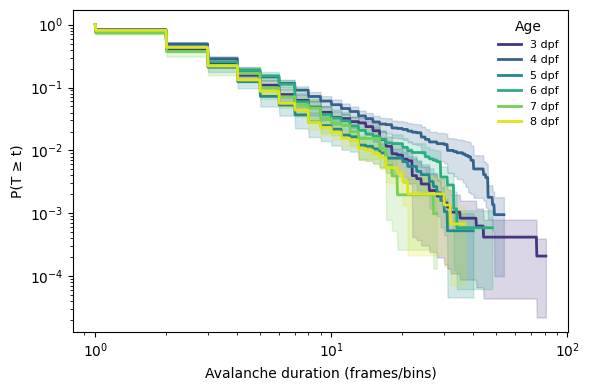

Midbrain (other)


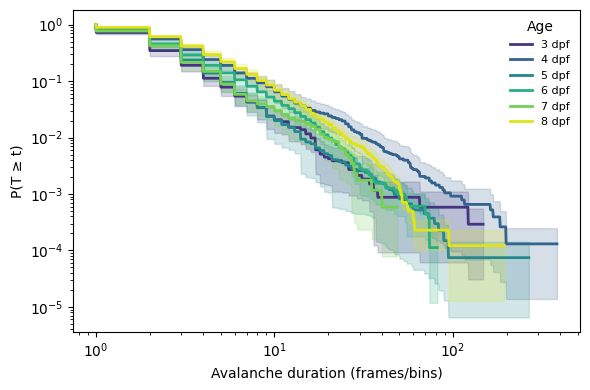

Olfactory bulb


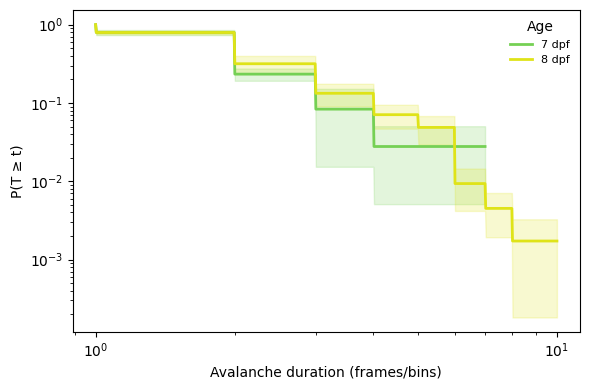

Optic tectum - SPV


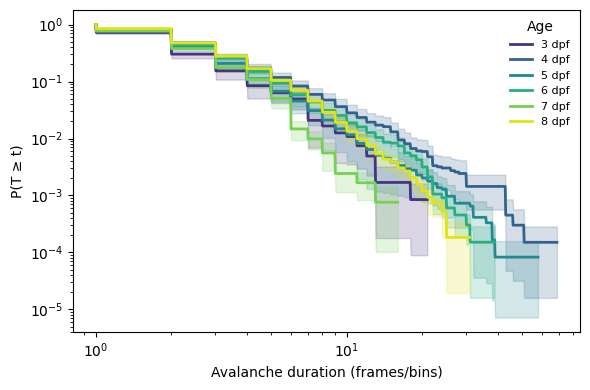

Pallium


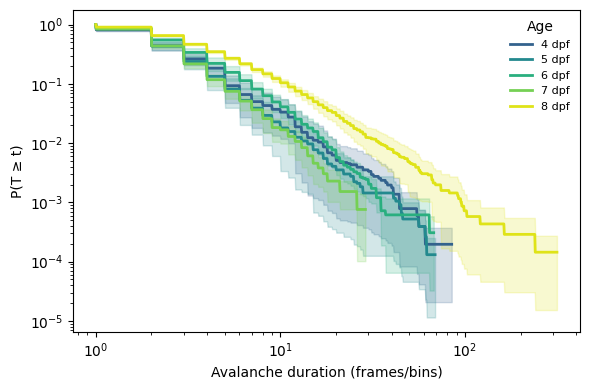

Preoptic area


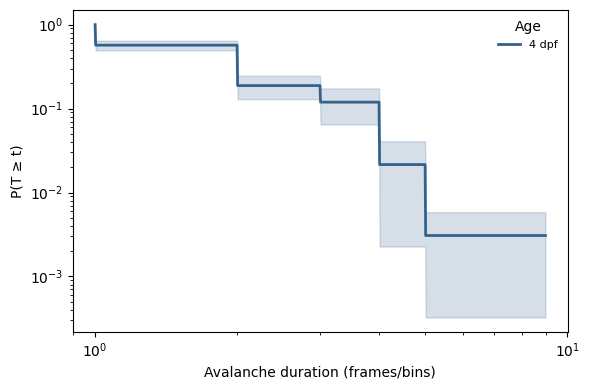

Pretectum


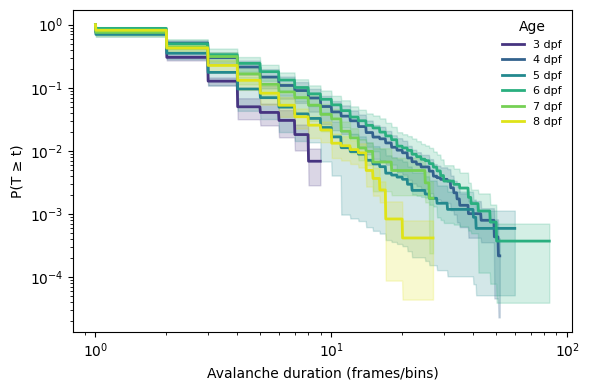

Subpallium


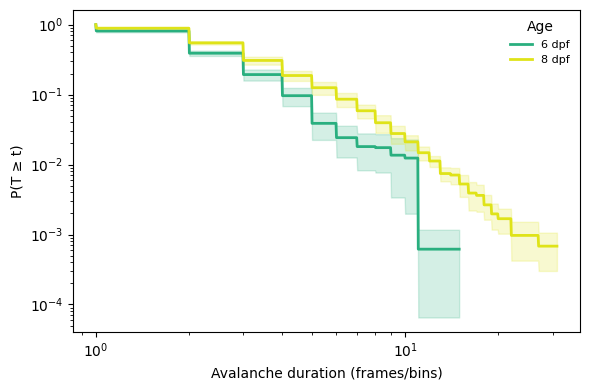

Thalamus


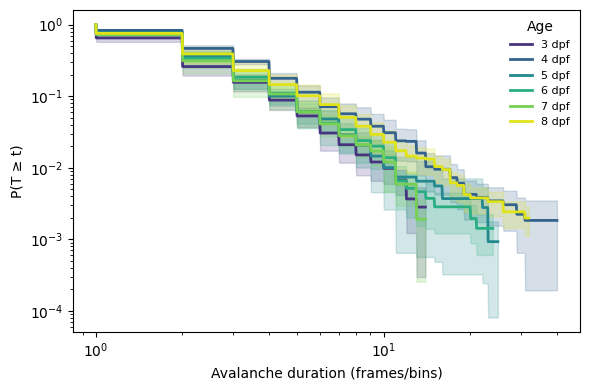

In [718]:
for reg in reg_list:

    avs_toplot = []
    for c in name_keys:
        if np.isin(reg, list(av_dic[c].keys())):
            avs_toplot.append(av_dic[c][reg]['av'][1])

    if np.concatenate(avs_toplot).size == 0:
        continue
    else:
        b = set_bins(avs_toplot, bins=1000)

    b = b[b > 0]  # ensure positive bins for log x

    cmap = plt.get_cmap("viridis")
    colors = cmap(np.linspace(0.15, 0.95, len(ages)))

    plt.figure(figsize=(6,4))
    any_plotted = False


    for age, col in zip(ages, colors):
        age_bools = pd.Series(name_keys).str.contains(str(age) + 'dpf')

        avs_age = []
        for c in name_keys[age_bools]:
            if np.isin(reg, list(av_dic[c].keys())):
                avs_age.append(av_dic[c][reg]['av'][1])

        if len(avs_age) == 0:
            continue

        Y = np.vstack([ccdf(av, b) for av in avs_age])
        mean, sem = ccdf_mean(Y)

        m = (b > 0) & np.isfinite(mean) & np.isfinite(sem) & (mean > 0)
        if np.sum(m) == 0:
            continue

        plt.plot(b[m], mean[m], linewidth=2, color=col, label=f"{age} dpf")
        plt.fill_between(b[m], (mean - sem)[m], (mean + sem)[m], alpha=0.2, color=col)
        any_plotted = True

    if not any_plotted:
        plt.close()
        continue
    print(reg)
    plt.xscale("log"); plt.yscale("log")
    plt.xlabel("Avalanche duration (frames/bins)")
    plt.ylabel("P(T ≥ t)")
    plt.legend(frameon=False, fontsize=8, title="Age")
    plt.tight_layout()
    plt.show()

In [888]:
def pl_stats(x, xmin=6, xmax=1e4, discrete=True,
                               compare_to="lognormal", min_av = 10):
    x = np.asarray(x).ravel()
    x = x[np.isfinite(x) & (x > 0)]
    if discrete:
        x = x.astype(int)

    # hard bounds in the *data*
    x = x[x >= xmin]
    if xmax is not None:
        x = x[x <= xmax]

    if x.size < min_av:
        return np.nan, np.nan, np.nan, np.nan

    # fit (xmax here is the hard upper cutoff for fitting)
    fit = powerlaw.Fit(x, discrete=discrete, xmin=xmin, xmax=xmax, verbose=False)
    alpha = float(fit.power_law.alpha)
    ks_D = float(fit.power_law.KS())

    # log-likelihood ratio test (R) + p-value vs another distribution
    # (positive R -> first arg "power_law" favored; negative -> compare_to favored)
    R, p = fit.distribution_compare("power_law", compare_to)
    return alpha, ks_D, float(R), float(p)

def dcc(av_size, av_dur,
                   xmin_size=6, xmax_size=1e4,
                   xmin_dur=1,  xmax_dur=20,
                   discrete=True,
                   dur_scale=2.73,
                   min_av=10):
    S = np.asarray(av_size).ravel().astype(float)
    T = np.asarray(av_dur).ravel().astype(float)
    m = np.isfinite(S) & np.isfinite(T) & (S > 0) & (T > 0)
    S, T = S[m], T[m]

    # match your duration scaling
    T = T / dur_scale

    # --- exponents using the same hard bounds style as pl_stats() ---
    size_exp, _, _, _ = pl_stats(S, xmin=xmin_size, xmax=xmax_size,
                                discrete=discrete, min_av=min_av)
    dur_exp,  _, _, _ = pl_stats(T, xmin=xmin_dur,  xmax=xmax_dur,
                                discrete=discrete, min_av=min_av)

    if not (np.isfinite(size_exp) and np.isfinite(dur_exp)) or (size_exp == 1.0):
        return np.nan, np.nan

    # --- scaling fit on the SAME bounded data window ---
    keep = (S >= xmin_size) & (S <= xmax_size) & (T >= xmin_dur) & (T <= xmax_dur)
    S, T = S[keep], T[keep]
    if S.size < min_av:
        return np.nan, np.nan

    # mean size per unique duration
    Tu = np.unique(T)
    size_vec = np.array([np.mean(S[T == t]) for t in Tu], float)
    xaxis = Tu.astype(float)
    yaxis = size_vec.astype(float)

    # # match your "drop last point" behavior
    # if xaxis.size < (min_av/2):
    #     return np.nan, np.nan
    xfit = xaxis[:-1]
    yfit = yaxis[:-1]

    ok = (xfit > 0) & (yfit > 0) & np.isfinite(xfit) & np.isfinite(yfit)
    xfit, yfit = xfit[ok], yfit[ok]
    # if xfit.size < (min_av/2):
    #     return np.nan, np.nan

    fit_beta, _ = np.polyfit(np.log10(xfit), np.log10(yfit), 1)

    pred_beta = (dur_exp - 1.0) / (size_exp - 1.0)
    dcc = float(np.abs(fit_beta - pred_beta))
    return dcc, float(fit_beta)

def br(curr, max_steps=200):
    sumd = curr.sum(axis=0)

    steps = (1, max_steps)                   # lag range in *bins*
    rk = mre.coefficients(
        sumd,                             # 1D is treated as a single trial :contentReference[oaicite:3]{index=3}
        method="trialseparated",       # or "ts" :contentReference[oaicite:4]{index=4}
        steps=steps,
        dt=1,
        dtunit="bins",
        desc="fish_i_pop"
    )
    
    fit = mre.fit(
        rk,
        fitfunc=mre.f_exponential_offset  # exp + offset :contentReference[oaicite:5]{index=5}
    )
    return(fit.tau, fit.mre)

import numpy as np
from scipy.optimize import curve_fit

def corr_length(coords, X, n_bins=30, max_pairs=200_000, seed=0):
    coords = np.asarray(coords, float)   # (N,3)
    X = np.asarray(X, float)            # (N,T)
    N, T = X.shape
    assert coords.shape[0] == N and coords.shape[1] == 3

    # z-score each unit
    X = X - X.mean(axis=1, keepdims=True)
    X = X / (X.std(axis=1, keepdims=True) + 1e-12)

    # sample pairs
    iu = np.triu_indices(N, 1)
    P = iu[0].size
    rng = np.random.default_rng(seed)
    take = min(max_pairs, P)
    idx = rng.choice(P, size=take, replace=False)
    i, j = iu[0][idx], iu[1][idx]

    # distances from coords
    d = np.linalg.norm(coords[i] - coords[j], axis=1)

    # absolute correlation per pair
    c = np.abs(np.mean(X[i] * X[j], axis=1))

    # bin mean |corr| vs distance
    edges = np.linspace(d.min(), d.max(), n_bins + 1)
    b = np.digitize(d, edges) - 1
    centers = 0.5 * (edges[:-1] + edges[1:])

    mean_c = np.array([c[b == k].mean() if np.any(b == k) else np.nan for k in range(n_bins)])
    m = np.isfinite(mean_c)

    # fit A * exp(-d/xi)
    def f(x, A, xi):
        return A * np.exp(-x / xi)

    popt, _ = curve_fit(f, centers[m], mean_c[m],
                        p0=(mean_c[m][0], np.median(centers[m])))
    A, xi = popt
    return xi, A, centers, mean_c
    

In [900]:
#estimate avalanche stats -> all! 
#==============================
av_dic = np.load(f"{fdata}/all_avalanches.npy",allow_pickle=True).item()
regs = ['all']
name_keys = np.asarray(list(av_dic.keys()))
ages = [3,4,5,6,7,8]

rows=[]
for fish in name_keys:
    name = os.path.basename(fish)
    age = name.split('dpf')[0][-1]
    bind=np.load(bind_l[pd.Series(bind_l).str.contains(fish)][0])
    trace=np.load(dff_l[pd.Series(dff_l).str.contains(fish)][0])
    coord = np.load(coord_l[pd.Series(coord_l).str.contains(fish)][0]
                    , allow_pickle=True)

    for reg in regs:
        av_size, av_dur = av_dic[fish][reg]['av']
        sub_trace, sub_dff, sub_bind, sub_coord = tfn.select_region(
        trace, trace, bind, coord, reg
    )
        xyz = sub_coord[:,:3].astype(float) * [.8,.8,15]


        exp_s, ks_s, r_s, p_s = pl_stats(av_size, xmin=6, xmax=1e4, min_av=10)
        exp_d, ks_d, r_d, p_d = pl_stats(av_dur, xmin=1, xmax=20, min_av=10)
        dcc_, beta = dcc(av_size, av_dur) 
        br_tau, br_mre = br(sub_bind, max_steps=200)
        cl_xi, cl_A, cl_bins, cl_means = corr_length(xyz, sub_trace)


        rows.append({
            "name": name,
            "age_dpf": age,
            "region": reg,

            "exp_size": exp_s,
            "ks_size": ks_s,
            "llr_size": r_s,
            "p_size": p_s,

            "exp_dur": exp_d,
            "ks_dur": ks_d,
            "llr_dur": r_d,
            "p_dur": p_d,

            "dcc": dcc_,
            "beta_ST": beta,

            "br_tau": br_tau,
            "br_mre": br_mre,

            "corr_xi": cl_xi,
            "corr_A": cl_A
        })

df = pd.DataFrame(rows)

out_csv = f"{fdata}/avalanche_stats_all.csv"
df.to_csv(out_csv, index=False)
print("saved:", out_csv, "rows:", len(df))

You should provide an ndarray of shape(numtrials, datalength)
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping y

saved: /home/dburrows/DATA/BLNDEV-WILDTYPE//avalanche_stats_all.csv rows: 30


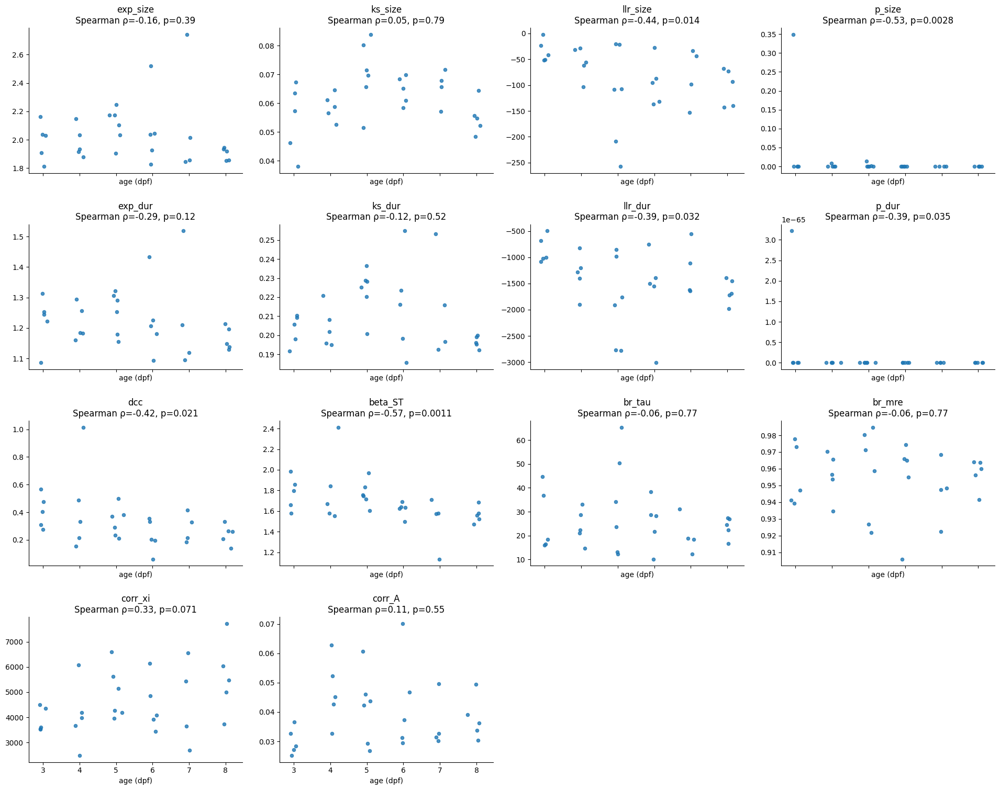

parameter  spearman_rho  p_value  n
  beta_ST     -0.568359 0.001050 30
   p_size     -0.526617 0.002793 30
 llr_size     -0.442232 0.014407 30
      dcc     -0.421023 0.020508 30
  llr_dur     -0.392368 0.031983 30
    p_dur     -0.385771 0.035252 30
  corr_xi      0.334607 0.070708 30
  exp_dur     -0.291738 0.117755 30
 exp_size     -0.164483 0.385083 30
   ks_dur     -0.123419 0.515847 30
   corr_A      0.112589 0.553610 30
   br_mre     -0.055505 0.770808 30
   br_tau     -0.055505 0.770808 30
  ks_size      0.050090 0.792659 30


In [922]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

df = pd.read_csv(f"{fdata}/avalanche_stats_all.csv")
df["age_dpf"] = pd.to_numeric(df["age_dpf"], errors="coerce")
if "region" in df.columns:
    df = df[df["region"] == "all"].copy()

pars = [
    "exp_size", "ks_size", "llr_size", "p_size",
    "exp_dur",  "ks_dur",  "llr_dur",  "p_dur",
    "dcc", "beta_ST",
    "br_tau", "br_mre",
    "corr_xi", "corr_A",
]

# jitter settings (x-axis jitter in dpf units)
rng = np.random.default_rng(0)
jitter_sd = 0.08

ncols = 4
nrows = int(np.ceil(len(pars) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True)
axes = np.array(axes).ravel()

for ax, par in zip(axes, pars):
    d = df[["age_dpf", par]].dropna()
    if d.shape[0] < 3:
        ax.set_title(f"{par}\n(n<3)")
        ax.axis("off")
        continue

    x = d["age_dpf"].to_numpy()
    y = d[par].to_numpy()

    rho, pval = spearmanr(x, y, nan_policy="omit")

    xj = x + rng.normal(0.0, jitter_sd, size=x.shape)

    ax.scatter(xj, y, s=20, alpha=0.8)
    ax.set_title(f"{par}\nSpearman ρ={rho:.2f}, p={pval:.2g}")
    ax.set_xlabel("age (dpf)")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

for j in range(len(pars), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

rows = []
for par in pars:
    d = df[["age_dpf", par]].dropna()
    if d.shape[0] < 3:
        continue
    rho, pval = spearmanr(d["age_dpf"].to_numpy(), d[par].to_numpy(), nan_policy="omit")
    rows.append((par, rho, pval, d.shape[0]))

res = pd.DataFrame(rows, columns=["parameter", "spearman_rho", "p_value", "n"]).sort_values("p_value")
print(res.to_string(index=False))


In [908]:
#estimate avalanche stats -> coarse
#==============================
av_dic = np.load(f"{fdata}/coarse_avalanches.npy",allow_pickle=True).item()
regs = ['Diencephalon', 'Hindbrain', 'Midbrain', 'Telencephalon']
name_keys = np.asarray(list(av_dic.keys()))
ages = [3,4,5,6,7,8]

rows=[]
for fish in name_keys:
    name = os.path.basename(fish)
    age = name.split('dpf')[0][-1]
    bind=np.load(bind_l[pd.Series(bind_l).str.contains(fish)][0])
    trace=np.load(dff_l[pd.Series(dff_l).str.contains(fish)][0])
    coord = np.load(coord_l[pd.Series(coord_l).str.contains(fish)][0]
                    , allow_pickle=True)

    for reg in regs:
        av_size, av_dur = av_dic[fish][reg]['av']

        locs = np.where(coord[:,4] == reg)
        sub_coord = coord[locs]
        sub_trace, sub_bind = trace[locs], bind[locs]
        xyz = sub_coord[:,:3].astype(float) * [.8,.8,15]


        exp_s, ks_s, r_s, p_s = pl_stats(av_size, xmin=6, xmax=1e4, min_av=10)
        exp_d, ks_d, r_d, p_d = pl_stats(av_dur, xmin=1, xmax=20, min_av=10)
        dcc_, beta = dcc(av_size, av_dur) 
        br_tau, br_mre = br(sub_bind, max_steps=200)
        cl_xi, cl_A, cl_bins, cl_means = corr_length(xyz, sub_trace)


        rows.append({
            "name": name,
            "age_dpf": age,
            "region": reg,

            "exp_size": exp_s,
            "ks_size": ks_s,
            "llr_size": r_s,
            "p_size": p_s,

            "exp_dur": exp_d,
            "ks_dur": ks_d,
            "llr_dur": r_d,
            "p_dur": p_d,

            "dcc": dcc_,
            "beta_ST": beta,

            "br_tau": br_tau,
            "br_mre": br_mre,

            "corr_xi": cl_xi,
            "corr_A": cl_A
        })

df = pd.DataFrame(rows)

out_csv = f"{fdata}/avalanche_stats_coarse.csv"
df.to_csv(out_csv, index=False)
print("saved:", out_csv, "rows:", len(df))

You should provide an ndarray of shape(numtrials, datalength)
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping y

saved: /home/dburrows/DATA/BLNDEV-WILDTYPE//avalanche_stats_coarse.csv rows: 120


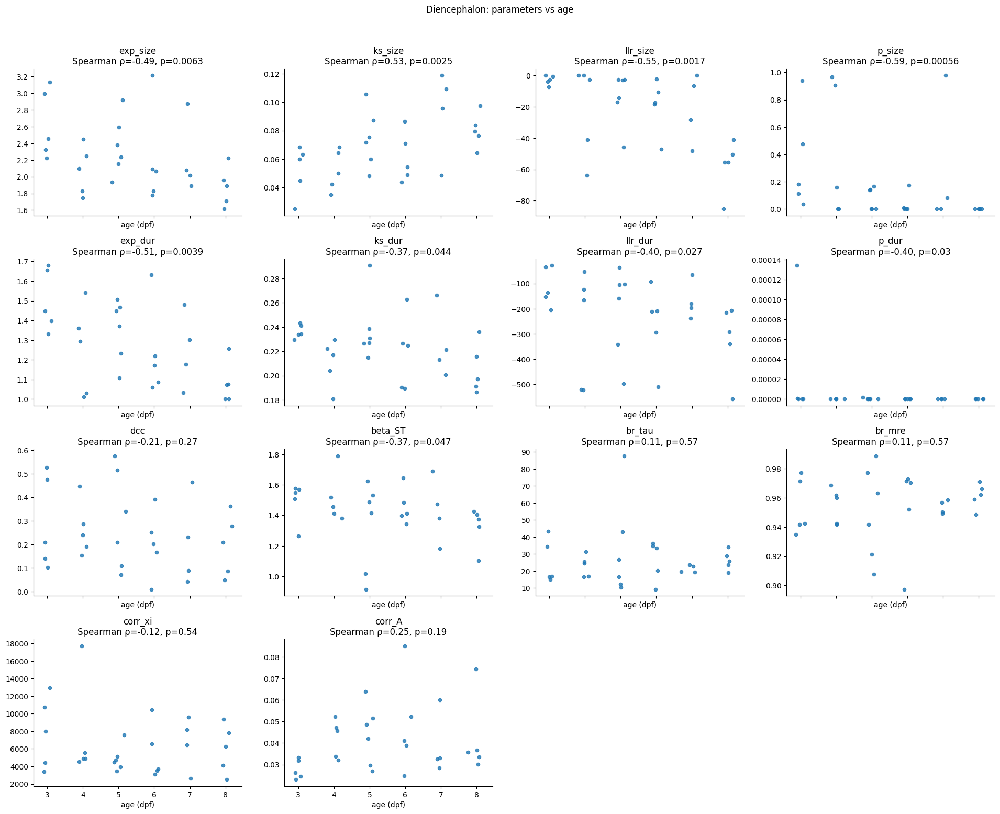


===== Diencephalon =====
parameter  spearman_rho  p_value  n
   p_size     -0.592727 0.000558 30
 llr_size     -0.548503 0.001699 30
  ks_size      0.531356 0.002515 30
  exp_dur     -0.511049 0.003901 30
 exp_size     -0.487358 0.006303 30
  llr_dur     -0.403199 0.027153 30
    p_dur     -0.397332 0.029690 30
   ks_dur     -0.370934 0.043592 30
  beta_ST     -0.365293 0.047147 30
   corr_A      0.247740 0.186849 30
      dcc     -0.209835 0.265742 30
  corr_xi     -0.115973 0.541673 30
   br_mre      0.107625 0.571335 30
   br_tau      0.107625 0.571335 30


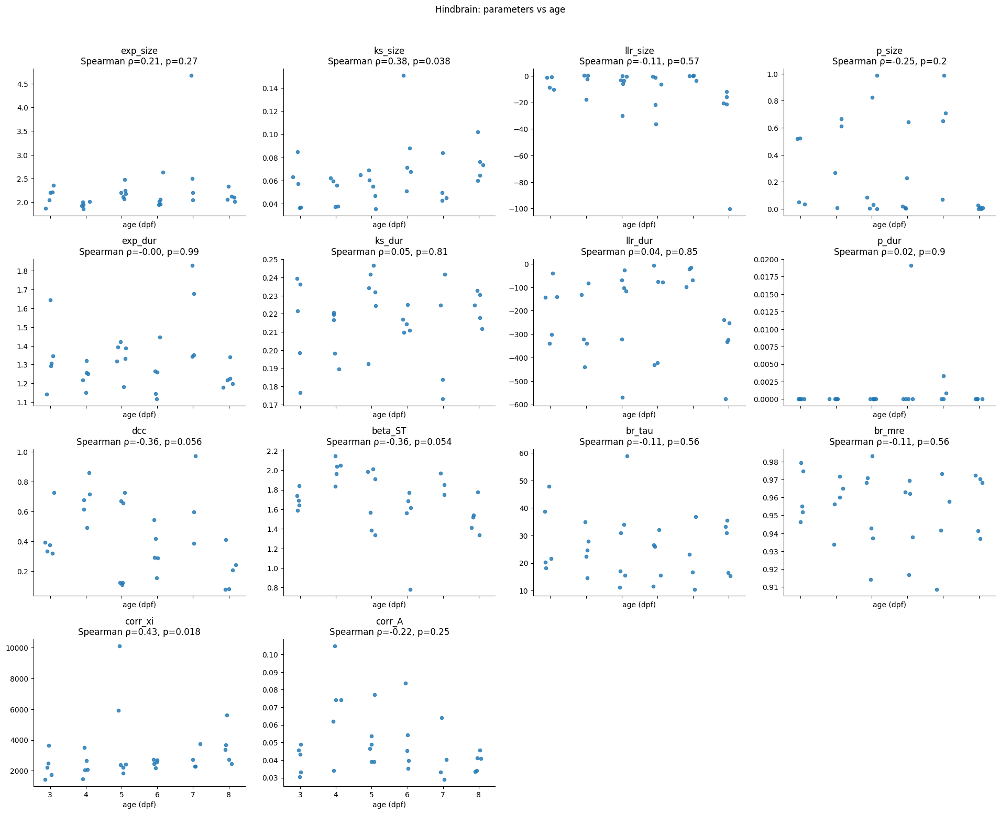


===== Hindbrain =====
parameter  spearman_rho  p_value  n
  corr_xi      0.430274 0.017627 30
  ks_size      0.380184 0.038226 30
  beta_ST     -0.361745 0.053825 29
      dcc     -0.358245 0.056361 29
   p_size     -0.248534 0.202210 28
   corr_A     -0.217055 0.249263 30
 exp_size      0.205999 0.274778 30
   br_mre     -0.109881 0.563247 30
   br_tau     -0.109881 0.563247 30
 llr_size     -0.106960 0.573729 30
   ks_dur      0.045351 0.811907 30
  llr_dur      0.037229 0.845148 30
    p_dur      0.023240 0.902981 30
  exp_dur     -0.002031 0.991503 30


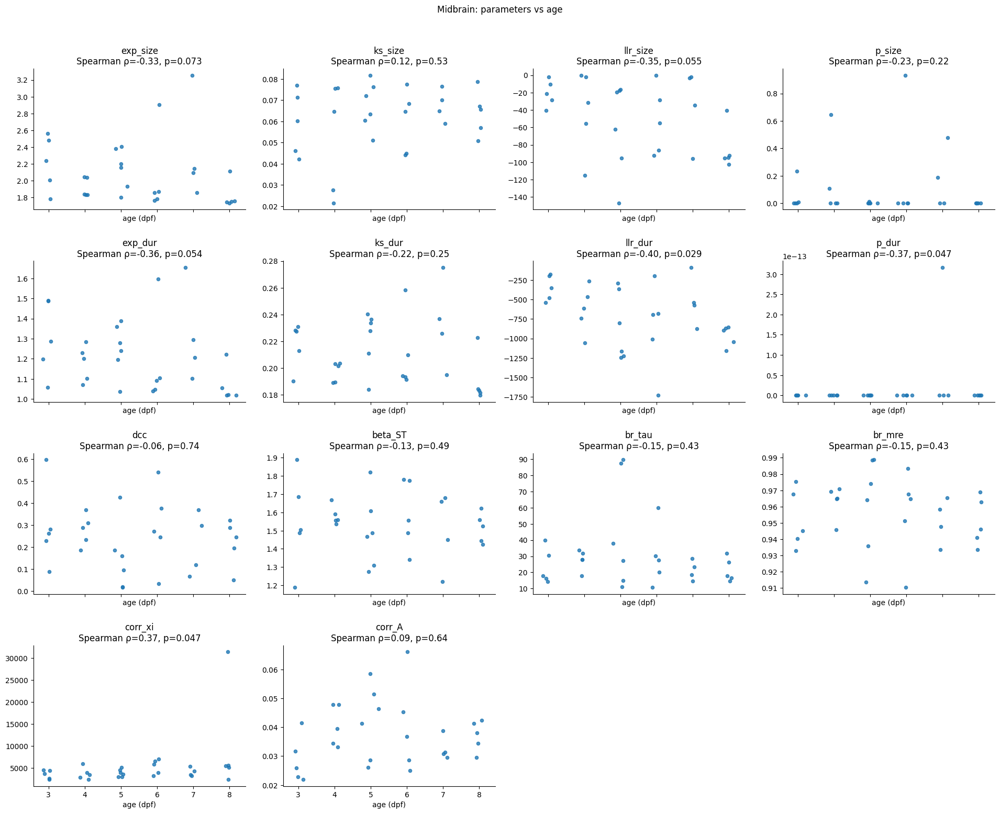


===== Midbrain =====
parameter  spearman_rho  p_value  n
  llr_dur     -0.397783 0.029488 30
    p_dur     -0.366195 0.046563 30
  corr_xi      0.365293 0.047147 30
  exp_dur     -0.355591 0.053799 30
 llr_size     -0.354237 0.054783 30
 exp_size     -0.331674 0.073368 30
   p_size     -0.230593 0.220220 30
   ks_dur     -0.217506 0.248256 30
   br_tau     -0.150269 0.428012 30
   br_mre     -0.150269 0.428012 30
  beta_ST     -0.130413 0.492149 30
  ks_size      0.118906 0.531427 30
   corr_A      0.089575 0.637840 30
      dcc     -0.063402 0.739252 30


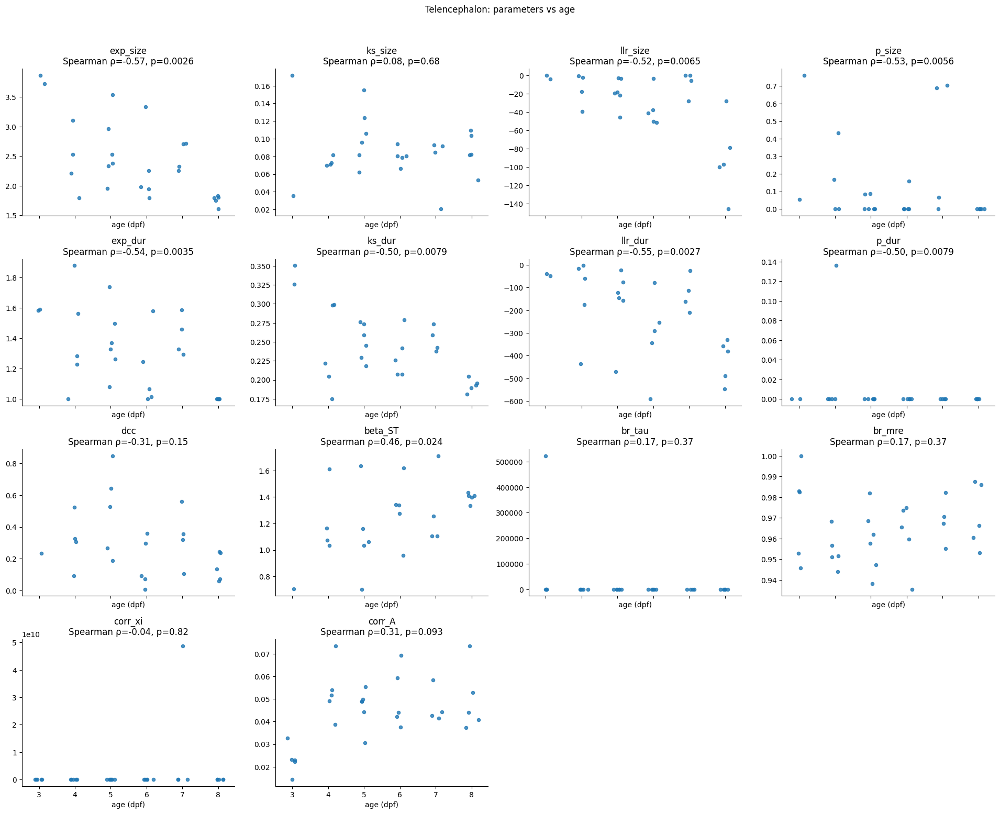


===== Telencephalon =====
parameter  spearman_rho  p_value  n
 exp_size     -0.565251 0.002621 26
  llr_dur     -0.554217 0.002703 27
  exp_dur     -0.542425 0.003467 27
   p_size     -0.528054 0.005558 26
 llr_size     -0.519711 0.006505 26
    p_dur     -0.500223 0.007881 27
   ks_dur     -0.499912 0.007925 27
  beta_ST      0.458921 0.024088 24
   corr_A      0.312270 0.092956 30
      dcc     -0.305358 0.146779 24
   br_mre      0.170801 0.366834 30
   br_tau      0.170801 0.366834 30
  ks_size      0.084127 0.682837 26
  corr_xi     -0.042193 0.824799 30


In [923]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

df = pd.read_csv(f"{fdata}/avalanche_stats_coarse.csv")
df["age_dpf"] = pd.to_numeric(df["age_dpf"], errors="coerce")

pars = [
    "exp_size", "ks_size", "llr_size", "p_size",
    "exp_dur",  "ks_dur",  "llr_dur",  "p_dur",
    "dcc", "beta_ST",
    "br_tau", "br_mre",
    "corr_xi", "corr_A",
]

regs = [r for r in ["Diencephalon", "Hindbrain", "Midbrain", "Telencephalon"]
        if r in df["region"].unique()]

# jitter settings
rng = np.random.default_rng(0)
jitter_sd = 0.08

for reg in regs:
    dfr = df[df["region"] == reg].copy()

    ncols = 4
    nrows = int(np.ceil(len(pars) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True)
    axes = np.array(axes).ravel()

    for ax, par in zip(axes, pars):
        d = dfr[["age_dpf", par]].dropna()
        if d.shape[0] < 3:
            ax.set_title(f"{par}\n(n<3)")
            ax.axis("off")
            continue

        x = d["age_dpf"].to_numpy()
        y = d[par].to_numpy()

        rho, pval = spearmanr(x, y, nan_policy="omit")

        xj = x + rng.normal(0.0, jitter_sd, size=x.shape)

        ax.scatter(xj, y, s=20, alpha=0.8)
        ax.set_title(f"{par}\nSpearman ρ={rho:.2f}, p={pval:.2g}")
        ax.set_xlabel("age (dpf)")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    for j in range(len(pars), len(axes)):
        axes[j].axis("off")

    fig.suptitle(f"{reg}: parameters vs age", y=1.02)
    plt.tight_layout()
    plt.show()

    # print a ranked table for this region
    rows = []
    for par in pars:
        d = dfr[["age_dpf", par]].dropna()
        if d.shape[0] < 3:
            continue
        rho, pval = spearmanr(d["age_dpf"].to_numpy(), d[par].to_numpy(), nan_policy="omit")
        rows.append((par, rho, pval, d.shape[0]))

    res = pd.DataFrame(rows, columns=["parameter", "spearman_rho", "p_value", "n"]).sort_values("p_value")
    print(f"\n===== {reg} =====")
    print(res.to_string(index=False))


In [919]:
#estimate avalanche stats -> coarse
#==============================
av_dic = np.load(f"{fdata}/gran_avalanches.npy",allow_pickle=True).item()
regs = np.array(['Cerebellum', 'Habenula', 'Hindbrain (rhombomeres)', 'Hypothalamus', 'Locus coeruleus', 'Medulla',
       'Midbrain (other)', 'Olfactory bulb',
       'Optic tectum - SPV','Pallium', 'Preoptic area', 'Pretectum', 'Raphe', 'Subpallium','Thalamus'])
name_keys = np.asarray(list(av_dic.keys()))
ages = [3,4,5,6,7,8]

rows=[]
for fish in name_keys:
    name = os.path.basename(fish)
    age = name.split('dpf')[0][-1]
    bind=np.load(bind_l[pd.Series(bind_l).str.contains(fish)][0])
    trace=np.load(dff_l[pd.Series(dff_l).str.contains(fish)][0])
    coord = np.load(coord_l[pd.Series(coord_l).str.contains(fish)][0]
                    , allow_pickle=True)

    for reg in regs:
        if reg not in av_dic[fish].keys():
            continue
        av_size, av_dur = av_dic[fish][reg]['av']
        locs = np.where(coord[:,5] == reg)
        sub_coord = coord[locs]
        if sub_coord.shape[0] < 20:
            continue
        sub_trace, sub_bind = trace[locs],  bind[locs]        
        xyz = sub_coord[:,:3].astype(float) * [.8,.8,15]


        exp_s, ks_s, r_s, p_s = pl_stats(av_size, xmin=6, xmax=1e4, min_av=10)
        exp_d, ks_d, r_d, p_d = pl_stats(av_dur, xmin=1, xmax=20, min_av=10)
        dcc_, beta = dcc(av_size, av_dur) 
        br_tau, br_mre = br(sub_bind, max_steps=200)
        cl_xi, cl_A, cl_bins, cl_means = corr_length(xyz, sub_trace)


        rows.append({
            "name": name,
            "age_dpf": age,
            "region": reg,

            "exp_size": exp_s,
            "ks_size": ks_s,
            "llr_size": r_s,
            "p_size": p_s,

            "exp_dur": exp_d,
            "ks_dur": ks_d,
            "llr_dur": r_d,
            "p_dur": p_d,

            "dcc": dcc_,
            "beta_ST": beta,

            "br_tau": br_tau,
            "br_mre": br_mre,

            "corr_xi": cl_xi,
            "corr_A": cl_A
        })

df = pd.DataFrame(rows)

out_csv = f"{fdata}/avalanche_stats_gran.csv"
df.to_csv(out_csv, index=False)
print("saved:", out_csv, "rows:", len(df))

You should provide an ndarray of shape(numtrials, datalength)
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
The obtained autocorrelationtime (tau~656641bins) is larger than 10% of the trial length (4914bins).                               
You should provide an ndarray of shape(numtrials, datalength)
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                                                      
Continuing with one trial, reshaping your input
You should provide an ndarray of shape(numtrials, datalength)                                               

saved: /home/dburrows/DATA/BLNDEV-WILDTYPE//avalanche_stats_gran.csv rows: 433


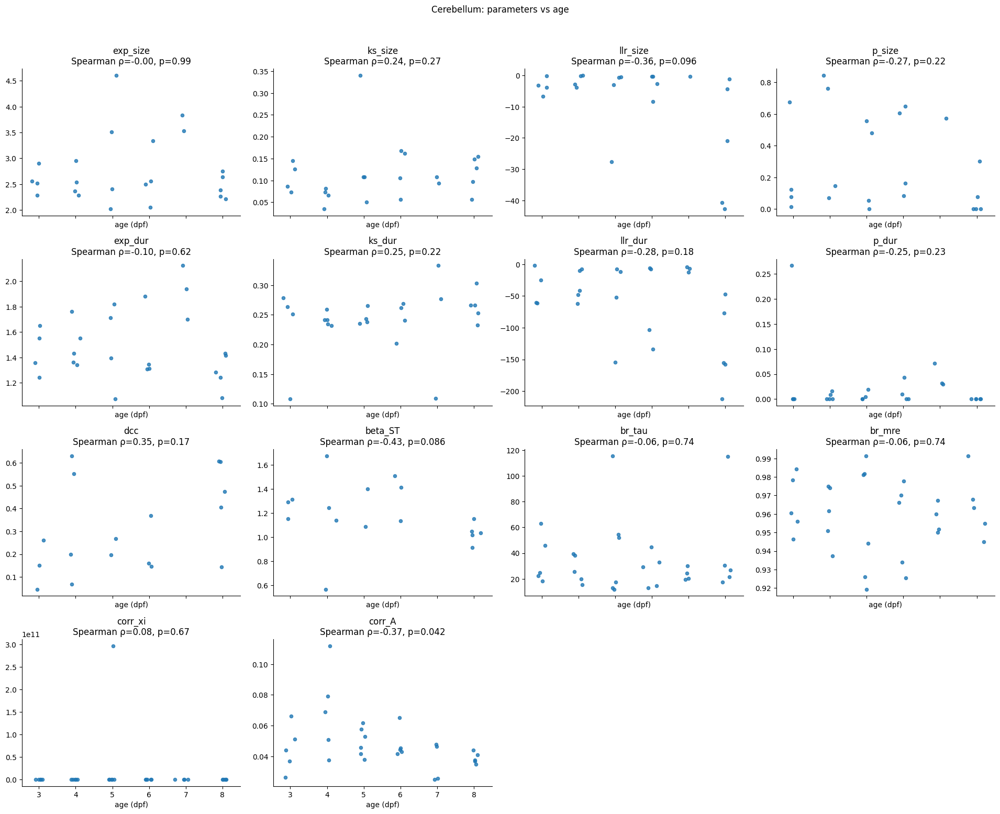


===== Cerebellum =====
parameter  spearman_rho  p_value  n
   corr_A     -0.373416 0.042096 30
  beta_ST     -0.428251 0.086346 17
 llr_size     -0.355698 0.095768 23
      dcc      0.349132 0.169583 17
  llr_dur     -0.279779 0.175573 25
   ks_dur      0.254416 0.219720 25
   p_size     -0.270000 0.224283 22
    p_dur     -0.251294 0.225625 25
  ks_size      0.238804 0.272480 23
  exp_dur     -0.103405 0.622805 25
  corr_xi      0.081452 0.668734 30
   br_mre     -0.063402 0.739252 30
   br_tau     -0.063402 0.739252 30
 exp_size     -0.002007 0.992749 23


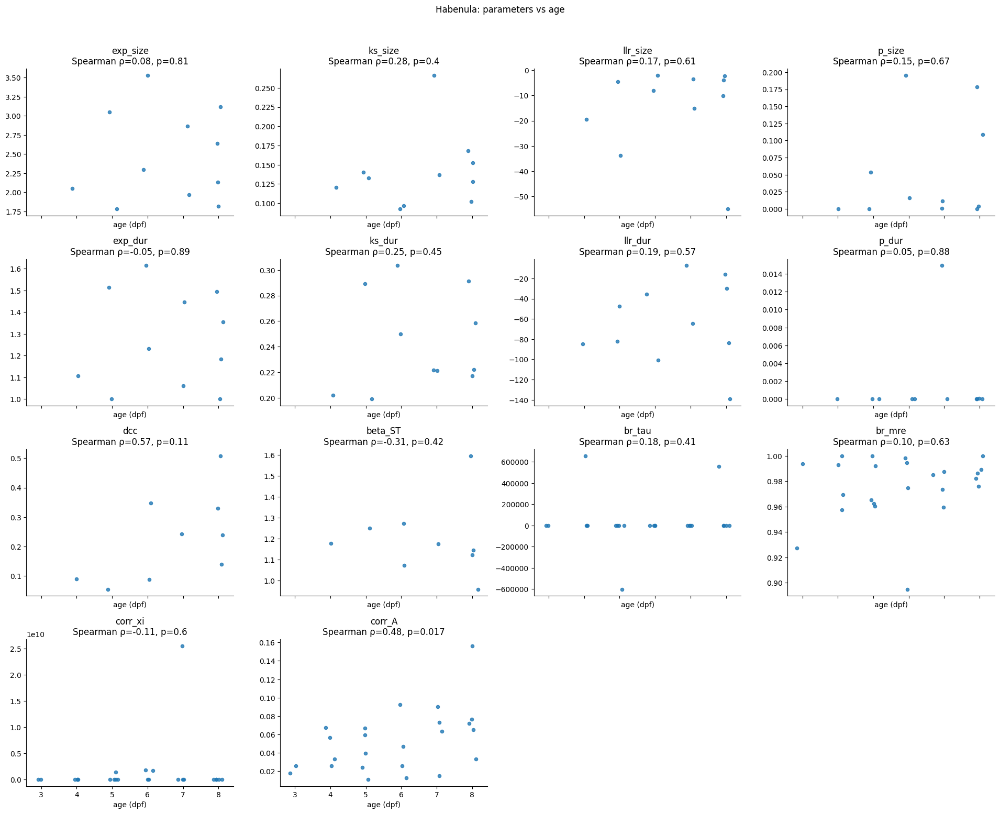


===== Habenula =====
parameter  spearman_rho  p_value  n
   corr_A      0.482285 0.016999 24
      dcc      0.568342 0.110342  9
  ks_size      0.281161 0.402291 11
   br_tau      0.176661 0.408928 24
  beta_ST     -0.306030 0.423190  9
   ks_dur      0.253045 0.452804 11
  llr_dur      0.192127 0.571426 11
  corr_xi     -0.111297 0.604636 24
 llr_size      0.173382 0.610171 11
   br_mre      0.102463 0.633770 24
   p_size      0.145266 0.669985 11
 exp_size      0.084348 0.805241 11
    p_dur      0.051546 0.880361 11
  exp_dur     -0.046860 0.891179 11


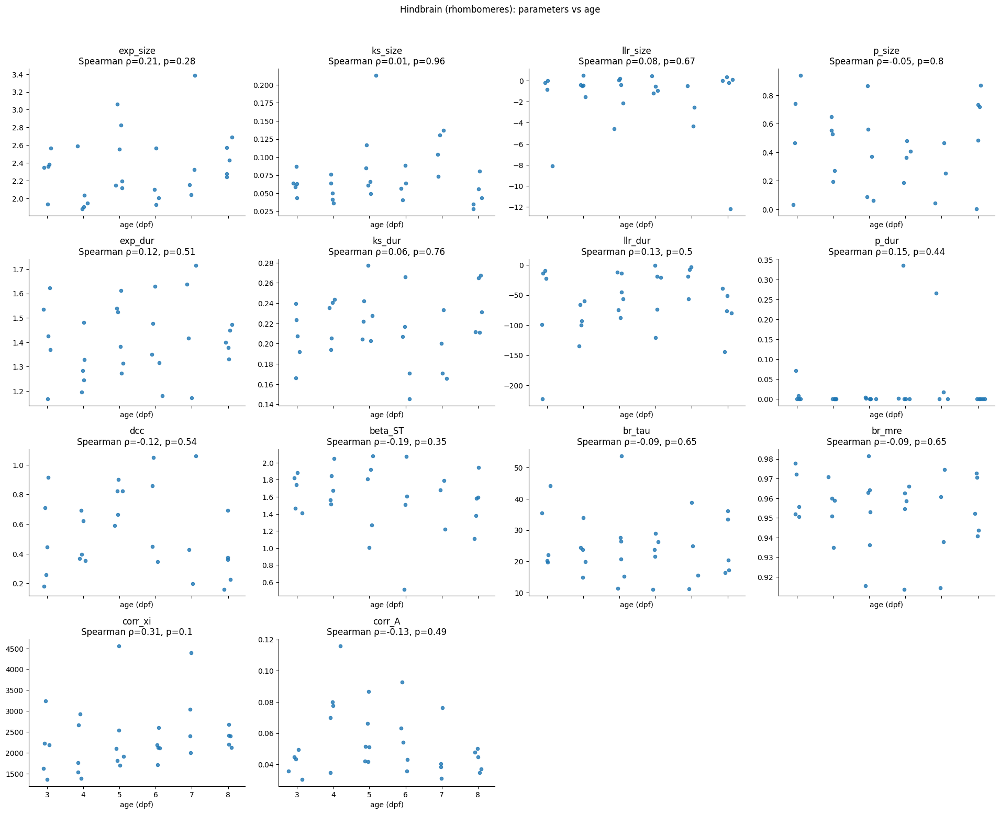


===== Hindbrain (rhombomeres) =====
parameter  spearman_rho  p_value  n
  corr_xi      0.305727 0.100385 30
 exp_size      0.206892 0.281550 29
  beta_ST     -0.187694 0.348498 27
    p_dur      0.148012 0.435059 30
   corr_A     -0.131316 0.489132 30
  llr_dur      0.129060 0.496692 30
  exp_dur      0.124547 0.511987 30
      dcc     -0.123581 0.539136 27
   br_mre     -0.087544 0.645510 30
   br_tau     -0.087544 0.645510 30
 llr_size      0.082248 0.671453 29
   ks_dur      0.057310 0.763561 30
   p_size     -0.052728 0.798091 26
  ks_size      0.009745 0.959986 29


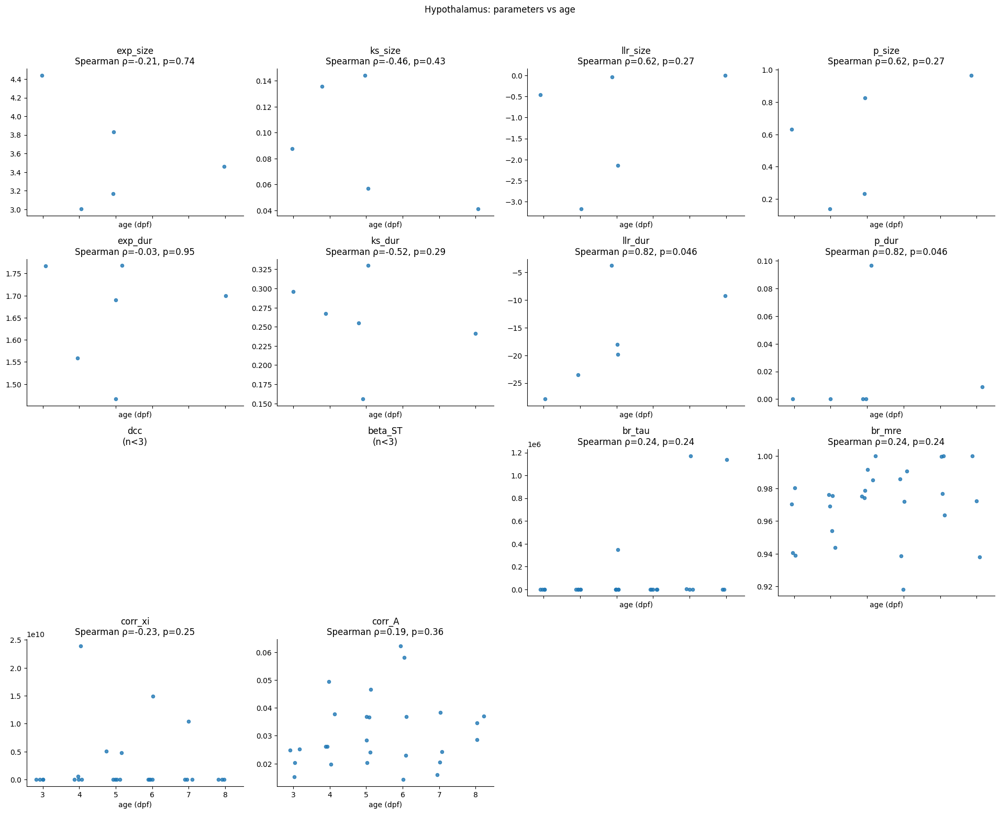


===== Hypothalamus =====
parameter  spearman_rho  p_value  n
  llr_dur      0.819689 0.045837  6
    p_dur      0.819689 0.045837  6
   br_mre      0.235887 0.236210 27
   br_tau      0.235887 0.236210 27
  corr_xi     -0.229688 0.249112 27
   p_size      0.615587 0.268998  5
 llr_size      0.615587 0.268998  5
   ks_dur     -0.516100 0.294584  6
   corr_A      0.185052 0.355447 27
  ks_size     -0.461690 0.433766  5
 exp_size     -0.205196 0.740582  5
  exp_dur     -0.030359 0.954476  6


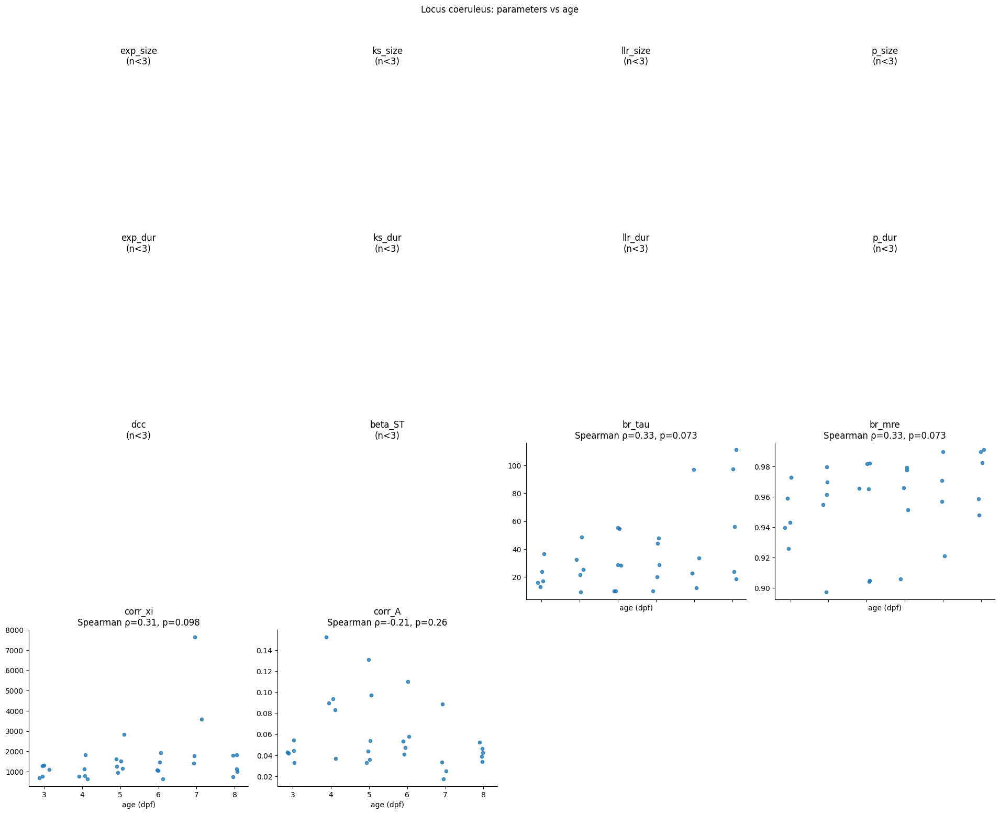


===== Locus coeruleus =====
parameter  spearman_rho  p_value  n
   br_tau      0.332351 0.072747 30
   br_mre      0.332351 0.072747 30
  corr_xi      0.307758 0.098033 30
   corr_A     -0.214347 0.255361 30


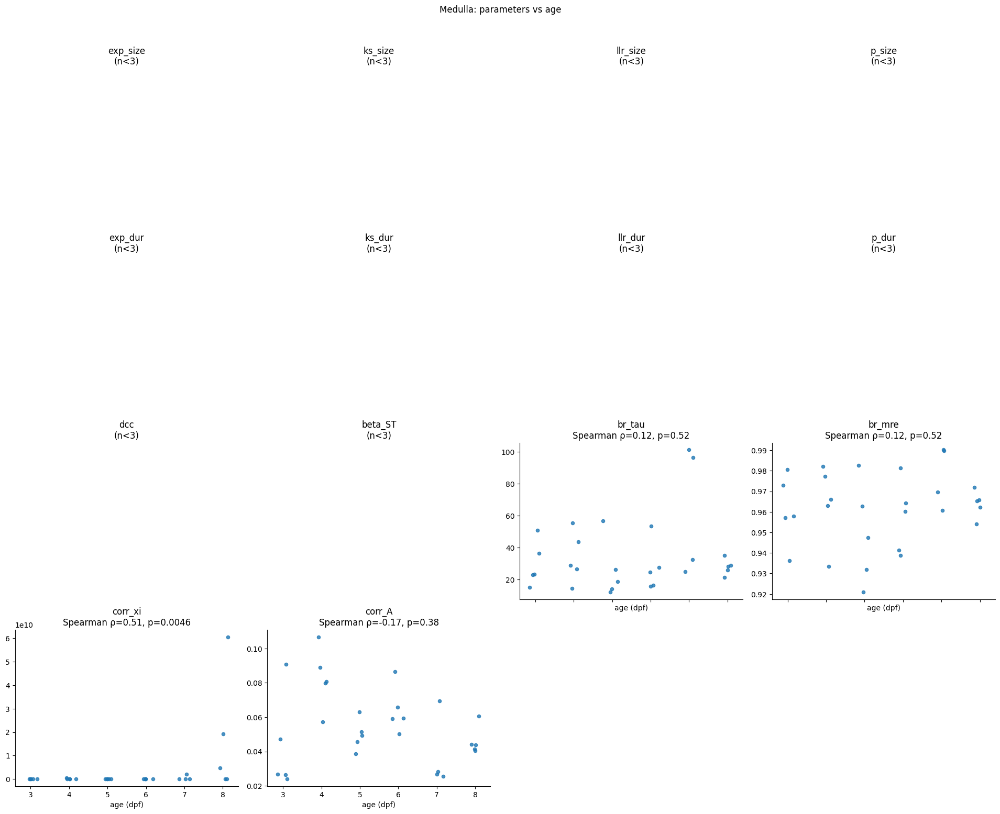


===== Medulla =====
parameter  spearman_rho  p_value  n
  corr_xi      0.510660 0.004646 29
   corr_A     -0.167556 0.384960 29
   br_mre      0.124107 0.521248 29
   br_tau      0.124107 0.521248 29


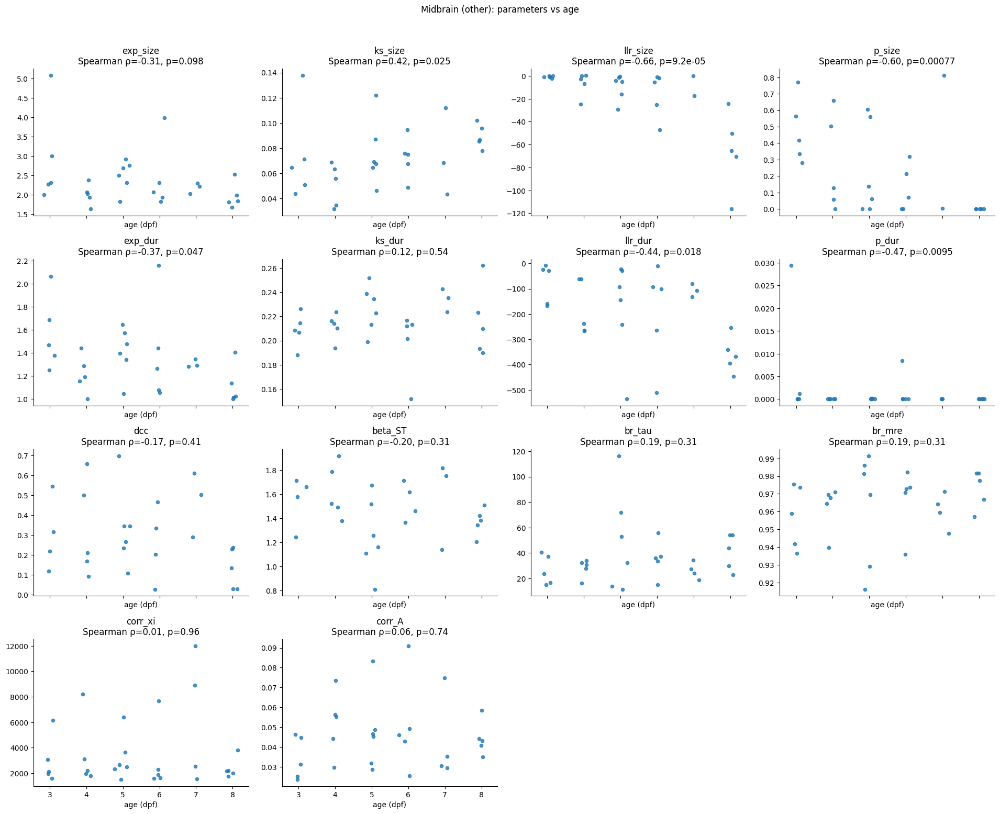


===== Midbrain (other) =====
parameter  spearman_rho  p_value  n
 llr_size     -0.661990 0.000092 29
   p_size     -0.598242 0.000772 28
    p_dur     -0.473493 0.009475 29
  llr_dur     -0.436994 0.017772 29
  ks_size      0.416244 0.024706 29
  exp_dur     -0.372245 0.046752 29
 exp_size     -0.313245 0.098002 29
  beta_ST     -0.204890 0.305273 27
   br_mre      0.189979 0.314636 30
   br_tau      0.189979 0.314636 30
      dcc     -0.166144 0.407536 27
   ks_dur      0.119498 0.536951 29
   corr_A      0.062048 0.744633 30
  corr_xi      0.009025 0.962248 30


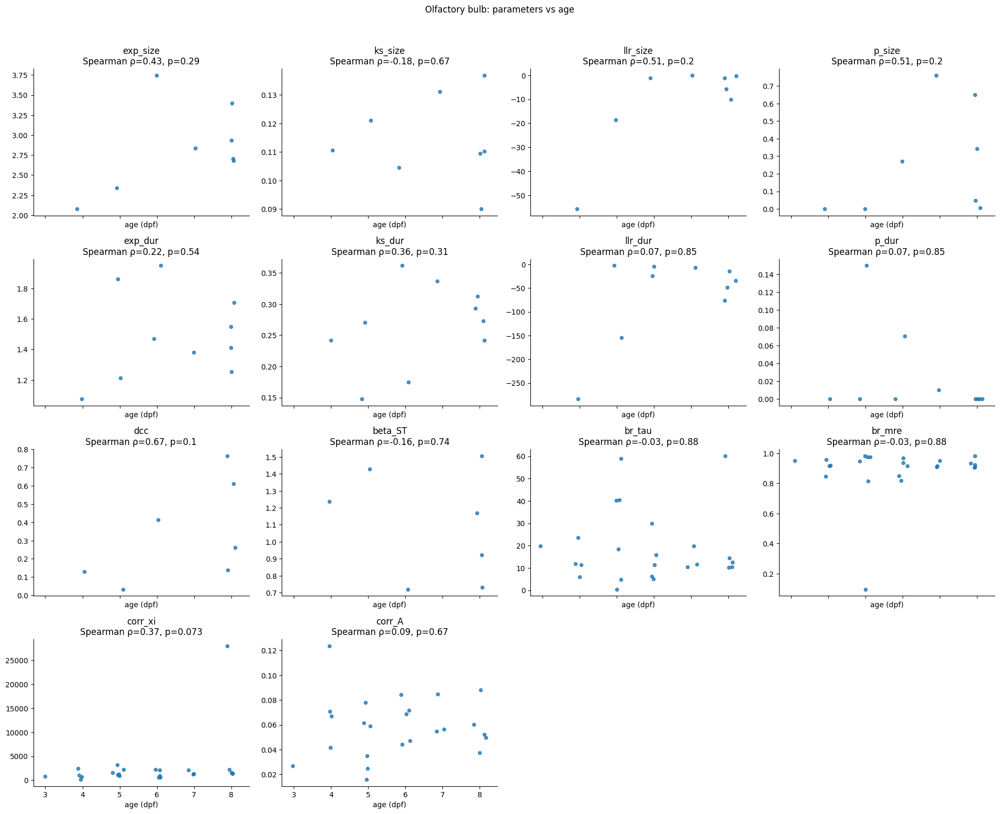


===== Olfactory bulb =====
parameter  spearman_rho  p_value  n
  corr_xi      0.372052 0.073410 24
      dcc      0.669894 0.099684  7
   p_size      0.507346 0.199359  8
 llr_size      0.507346 0.199359  8
 exp_size      0.431244 0.286073  8
   ks_dur      0.358746 0.308680 10
  exp_dur      0.220283 0.540841 10
   corr_A      0.092680 0.666664 24
  ks_size     -0.177571 0.673987  8
  beta_ST     -0.157622 0.735724  7
    p_dur      0.069232 0.849279 10
  llr_dur      0.069232 0.849279 10
   br_mre     -0.032372 0.880638 24
   br_tau     -0.032372 0.880638 24


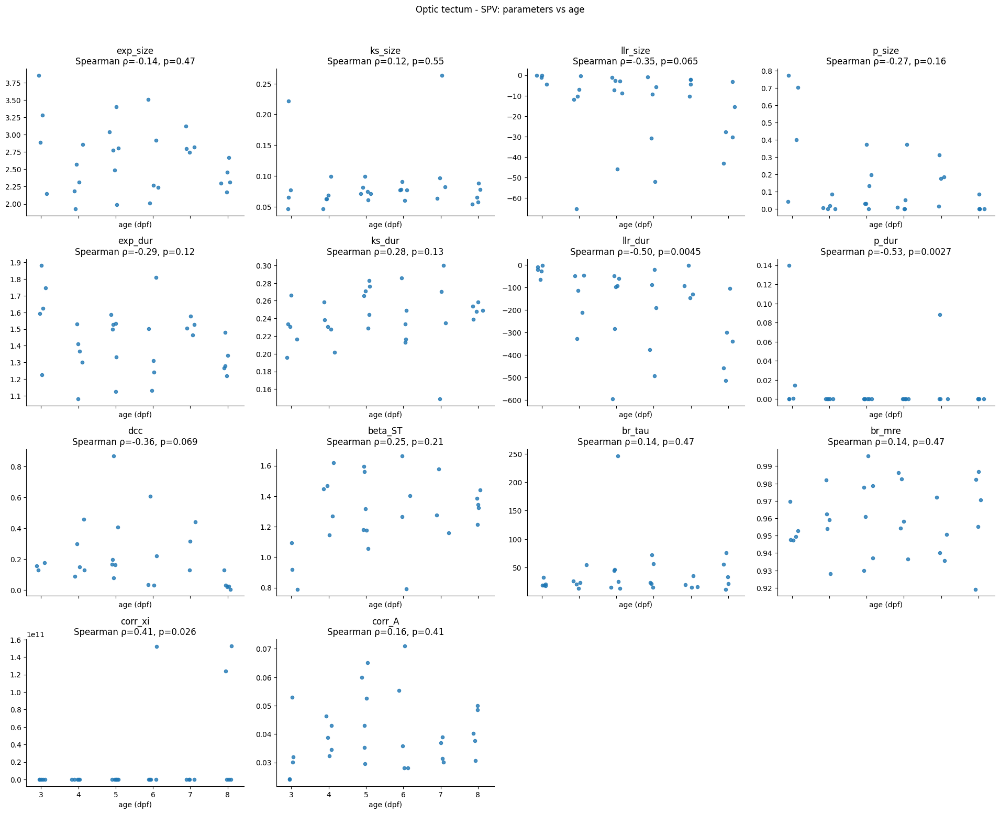


===== Optic tectum - SPV =====
parameter  spearman_rho  p_value  n
    p_dur     -0.527746 0.002725 30
  llr_dur     -0.504506 0.004469 30
  corr_xi      0.407034 0.025592 30
 llr_size     -0.347319 0.064886 29
      dcc     -0.362041 0.069143 26
  exp_dur     -0.287902 0.122886 30
   ks_dur      0.282036 0.131049 30
   p_size     -0.270109 0.156454 29
  beta_ST      0.252595 0.213150 26
   corr_A      0.155458 0.412043 30
 exp_size     -0.139927 0.469092 29
   br_mre      0.136054 0.473449 30
   br_tau      0.136054 0.473449 30
  ks_size      0.115440 0.550964 29


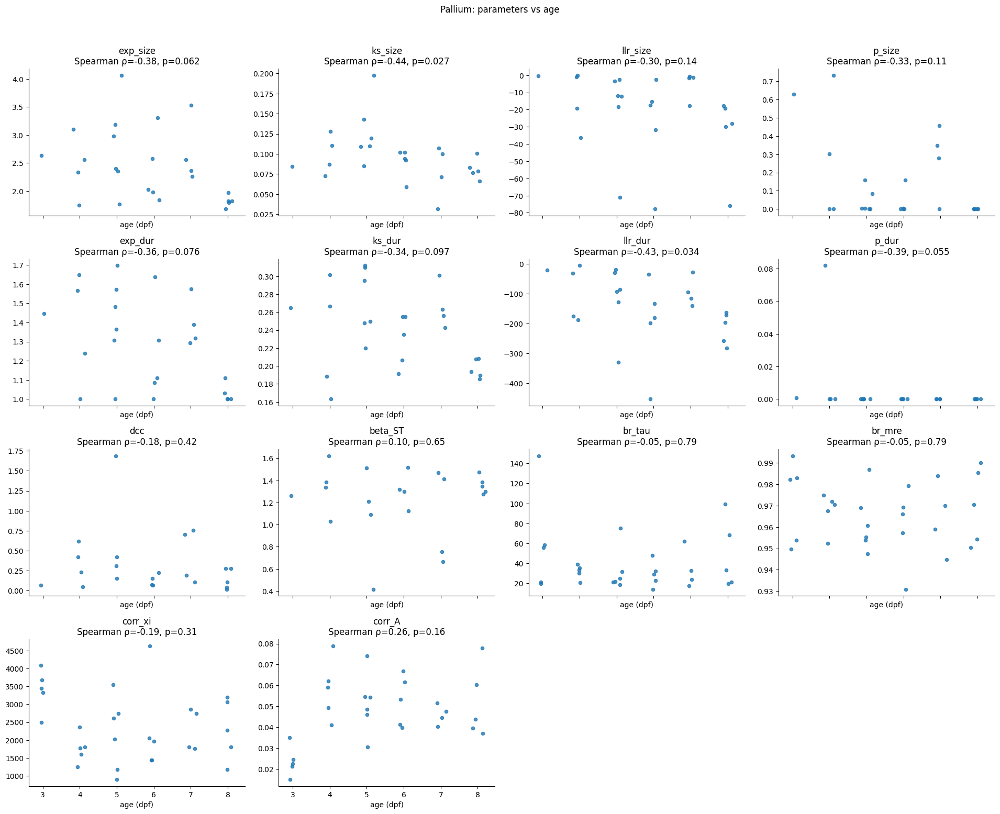


===== Pallium =====
parameter  spearman_rho  p_value  n
  ks_size     -0.442388 0.026802 25
  llr_dur     -0.426323 0.033579 25
    p_dur     -0.389098 0.054552 25
 exp_size     -0.378910 0.061776 25
  exp_dur     -0.361277 0.075998 25
   ks_dur     -0.338942 0.097433 25
   p_size     -0.331497 0.105495 25
 llr_size     -0.300934 0.143805 25
   corr_A      0.263534 0.159392 30
  corr_xi     -0.189979 0.314636 30
      dcc     -0.180383 0.421798 22
  beta_ST      0.103404 0.647004 22
   br_mre     -0.051443 0.787181 30
   br_tau     -0.051443 0.787181 30


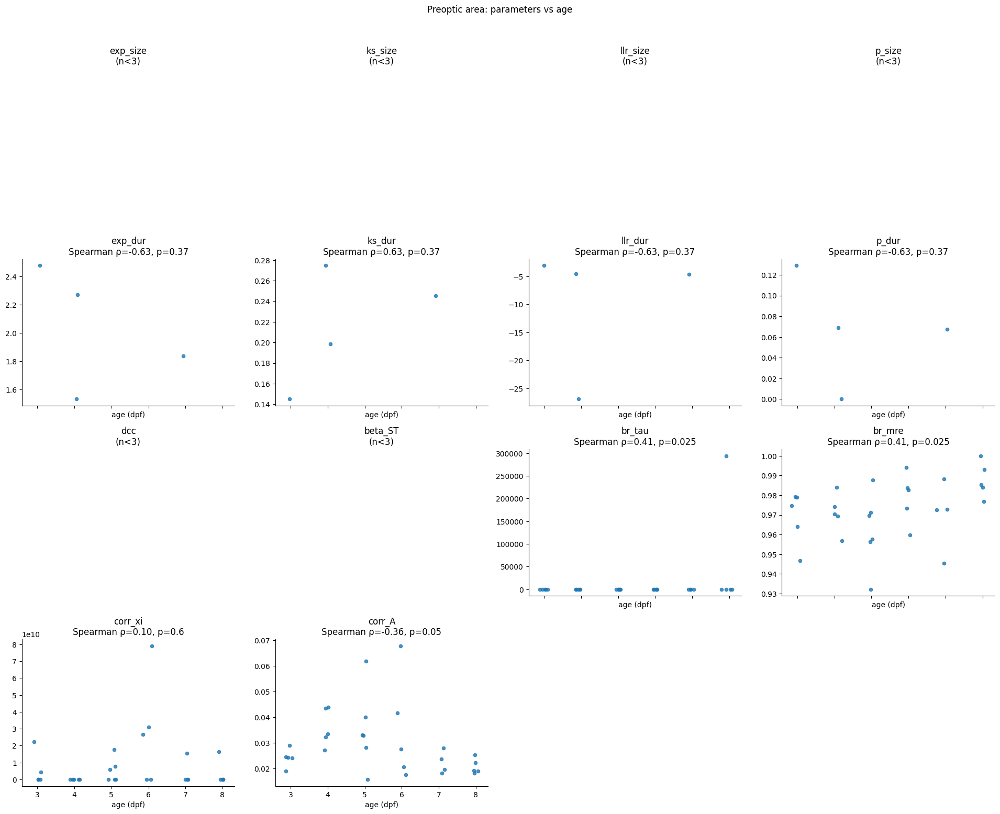


===== Preoptic area =====
parameter  spearman_rho  p_value  n
   br_mre      0.407937 0.025235 30
   br_tau      0.407937 0.025235 30
   corr_A     -0.360329 0.050463 30
  exp_dur     -0.632456 0.367544  4
    p_dur     -0.632456 0.367544  4
  llr_dur     -0.632456 0.367544  4
   ks_dur      0.632456 0.367544  4
  corr_xi      0.099502 0.600877 30


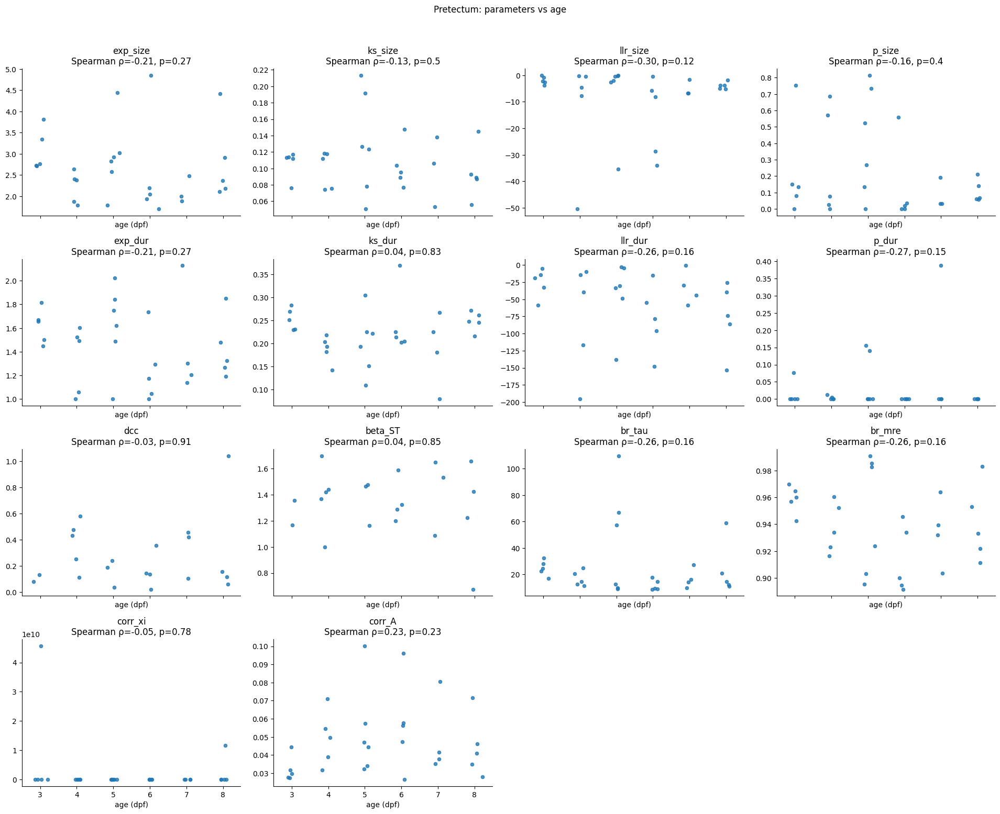


===== Pretectum =====
parameter  spearman_rho  p_value  n
 llr_size     -0.297996 0.116396 29
    p_dur     -0.270529 0.148203 30
   br_tau     -0.264437 0.157915 30
   br_mre     -0.264437 0.157915 30
  llr_dur     -0.261052 0.163503 30
   corr_A      0.226531 0.228680 30
 exp_size     -0.211247 0.271318 29
  exp_dur     -0.205999 0.274778 30
   p_size     -0.162248 0.400410 29
  ks_size     -0.130748 0.499015 29
  corr_xi     -0.053925 0.777164 30
   ks_dur      0.039711 0.834960 30
  beta_ST      0.042896 0.853527 21
      dcc     -0.025737 0.911823 21


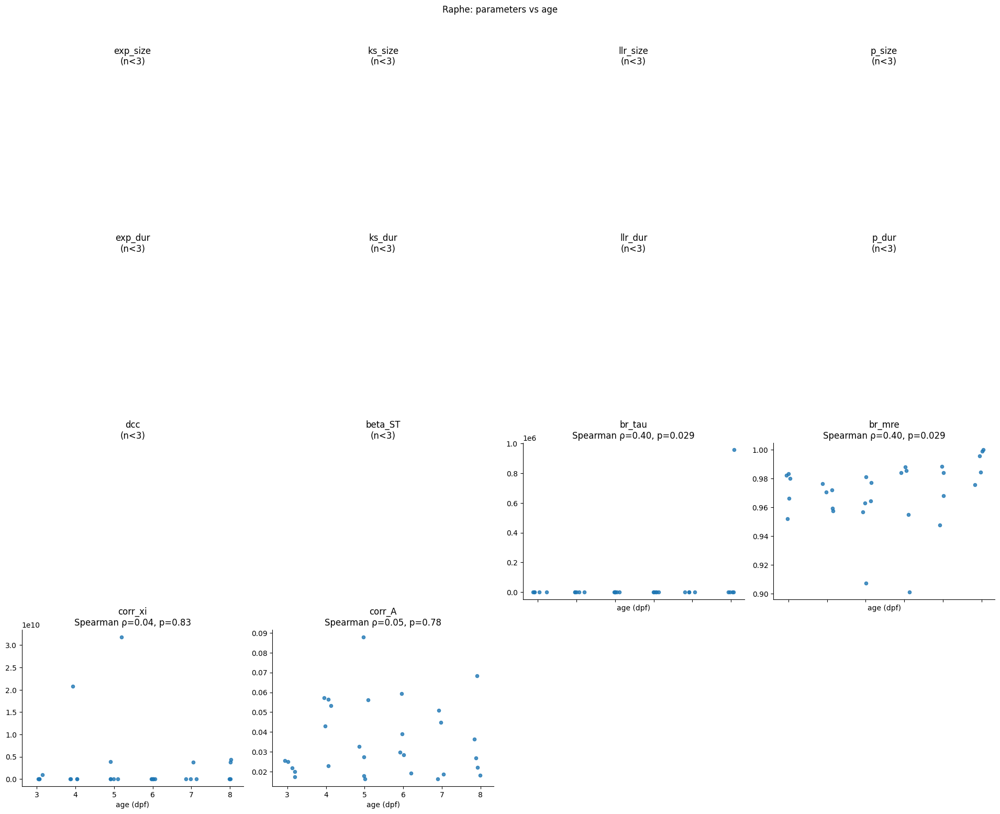


===== Raphe =====
parameter  spearman_rho  p_value  n
   br_tau      0.399589 0.028692 30
   br_mre      0.399589 0.028692 30
   corr_A      0.053474 0.778983 30
  corr_xi      0.040162 0.833111 30


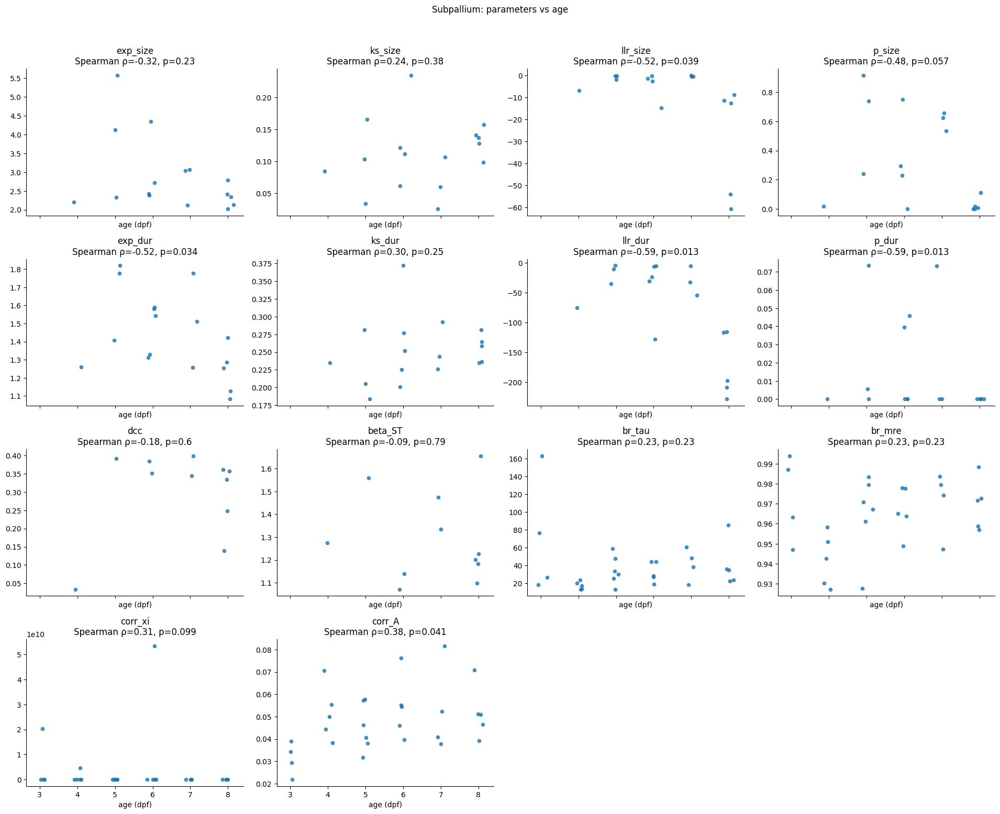


===== Subpallium =====
parameter  spearman_rho  p_value  n
  llr_dur     -0.586128 0.013411 17
    p_dur     -0.586128 0.013411 17
  exp_dur     -0.515704 0.034099 17
 llr_size     -0.520639 0.038669 16
   corr_A      0.381051 0.041407 29
   p_size     -0.484315 0.057293 16
  corr_xi      0.312587 0.098748 29
 exp_size     -0.316318 0.232638 16
   br_mre      0.228131 0.233945 29
   br_tau      0.228131 0.233945 29
   ks_dur      0.298117 0.245151 17
  ks_size      0.237617 0.375532 16
      dcc     -0.177279 0.602038 11
  beta_ST     -0.091035 0.790087 11


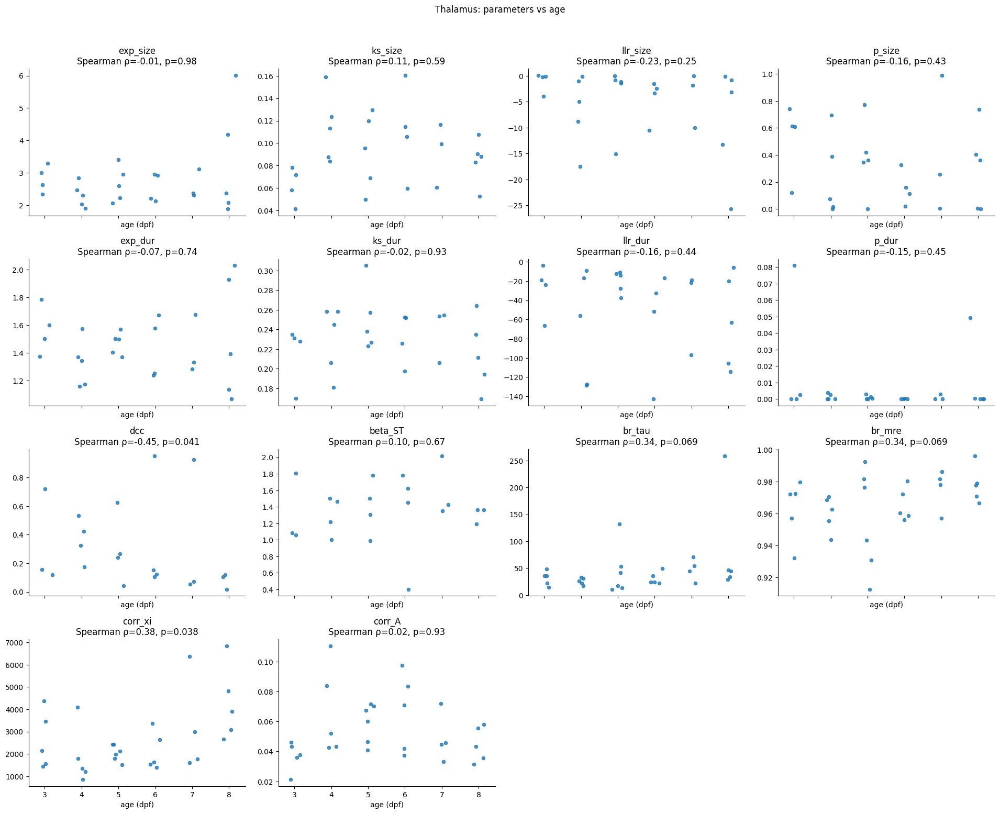


===== Thalamus =====
parameter  spearman_rho  p_value  n
  corr_xi      0.379733 0.038475 30
      dcc     -0.450339 0.040500 21
   br_tau      0.336638 0.068911 30
   br_mre      0.336638 0.068911 30
 llr_size     -0.231728 0.254678 26
   p_size     -0.163042 0.426140 26
  llr_dur     -0.157838 0.441249 26
    p_dur     -0.153676 0.453540 26
  ks_size      0.111354 0.588121 26
  beta_ST      0.098100 0.672261 21
  exp_dur     -0.068339 0.740107 26
   ks_dur     -0.018732 0.927630 26
   corr_A      0.015568 0.934923 30
 exp_size     -0.005897 0.977190 26


In [924]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

df = pd.read_csv(f"{fdata}/avalanche_stats_gran.csv")
df["age_dpf"] = pd.to_numeric(df["age_dpf"], errors="coerce")

pars = [
    "exp_size", "ks_size", "llr_size", "p_size",
    "exp_dur",  "ks_dur",  "llr_dur",  "p_dur",
    "dcc", "beta_ST",
    "br_tau", "br_mre",
    "corr_xi", "corr_A",
]

regs = [r for r in np.array([
    'Cerebellum', 'Habenula', 'Hindbrain (rhombomeres)', 'Hypothalamus',
    'Locus coeruleus', 'Medulla', 'Midbrain (other)', 'Olfactory bulb',
    'Optic tectum - SPV', 'Pallium', 'Preoptic area', 'Pretectum',
    'Raphe', 'Subpallium', 'Thalamus'
], dtype=object) if r in df["region"].unique()]

# jitter settings
rng = np.random.default_rng(0)
jitter_sd = 0.08

for reg in regs:
    dfr = df[df["region"] == reg].copy()

    ncols = 4
    nrows = int(np.ceil(len(pars) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), sharex=True)
    axes = np.array(axes).ravel()

    for ax, par in zip(axes, pars):
        d = dfr[["age_dpf", par]].dropna()
        if d.shape[0] < 3:
            ax.set_title(f"{par}\n(n<3)")
            ax.axis("off")
            continue

        x = d["age_dpf"].to_numpy()
        y = d[par].to_numpy()

        rho, pval = spearmanr(x, y, nan_policy="omit")

        xj = x + rng.normal(0.0, jitter_sd, size=x.shape)

        ax.scatter(xj, y, s=20, alpha=0.8)
        ax.set_title(f"{par}\nSpearman ρ={rho:.2f}, p={pval:.2g}")
        ax.set_xlabel("age (dpf)")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    for j in range(len(pars), len(axes)):
        axes[j].axis("off")

    fig.suptitle(f"{reg}: parameters vs age", y=1.02)
    plt.tight_layout()
    plt.show()

    rows = []
    for par in pars:
        d = dfr[["age_dpf", par]].dropna()
        if d.shape[0] < 3:
            continue
        rho, pval = spearmanr(d["age_dpf"].to_numpy(), d[par].to_numpy(), nan_policy="omit")
        rows.append((par, rho, pval, d.shape[0]))

    res = pd.DataFrame(rows, columns=["parameter", "spearman_rho", "p_value", "n"]).sort_values("p_value")
    print(f"\n===== {reg} =====")
    print(res.to_string(index=False))


In [918]:
'Cerebellum' in av_dic[fish].keys()

True

In [917]:
av_dic[fish].keys()

dict_keys([np.str_('Cerebellum'), np.str_('Hindbrain (rhombomeres)'), np.str_('Hypothalamus'), np.str_('Locus coeruleus'), np.str_('Medulla'), np.str_('Midbrain (other)'), np.str_('Optic tectum - SPV'), np.str_('Pallium'), np.str_('Preoptic area'), np.str_('Pretectum'), np.str_('Raphe'), np.str_('Thalamus')])

In [34]:
#load data
fdata = '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE'
trace_l = np.sort(glob.glob(f'{fdata}/*regtrace*'))
dff_l = np.sort(glob.glob(f'{fdata}/*regdelt*'))
bind_l = np.sort(glob.glob(f'{fdata}/*regbin*'))
coord_l = np.sort(glob.glob(f'{fdata}/*labcoord*'))
len(trace_l), len(dff_l), len(bind_l), len(coord_l)

(30, 30, 30, 30)

In [6]:
import glob
import os
import numpy as np
import pandas as pd

# -----------------------------
# Fast autocorr + tau_int
# -----------------------------
def autocorr_fft(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, float)
    x = x - np.nanmean(x)
    x = np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0)
    n = x.size
    if n < 2:
        return np.array([1.0])
    f = np.fft.rfft(x, n=2*n)
    ac = np.fft.irfft(f * np.conjugate(f))[:n]
    if ac[0] != 0:
        ac /= ac[0]
    return ac

def tau_int_ips(acf: np.ndarray, max_lag: int = 2000) -> float:
    """Initial positive sequence: sum until first negative ACF (or max_lag)."""
    if acf.size < 2:
        return 1.0
    L = min(max_lag, acf.size - 1)
    neg = np.where(acf[1:L+1] < 0)[0]
    if neg.size:
        L = int(neg[0] + 1)
    return float(1.0 + 2.0 * np.sum(acf[1:L+1]))

# -----------------------------
# Robust: convert (cells,time) or (time,cells) to (time,cells)
# -----------------------------
def ensure_time_first(X: np.ndarray) -> np.ndarray:
    X = np.asarray(X)
    if X.ndim == 1:
        return X[:, None]
    if X.shape[0] >= X.shape[1]:
        return X  # assume (T, N)
    return X.T  # (N, T) -> (T, N)

# -----------------------------
# Pick a fast population observable x(t)
# -----------------------------
def population_series_from_bind(bind: np.ndarray) -> np.ndarray:
    B = ensure_time_first(bind)
    # total active cells per frame (works if bind is 0/1; if not, still meaningful)
    return np.nansum(B, axis=1).astype(float)

def population_series_from_dff(dff: np.ndarray) -> np.ndarray:
    D = ensure_time_first(dff)
    # mean activity across cells per frame
    return np.nanmean(D, axis=1).astype(float)

# -----------------------------
# Critical slowing metrics for one time series
# -----------------------------
def slowing_metrics(x: np.ndarray, max_lag: int = 2000) -> dict:
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 10:
        return {"T": int(x.size), "var": np.nan, "acf1": np.nan, "tau_int": np.nan}
    acf = autocorr_fft(x)
    return {
        "T": int(x.size),
        "var": float(np.var(x, ddof=0)),
        "acf1": float(acf[1]) if acf.size > 1 else np.nan,
        "tau_int": float(tau_int_ips(acf, max_lag=max_lag)),
    }

# -----------------------------
# Main: loop files, compute per animal, save DataFrame
# -----------------------------
fdata = "/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE"

trace_l = np.sort(glob.glob(f"{fdata}/*regtrace*"))
dff_l   = np.sort(glob.glob(f"{fdata}/*regdelt*"))
bind_l  = np.sort(glob.glob(f"{fdata}/*regbin*"))
coord_l = np.sort(glob.glob(f"{fdata}/*labcoord*"))

reg_list = ["Telencephalon"]  # edit

rows = []
max_lag = 2000  # in frames; set lower for speed (e.g., 800)

for i,k in tqdm(enumerate(range(len(dff_l))), total = len(dff_l)):
    # Load
    trace = np.load(trace_l[i]) if i < len(trace_l) else None
    dff   = np.load(dff_l[i])
    bind  = np.load(bind_l[i])
    coord = np.load(coord_l[i])

    # Your naming helpers (assumed available in your env)
    name = adfn.save_name(dff_l[i])  # e.g. animal/session id
    # crude age parse from your pattern; replace with your reliable parser if you have one
    age = None
    try:
        age = os.path.basename(dff_l[i]).split("dpf")[0][-1]
    except Exception:
        age = None

    for reg in reg_list:
        sub_trace, sub_dff, sub_bind, sub_coord = tfn.select_region(trace, dff, bind, coord, reg)

        # Choose ONE observable (fast). I’d start with bind-based population activity.
        x = population_series_from_bind(sub_bind)
        m = slowing_metrics(x, max_lag=max_lag)

        rows.append({
            "name": name,
            "age": age,
            "region": reg,
            "n_cells": int(ensure_time_first(sub_bind).shape[1]),
            "observable": "A_bind_sum",
            **m
        })

        # Optional: also compute from dff mean (comment out if you want minimal)
        x2 = population_series_from_dff(sub_dff)
        m2 = slowing_metrics(x2, max_lag=max_lag)
        rows.append({
            "name": name,
            "age": age,
            "region": reg,
            "n_cells": int(ensure_time_first(sub_dff).shape[1]),
            "observable": "mean_dff",
            **m2
        })

df = pd.DataFrame(rows).sort_values(["name", "region", "observable"]).reset_index(drop=True)

# Save per animal/session
#out_csv = os.path.join(fdata, "critical_slowing_per_animal.csv")
#df.to_csv(out_csv, index=False)
# print(df.head())
# print("Saved:", out_csv)


100%|█████████████████████████████████████| 30/30 [12:39<00:00, 25.30s/it]


In [7]:
df

,name,age,region,n_cells,observable,T,var,acf1,tau_int
0,/Users/k2585057/Library/CloudStorage/Dropbox/P...,4,Telencephalon,1086,A_bind_sum,4914,76.628652,0.515407,109.387041
1,/Users/k2585057/Library/CloudStorage/Dropbox/P...,4,Telencephalon,1086,mean_dff,4914,0.943870,0.956032,1259.003413
2,/Users/k2585057/Library/CloudStorage/Dropbox/P...,5,Telencephalon,961,A_bind_sum,4914,89.743690,0.523742,102.599410
3,/Users/k2585057/Library/CloudStorage/Dropbox/P...,5,Telencephalon,961,mean_dff,4914,0.207488,0.869388,1019.138575
4,/Users/k2585057/Library/CloudStorage/Dropbox/P...,6,Telencephalon,1850,A_bind_sum,4914,729.972032,0.804217,681.725780
5,/Users/k2585057/Library/CloudStorage/Dropbox/P...,6,Telencephalon,1850,mean_dff,4914,0.739347,0.977000,1440.075242
6,/Users/k2585057/Library/CloudStorage/Dropbox/P...,7,Telencephalon,1454,A_bind_sum,4914,165.277212,0.636268,116.000251
7,/Users/k2585057/Library/CloudStorage/Dropbox/P...,7,Telencephalon,1454,mean_dff,4914,1.254712,0.964908,843.777854
8,/Users/k2585057/Library/CloudStorage/Dropbox/P...,8,Telencephalon,1503,A_bind_sum,4914,287.413175,0.667397,68.810505
9,/Users/k2585057/Library/CloudStorage/Dropbox/P...,8,Telencephalon,1503,mean_dff,4914,0.539539,0.931074,365.072961


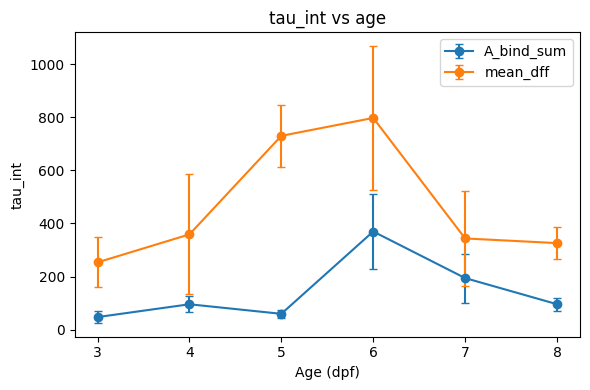

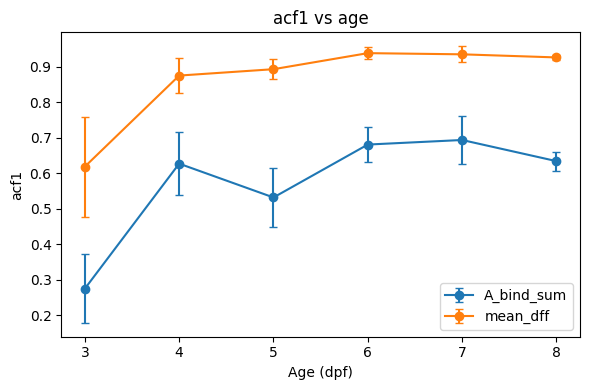

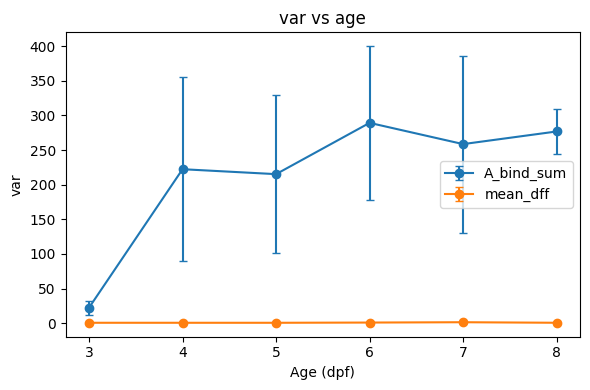

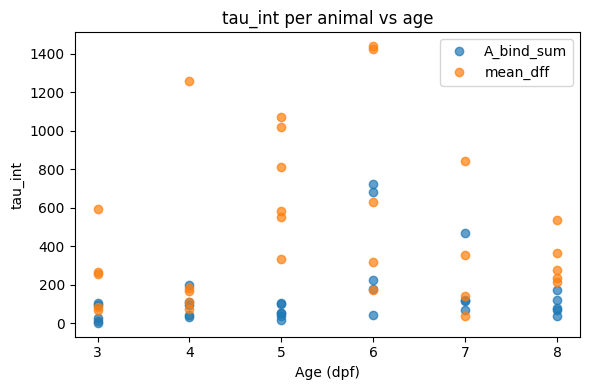

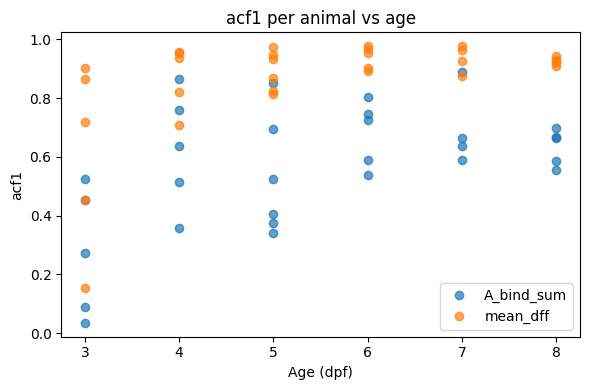

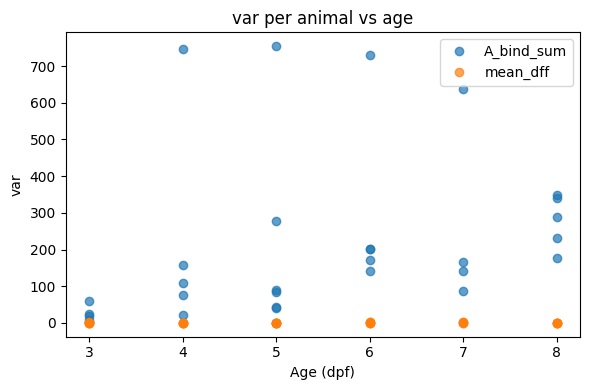

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# df = your dataframe from earlier

# clean + make age numeric
df2 = df.copy()
df2["age"] = pd.to_numeric(df2["age"], errors="coerce")
df2 = df2.dropna(subset=["age"])

metrics = ["tau_int", "acf1", "var"]

for m in metrics:
    # per-age summary (mean ± SEM) separately for each observable
    g = (df2.groupby(["age", "observable"], as_index=False)
            .agg(mean=(m, "mean"),
                 sem =(m, lambda x: x.std(ddof=1) / np.sqrt(max(len(x), 1)))))

    plt.figure(figsize=(6,4))
    for obs, sub in g.groupby("observable"):
        sub = sub.sort_values("age")
        plt.errorbar(sub["age"], sub["mean"], yerr=sub["sem"], marker="o", capsize=3, label=obs)

    plt.xlabel("Age (dpf)")
    plt.ylabel(m)
    plt.title(f"{m} vs age")
    plt.legend()
    plt.tight_layout()
    plt.show()

# (optional) if you want each animal as a point (no averaging):
for m in metrics:
    plt.figure(figsize=(6,4))
    for obs, sub in df2.groupby("observable"):
        plt.plot(sub["age"], sub[m], marker="o", linestyle="none", label=obs, alpha=0.7)
    plt.xlabel("Age (dpf)")
    plt.ylabel(m)
    plt.title(f"{m} per animal vs age")
    plt.legend()
    plt.tight_layout()
    plt.show()

Spearman(age, tau_int): rho=0.153, p=0.42, n=30
Spearman(age, acf1): rho=0.439, p=0.0153, n=30
Spearman(age, var): rho=0.278, p=0.137, n=30


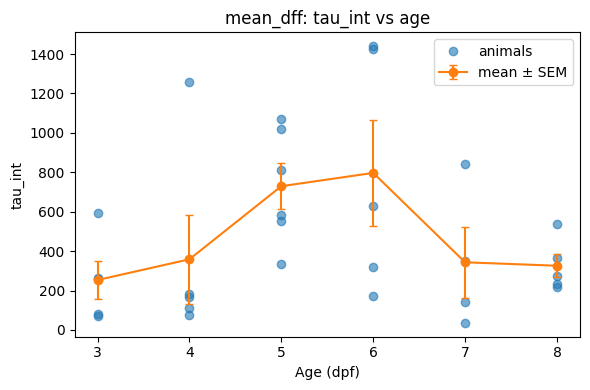

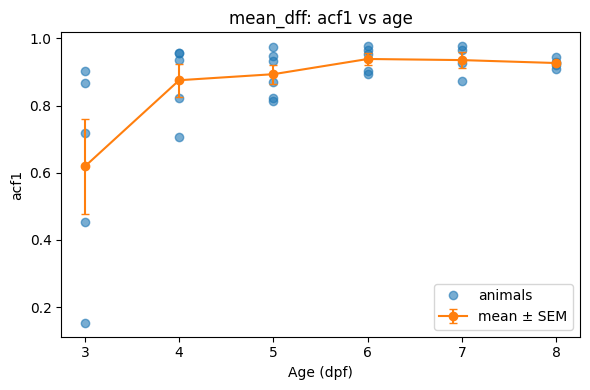

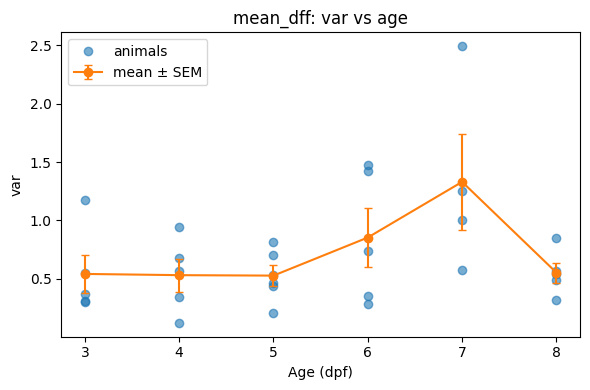

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# df = your dataframe

# keep only mean_dff + clean age
d = df[df["observable"] == "mean_dff"].copy()
d["age"] = pd.to_numeric(d["age"], errors="coerce")
d = d.dropna(subset=["age"])

metrics = ["tau_int", "acf1", "var"]

# --- Spearman correlations (age vs metric) ---
for m in metrics:
    x = d["age"].to_numpy()
    y = d[m].to_numpy()
    ok = np.isfinite(x) & np.isfinite(y)
    rho, p = spearmanr(x[ok], y[ok])
    print(f"Spearman(age, {m}): rho={rho:.3f}, p={p:.3g}, n={ok.sum()}")

# --- plots (points + per-age mean±SEM) ---
for m in metrics:
    plt.figure(figsize=(6,4))

    # raw points
    plt.plot(d["age"], d[m], "o", alpha=0.6, label="animals")

    # per-age summary
    g = (d.groupby("age", as_index=False)[m]
           .agg(mean="mean",
                sem=lambda x: x.std(ddof=1)/np.sqrt(max(len(x), 1))))
    g = g.sort_values("age")
    plt.errorbar(g["age"], g["mean"], yerr=g["sem"], marker="o", capsize=3, label="mean ± SEM")

    plt.xlabel("Age (dpf)")
    plt.ylabel(m)
    plt.title(f"mean_dff: {m} vs age")
    plt.legend()
    plt.tight_layout()
    plt.show()


# Avalanche stuff

In [37]:
av_l[:5]

array(['/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-4dpf_BLNGR_run-01_Telencephalon_criticality.npy',
       '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-5dpf_BLNGR_run-01_Telencephalon_criticality.npy',
       '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-6dpf_BLNGR_run-01_Telencephalon_criticality.npy',
       '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-7dpf_BLNGR_run-01_Telencephalon_criticality.npy',
       '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE/BLNDEV-WILDTYPE-01_2photon_sess-01-8dpf_BLNGR_run-01_Telencephalon_criticality.npy'],
      dtype='<U164')

In [36]:
#load data
fdata = '/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE'
av_l = np.sort(glob.glob(f'{fdata}/*Tel*crit*'))
data = np.load(av_l[0], allow_pickle=True).item()


In [45]:
np.load(av_l[0], allow_pickle=True).item()

{'av': array([[11,  8, 34, ...,  5,  3,  4],
        [ 1,  2,  2, ...,  2,  1,  1]]),
 'llr_s': np.float64(4018.4792539784103),
 'llr_d': np.float64(7817.898266161574),
 'exp_s': np.float64(2.4882678766695077),
 'exp_d': np.float64(3.147177827581594),
 'dcc': np.float64(0.25192691931942757),
 'br': np.float64(0.9905030350648556),
 'corrdis': (array([  0.        ,   3.29215413,   6.58430827,   9.8764624 ,
          13.16861654,  16.46077067,  19.75292481,  23.04507894,
          26.33723308,  29.62938721,  32.92154135,  36.21369548,
          39.50584962,  42.79800375,  46.09015789,  49.38231202,
          52.67446616,  55.96662029,  59.25877443,  62.55092856,
          65.8430827 ,  69.13523683,  72.42739097,  75.7195451 ,
          79.01169924,  82.30385337,  85.59600751,  88.88816164,
          92.18031578,  95.47246991,  98.76462405, 102.05677818,
         105.34893232, 108.64108645, 111.93324059, 115.22539472,
         118.51754886, 121.80970299, 125.10185713, 128.39401126,
       

In [38]:
! pip install powerlaw

  Using cached powerlaw-1.5-py3-none-any.whl.metadata (9.3 kB)
  Using cached mpmath-1.3.0-py3-none-any.whl.metadata (8.6 kB)
Using cached powerlaw-1.5-py3-none-any.whl (24 kB)
Using cached mpmath-1.3.0-py3-none-any.whl (536 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [powerlaw]


In [57]:
import os, re, glob
import numpy as np
import pandas as pd
import powerlaw
from tqdm import tqdm

# -----------------------
# parse helpers
# -----------------------
def parse_age_dpf(path):
    m = re.search(r"(\d+)\s*dpf", path)
    return int(m.group(1)) if m else np.nan

def parse_animal_id(path):
    base = os.path.basename(path)
    m = re.search(r"(BLNDEV-WILDTYPE-\d+)", base)
    return m.group(1) if m else base.split("_")[0]

# -----------------------
# powerlaw exponent with FIXED xmin, NO xmax
# -----------------------
def pl_alpha_fixedxmin(x, xmin, discrete=True):
    x = np.asarray(x).ravel()
    x = x[np.isfinite(x) & (x > 0)]
    # IMPORTANT: keep integers for discrete fit
    if discrete:
        x = x.astype(int)
    x = x[x >= xmin]
    if x.size < 50:
        return np.nan
    fit = powerlaw.Fit(x, discrete=discrete, xmin=xmin, verbose=False)
    return float(fit.power_law.alpha)

# -----------------------
# DCC exactly like yours, but exponents are provided (from powerlaw)
# -----------------------
def dcc_like_yours_from_exps(av_size, av_dur, size_exp, dur_exp, min_size=3, dur_scale=2.73):
    S = np.asarray(av_size).ravel().astype(float)
    T = np.asarray(av_dur).ravel().astype(float)
    m = np.isfinite(S) & np.isfinite(T) & (S > 0) & (T > 0)
    S, T = S[m], T[m]

    # match your avalanche() cut
    keep = S >= min_size
    S, T = S[keep], T[keep]
    if S.size < 50:
        return np.nan, np.nan

    # match your duration scaling
    T = T / dur_scale

    # mean size per unique duration
    Tu = np.unique(T)
    size_vec = np.array([np.mean(S[T == t]) for t in Tu], float)
    xaxis = Tu.astype(float)
    yaxis = size_vec.astype(float)

    # match your "drop last point" behavior
    if xaxis.size < 5:
        return np.nan, np.nan
    xfit = xaxis[:-1]
    yfit = yaxis[:-1]

    ok = (xfit > 0) & (yfit > 0) & np.isfinite(xfit) & np.isfinite(yfit)
    xfit, yfit = xfit[ok], yfit[ok]
    if xfit.size < 5:
        return np.nan, np.nan

    fit_beta, _ = np.polyfit(np.log10(xfit), np.log10(yfit), 1)

    if not (np.isfinite(size_exp) and np.isfinite(dur_exp)) or (size_exp == 1.0):
        return np.nan, float(fit_beta)

    pred_beta = (dur_exp - 1.0) / (size_exp - 1.0)
    dcc = float(np.abs(fit_beta - pred_beta))
    return dcc, float(fit_beta)

# -----------------------
# main loop: powerlaw exps + your DCC recipe (NO xmax)
# -----------------------
fdata = "/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE"
av_l  = np.sort(glob.glob(f"{fdata}/*Tel*crit*"))

rows = []
for _, fp in tqdm(enumerate(av_l), total=len(av_l)):
    d = np.load(fp, allow_pickle=True).item()
    sizes = np.asarray(d["av"][0]).ravel()
    durs  = np.asarray(d["av"][1]).ravel()

    # match your xmin choices
    xmin_size = int(np.nanmin(sizes[np.isfinite(sizes) & (sizes > 0)]))  # often 3
    xmin_dur  = 2

    # exponents via powerlaw (discrete, fixed xmin, no xmax)
    tau_size  = pl_alpha_fixedxmin(sizes, xmin=xmin_size, discrete=True)
    alpha_dur = pl_alpha_fixedxmin(durs,  xmin=xmin_dur,  discrete=True)

    # DCC via your recipe, using these exponents
    dcc, fit_beta = dcc_like_yours_from_exps(
        sizes, durs, tau_size, alpha_dur, min_size=3, dur_scale=2.73
    )

    rows.append({
        "file": fp,
        "animal": parse_animal_id(fp),
        "age_dpf": parse_age_dpf(fp),
        "region": "Telencephalon" if "Telencephalon" in fp else np.nan,
        "n_avalanches": int(min(len(sizes), len(durs))),

        "xmin_size": xmin_size,
        "xmin_dur": xmin_dur,
        "tau_size": tau_size,
        "alpha_dur": alpha_dur,
        "fit_beta": fit_beta,
        "dcc": dcc,
    })

df_out = pd.DataFrame(rows).sort_values(["age_dpf", "animal"]).reset_index(drop=True)

out_csv = os.path.join(fdata, "dcc_powerlaw_fixedxmin_NOxmax.csv")
df_out.to_csv(out_csv, index=False)
print(df_out.head())
print("Saved:", out_csv)


100%|████████████████████████████████████| 30/30 [00:00<00:00, 160.37it/s]

                                                file              animal  \
0  /Users/k2585057/Library/CloudStorage/Dropbox/P...  BLNDEV-WILDTYPE-02   
1  /Users/k2585057/Library/CloudStorage/Dropbox/P...  BLNDEV-WILDTYPE-05   
2  /Users/k2585057/Library/CloudStorage/Dropbox/P...  BLNDEV-WILDTYPE-06   
3  /Users/k2585057/Library/CloudStorage/Dropbox/P...  BLNDEV-WILDTYPE-07   
4  /Users/k2585057/Library/CloudStorage/Dropbox/P...  BLNDEV-WILDTYPE-08   

   age_dpf         region  n_avalanches  xmin_size  xmin_dur  tau_size  \
0        3  Telencephalon           145          3         2  4.515626   
1        3  Telencephalon          5650          3         2  2.419186   
2        3  Telencephalon         12005          3         2  2.348726   
3        3  Telencephalon          3113          3         2  3.451305   
4        3  Telencephalon          2978          3         2  2.590660   

   alpha_dur  fit_beta       dcc  
0   4.271332       NaN       NaN  
1   2.774963  1.204030  0.04

In [42]:
df_av

,file,animal,age_dpf,region,n_avalanches,tau_size,xmin_size,ksD_size,sigma_size,llr_size_pl_vs_lognorm,...,ksD_dur,sigma_dur,llr_dur_pl_vs_lognorm,p_dur_pl_vs_lognorm,llr_dur_pl_vs_exp,p_dur_pl_vs_exp,pl_preferred_dur_lognorm,pl_preferred_dur_exp,gamma_meanS_vs_T,dcc
0,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-02,3,Telencephalon,145,4.515626,3.0,0.079896,0.291957,-4.307068,...,0.047748,0.372803,-10.621563,6.864768e-04,-8.431363,4.805367e-02,False,False,NaN,NaN
1,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-05,3,Telencephalon,5650,2.419186,3.0,0.020403,0.018881,-67.672032,...,0.034099,0.171084,-6.002619,2.005680e-02,-5.647608,1.251269e-01,False,False,1.395884,1.127063
2,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-06,3,Telencephalon,12005,2.348726,3.0,0.017005,0.012310,-92.531337,...,0.015885,0.140633,-0.433144,6.571183e-01,23.425322,7.171941e-02,False,False,1.371589,1.024384
3,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-07,3,Telencephalon,3113,4.510443,6.0,0.021193,0.179845,-0.491401,...,0.045169,1.756453,-1.984955,6.925733e-02,-0.496527,5.706869e-05,False,False,NaN,NaN
4,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-08,3,Telencephalon,2978,2.590660,3.0,0.027958,0.029148,-55.663368,...,0.033034,0.188060,-7.790570,1.762327e-03,-8.113038,6.479999e-04,False,False,NaN,NaN
5,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-01,4,Telencephalon,16262,3.555044,19.0,0.017132,0.111618,-0.975844,...,0.015724,0.151500,-1.962072,1.519614e-01,5.139895,2.866732e-01,False,False,1.336636,0.032280
6,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-02,4,Telencephalon,6977,3.458370,8.0,0.023271,0.071933,-8.484674,...,0.042243,0.076568,-33.583234,1.581507e-11,-34.489094,6.043301e-09,False,False,1.331009,0.173161
7,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-03,4,Telencephalon,10403,2.850909,5.0,0.015489,0.029409,-0.308419,...,0.019393,0.253068,-0.124446,7.947864e-01,8.771118,7.921951e-02,False,False,NaN,NaN
8,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-04,4,Telencephalon,20142,2.190065,10.0,0.014131,0.016025,-8.710547,...,0.015474,0.039189,-11.637464,8.008384e-03,190.335240,3.919671e-05,False,True,1.776803,0.002254
9,/Users/k2585057/Library/CloudStorage/Dropbox/P...,BLNDEV-WILDTYPE-05,4,Telencephalon,35365,2.311922,6.0,0.008279,0.010892,-0.337109,...,0.007889,0.059352,-0.322416,6.146667e-01,143.542642,1.478823e-09,False,True,2.086941,0.259883


DCC: Spearman rho=-0.026, p=0.894, n=29


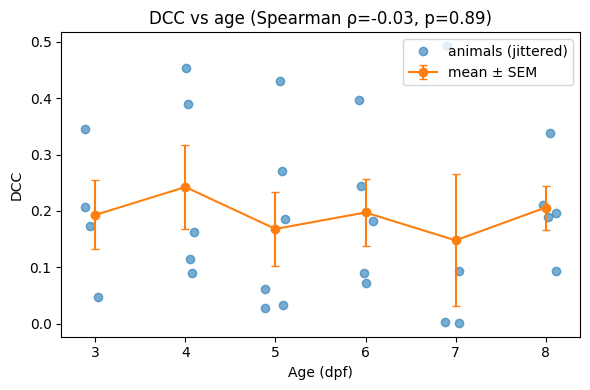

tau_size: Spearman rho=-0.679, p=3.69e-05, n=30


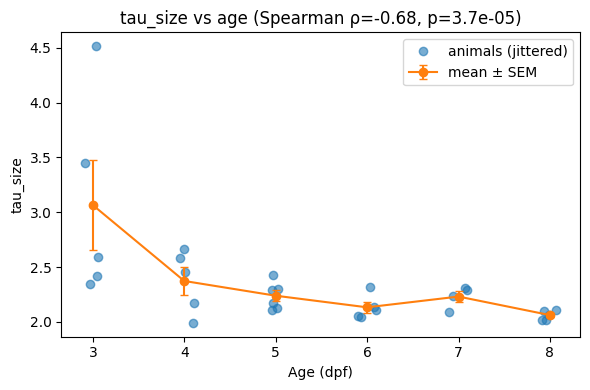

alpha_dur: Spearman rho=-0.662, p=6.71e-05, n=30


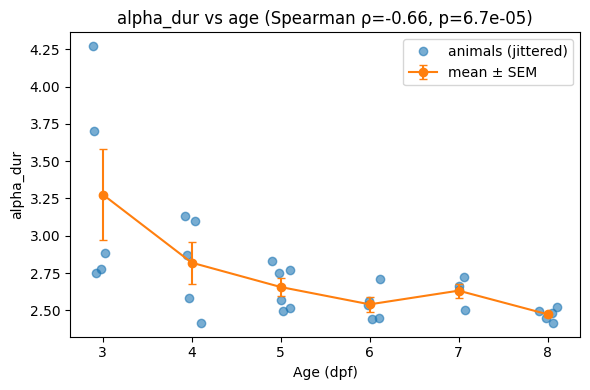

LLR size (PL vs LN): Spearman rho=-0.632, p=0.00018, n=30


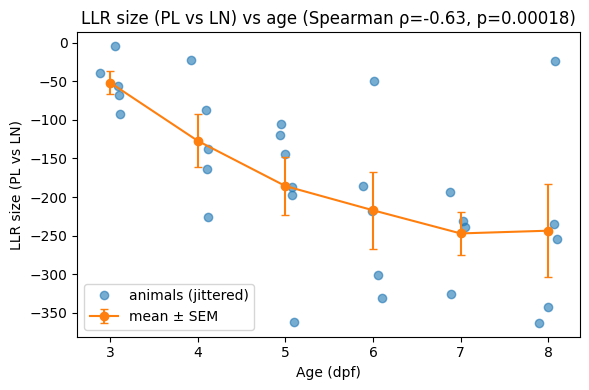

LLR dur (PL vs LN): Spearman rho=-0.778, p=4.31e-07, n=30


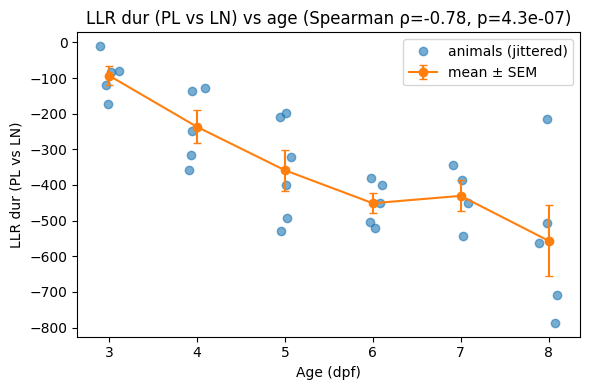

KS D size: Spearman rho=-0.032, p=0.867, n=30


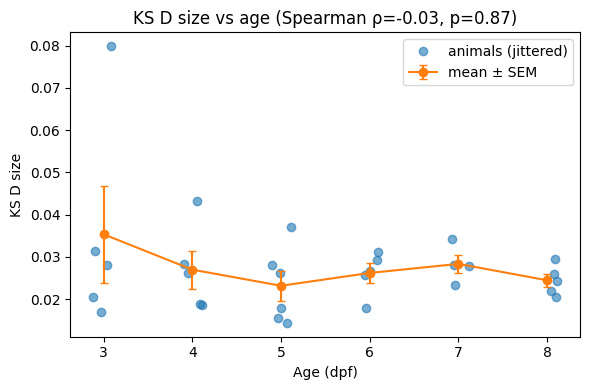

KS D dur: Spearman rho=-0.382, p=0.0372, n=30


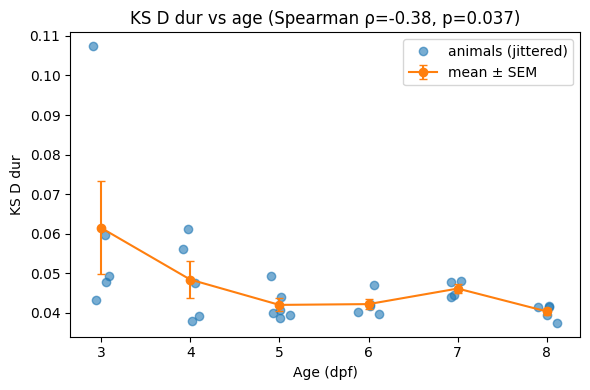

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# df_av = output from the fixed xmin+xmax run
d = df_av.copy()
d["age_dpf"] = pd.to_numeric(d["age_dpf"], errors="coerce")
d = d.dropna(subset=["age_dpf"]).sort_values("age_dpf")

vars_to_plot = {
    "DCC": "dcc",
    "tau_size": "tau_size",
    "alpha_dur": "alpha_dur",
    "LLR size (PL vs LN)": "llr_size_pl_vs_lognorm",
    "LLR dur (PL vs LN)": "llr_dur_pl_vs_lognorm",
    # optional:
    "KS D size": "ksD_size",
    "KS D dur": "ksD_dur",
}

jitter = 0.12
rng = np.random.default_rng(0)

for label, col in vars_to_plot.items():
    x = d["age_dpf"].to_numpy()
    y = pd.to_numeric(d[col], errors="coerce").to_numpy()
    ok = np.isfinite(x) & np.isfinite(y)

    rho, p = spearmanr(x[ok], y[ok]) if ok.sum() >= 3 else (np.nan, np.nan)
    print(f"{label}: Spearman rho={rho:.3f}, p={p:.3g}, n={ok.sum()}")

    g = (d.loc[ok].groupby("age_dpf", as_index=False)[col]
           .agg(mean="mean", sem=lambda s: s.std(ddof=1)/np.sqrt(max(len(s), 1))))
    g = g.sort_values("age_dpf")

    xj = x[ok] + rng.uniform(-jitter, jitter, size=ok.sum())

    plt.figure(figsize=(6,4))
    plt.plot(xj, y[ok], "o", alpha=0.6, label="animals (jittered)")
    plt.errorbar(g["age_dpf"], g["mean"], yerr=g["sem"], marker="o", capsize=3, label="mean ± SEM")
    plt.xlabel("Age (dpf)")
    plt.ylabel(label)
    plt.title(f"{label} vs age (Spearman ρ={rho:.2f}, p={p:.2g})")
    plt.legend()
    plt.tight_layout()
    plt.show()


dcc: Spearman rho=-0.026, p=0.894, n=29


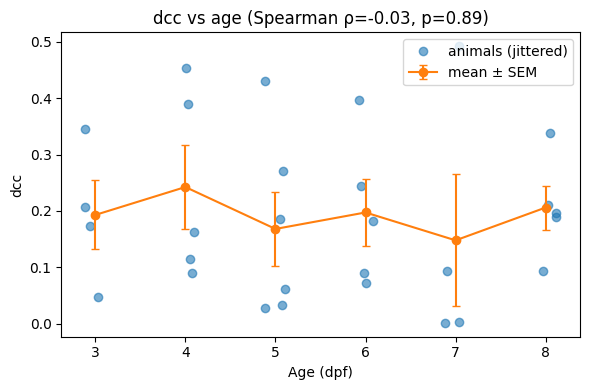

tau_size: Spearman rho=-0.679, p=3.69e-05, n=30


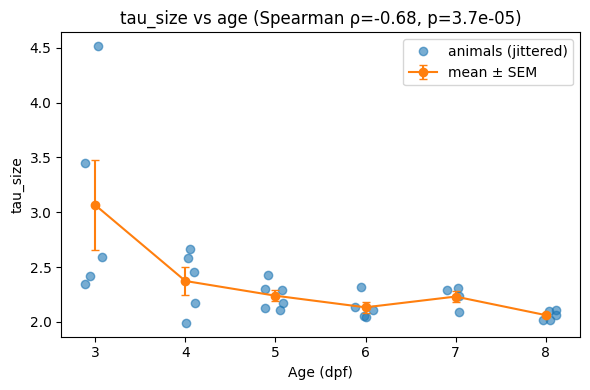

alpha_dur: Spearman rho=-0.662, p=6.71e-05, n=30


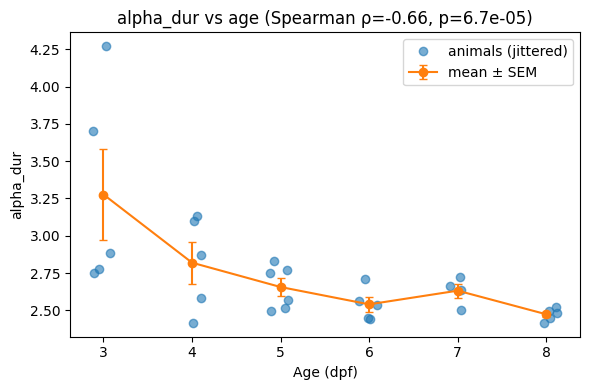

llr_size: Spearman rho=-0.632, p=0.00018, n=30


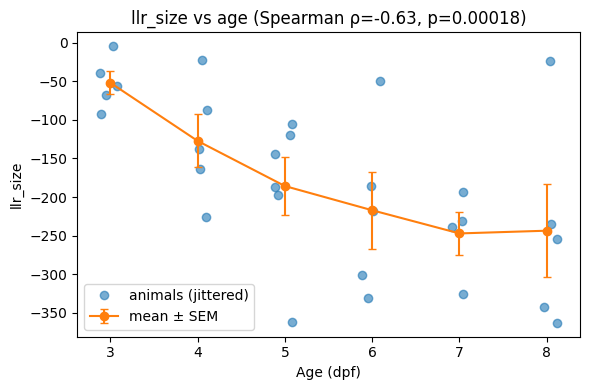

llr_dur: Spearman rho=-0.778, p=4.31e-07, n=30


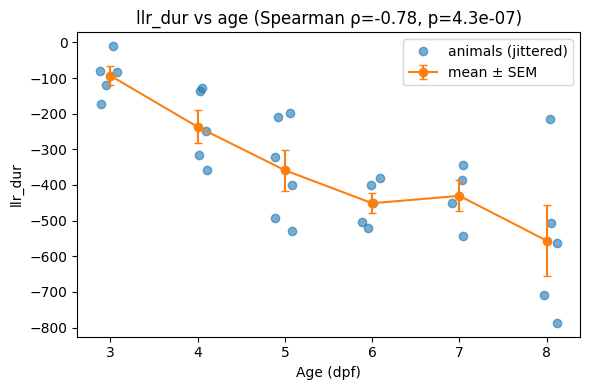

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

d = df_av.copy()
d["age_dpf"] = pd.to_numeric(d["age_dpf"], errors="coerce")
d = d.dropna(subset=["age_dpf"])

vars_to_plot = {
    "dcc": "dcc",
    "tau_size": "tau_size",
    "alpha_dur": "alpha_dur",
    "llr_size": "llr_size_pl_vs_lognorm",
    "llr_dur": "llr_dur_pl_vs_lognorm",
}

jitter = 0.12  # in "dpf" units; tweak (e.g., 0.08–0.25)

for label, col in vars_to_plot.items():
    y = pd.to_numeric(d[col], errors="coerce").to_numpy()
    x = d["age_dpf"].to_numpy()
    ok = np.isfinite(x) & np.isfinite(y)

    rho, p = spearmanr(x[ok], y[ok]) if ok.sum() >= 3 else (np.nan, np.nan)
    print(f"{label}: Spearman rho={rho:.3f}, p={p:.3g}, n={ok.sum()}")

    # per-age mean ± SEM (no jitter)
    g = (d.loc[ok].groupby("age_dpf", as_index=False)[col]
           .agg(mean="mean",
                sem=lambda s: s.std(ddof=1)/np.sqrt(max(len(s), 1))))
    g = g.sort_values("age_dpf")

    # jittered x for points only
    rng = np.random.default_rng(0)
    xj = x[ok] + rng.uniform(-jitter, jitter, size=ok.sum())

    plt.figure(figsize=(6,4))
    plt.plot(xj, y[ok], "o", alpha=0.6, label="animals (jittered)")
    plt.errorbar(g["age_dpf"], g["mean"], yerr=g["sem"], marker="o", capsize=3, label="mean ± SEM")

    plt.xlabel("Age (dpf)")
    plt.ylabel(label)
    plt.title(f"{label} vs age (Spearman ρ={rho:.2f}, p={p:.2g})")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [52]:
import numpy as np, powerlaw

x = sizes  # or durs
fit = powerlaw.Fit(x[x>0], discrete=True, xmin=2, verbose=False)

R1, p1 = fit.distribution_compare("power_law", "lognormal", normalized_ratio=False)
R2, p2 = fit.distribution_compare("lognormal", "power_law", normalized_ratio=False)

print("PL vs LN:", R1, p1)
print("LN vs PL:", R2, p2)
print("Should be ~negated:", R1 + R2)


PL vs LN: -4393.55944188584 4.311788919051708e-216
LN vs PL: 4393.55944188584 4.311788919051708e-216
Should be ~negated: 0.0


dcc: Spearman rho=-0.445, p=0.0136, n=30


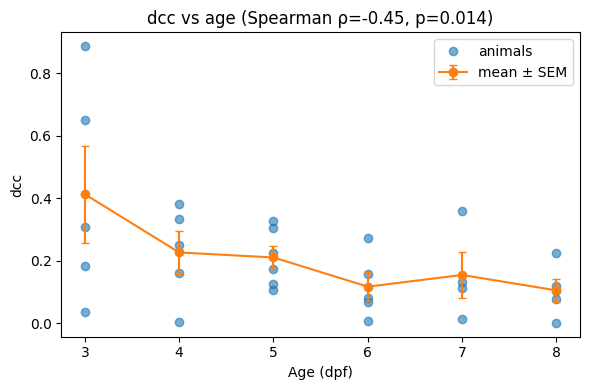

exp_s (size exponent): Spearman rho=-0.659, p=7.42e-05, n=30


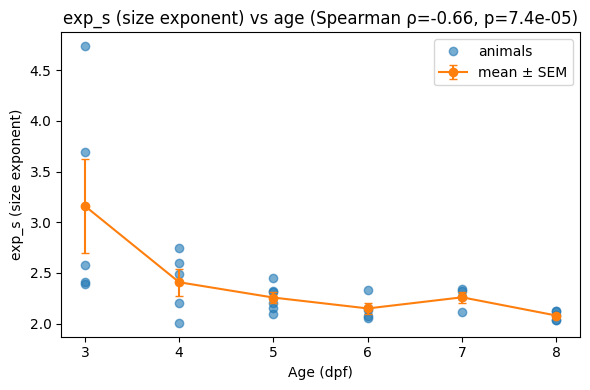

exp_d (duration exponent): Spearman rho=-0.644, p=0.000122, n=30


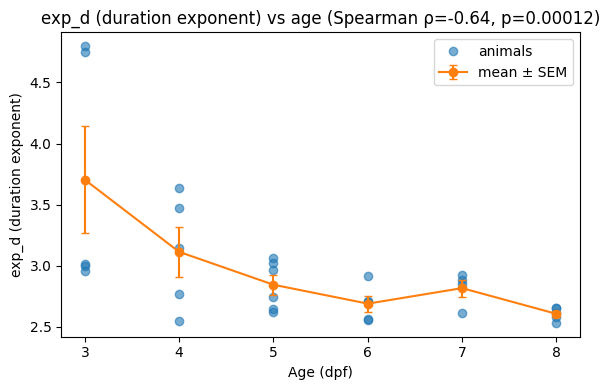

llr_s: Spearman rho=0.663, p=6.56e-05, n=30


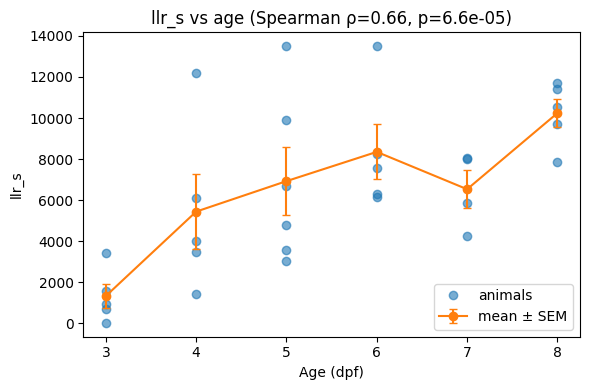

llr_d: Spearman rho=0.677, p=4e-05, n=30


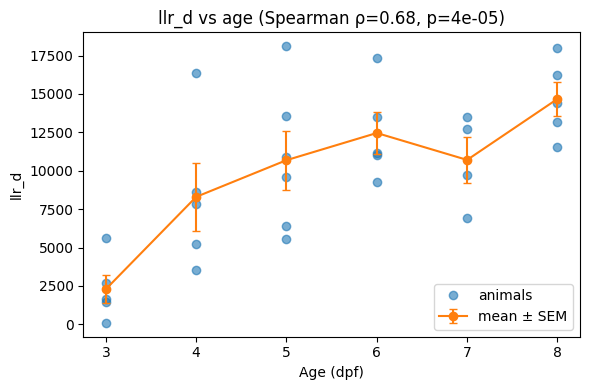

br: Spearman rho=0.615, p=0.000298, n=30


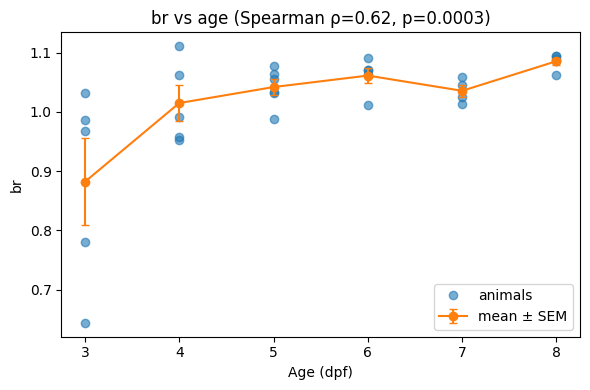

In [46]:
import os, re, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# -----------------------
# 1) Load all precomputed summaries into a dataframe
# -----------------------
fdata = "/Users/k2585057/Library/CloudStorage/Dropbox/PhD/Analysis/Project/BLNDEV-WILDTYPE"
av_l  = np.sort(glob.glob(f"{fdata}/*Tel*crit*"))

def parse_age_dpf(path):
    m = re.search(r"(\d+)\s*dpf", path)
    return int(m.group(1)) if m else np.nan

def parse_animal_id(path):
    base = os.path.basename(path)
    m = re.search(r"(BLNDEV-WILDTYPE-\d+)", base)
    return m.group(1) if m else base.split("_")[0]

rows = []
for fp in av_l:
    d = np.load(fp, allow_pickle=True).item()
    rows.append({
        "file": fp,
        "animal": parse_animal_id(fp),
        "age_dpf": parse_age_dpf(fp),
        "region": "Telencephalon" if "Telencephalon" in fp else np.nan,
        "exp_s": float(d.get("exp_s", np.nan)),
        "exp_d": float(d.get("exp_d", np.nan)),
        "llr_s": float(d.get("llr_s", np.nan)),
        "llr_d": float(d.get("llr_d", np.nan)),
        "dcc":   float(d.get("dcc",   np.nan)),
        "br":    float(d.get("br",    np.nan)),
    })

df_pre = pd.DataFrame(rows).dropna(subset=["age_dpf"]).sort_values(["age_dpf","animal"]).reset_index(drop=True)

# -----------------------
# 2) Same plots: metric vs age + Spearman
# -----------------------
vars_to_plot = {
    "dcc": "dcc",
    "exp_s (size exponent)": "exp_s",
    "exp_d (duration exponent)": "exp_d",
    "llr_s": "llr_s",
    "llr_d": "llr_d",
    # optional:
    "br": "br",
}

for label, col in vars_to_plot.items():
    x = df_pre["age_dpf"].to_numpy()
    y = pd.to_numeric(df_pre[col], errors="coerce").to_numpy()
    ok = np.isfinite(x) & np.isfinite(y)

    rho, p = spearmanr(x[ok], y[ok]) if ok.sum() >= 3 else (np.nan, np.nan)
    print(f"{label}: Spearman rho={rho:.3f}, p={p:.3g}, n={ok.sum()}")

    # per-age mean ± SEM
    g = (df_pre.loc[ok].groupby("age_dpf", as_index=False)[col]
           .agg(mean="mean",
                sem=lambda s: s.std(ddof=1)/np.sqrt(max(len(s), 1))))
    g = g.sort_values("age_dpf")

    plt.figure(figsize=(6,4))
    plt.plot(x[ok], y[ok], "o", alpha=0.6, label="animals")
    plt.errorbar(g["age_dpf"], g["mean"], yerr=g["sem"], marker="o", capsize=3, label="mean ± SEM")
    plt.xlabel("Age (dpf)")
    plt.ylabel(label)
    plt.title(f"{label} vs age (Spearman ρ={rho:.2f}, p={p:.2g})")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
#avalanche shape collapse
